In [1]:
#%pip install cftime netCDF4 xarray gpytorch torch

In [2]:
#!nvidia-smi

In [3]:
#!groups

In [4]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
import warnings
import torch
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel, Matern, DotProduct
from sklearn.decomposition import PCA
import math
import torch
from sklearn.metrics import mean_squared_error, r2_score
import gpytorch
import pandas as pd
from sklearn.preprocessing import StandardScaler
import glob
import xesmf as xe
import random
import os
import regionmask
import cartopy.crs as ccrs

gpytorch.settings.cholesky_jitter(1e-3) # Increase numerical stability
warnings.filterwarnings("ignore")
use_all_ensembles = False

# Global placeholder instantiated before function definitions
master_mean = 0
global_regridder = None
tas_template = None
taper_error_correction_preds = False # toggle to fade error correction maps or not
remove_ocean_pixels_EC = False #True # if true, removes ocean pixels from error correction masks, i.e. only focuses on the land of west antarctica --> intended to mitigate boundary errors
remove_land_pixels_EC = False
train_error_correction_framework = False #True # only works when metric = 'tas'
use_unweighted_global = False # was True in old code, meaning X used an unweighted global tas as input - should be weighted

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42) # Forces absolute reproducibility across both CPU and GPU blocks

In [5]:
use_area_weighting_in_testing = True

In [6]:

### These are needed to regrid tos data to the same format as atmospheric grids, as well as extract an ocean mask for excluding NaNs from PCA, modelling, etc.
def set_regridder(tos, tas):
    grid_in = tos.isel(time=0).rename({"latitude": "lat", "longitude": "lon"})
    grid_out = tas.isel(time=0)
    regridder = xe.Regridder(grid_in, grid_out, method="nearest_s2d", periodic=True)
    return regridder
def regrid_tos(tos, regridder=None):
    if regridder is None:
        # Fallback to the globally instantiated weight matrix directly
        regridder = globals().get('global_regridder', None)
        if regridder is None:
            raise ValueError("🚨 No valid xESMF regridder was passed or found in global memory!")
    tos_renamed = tos.rename({"latitude": "lat", "longitude": "lon"})
    tos_regridded = regridder(tos_renamed["tos"])
    #tos_regridded.isel(time=0).plot(figsize=(10, 6), cmap="coolwarm")
    return tos_regridded
def get_ocean_mask(tos_regridded):
    ocean_mask = np.isfinite(tos_regridded['tos'].isel(year=0)) # by this stage, the datasets should be processed into years, not just time, otherwise we would write 'time=0'
    total_grid_pixels = ocean_mask.size  # 144 * 192 = 27,648
    active_ocean_pixels = int(ocean_mask.sum())
    ocean_mask.plot(figsize=(8, 5), cmap="gray")
    return ocean_mask
def get_ocean_mask_fixed():
    tos_path = "/badc/cmip6/data/CMIP6/ScenarioMIP/MOHC/UKESM1-0-LL/ssp534-over/r1i1p1f2/Omon/tos/gn/latest/*nc"
    tos534 = xr.open_mfdataset(tos_path)
    ocean_mask = np.isfinite(regrid_tos(tos534).isel(time=0)) # by this stage, the datasets should be processed into years, not just time, otherwise we would write 'time=0'
    return ocean_mask

In [7]:
def load_all_ensembles_stacked(path_patterns, metric='tas', tas_template=None):
    # tas_template is used to convert Omon datasets to Amon form
    
    if isinstance(path_patterns, str):
        path_patterns = [path_patterns]
        
    files = []
    for pattern in path_patterns:
        files.extend(glob.glob(pattern, recursive=True))
        
    if len(files) == 0:
        raise FileNotFoundError(f"No files matched patterns: {path_patterns}")
        
    ensemble_groups = {}
    for f in files:
        parts = f.split('/')
        ens_tags_found = [p for p in parts if p.startswith('r') and 'i' in p]
        ens_tag = ens_tags_found[0] if len(ens_tags_found) > 0 else 'unknown'
        if ens_tag not in ensemble_groups:
            ensemble_groups[ens_tag] = []
        ensemble_groups[ens_tag].append(f)
        
    processed_ensembles = []
    for ens_tag, ens_files in ensemble_groups.items():
        try:
            if metric == "net_pr":
                pr_files = [f for f in ens_files if '/pr/' in f]
                evs_files = [f for f in ens_files if '/evspsbl/' in f]
                
                ds_pr = xr.open_mfdataset(pr_files, chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override')
                ds_evs = xr.open_mfdataset(evs_files, chunks={'time': 12},combine='by_coords', data_vars='minimal', coords='minimal', compat='override')
                
                ds_single = xr.merge([ds_pr, ds_evs], compat='override')
            else:
                ds_single = xr.open_mfdataset(ens_files, chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override')

                if metric == "tos":
                    global global_regridder
                    if global_regridder is None:
                        if tas_template is None:
                            tas_template = globals().get('tas_template', None)
                            if tas_template is None:
                                raise ValueError("⚠️ A 'tas_template' dataset must be provided to load and regrid 'tos' metrics.")
                        global_regridder = set_regridder(ds_single, tas_template)
                    ds_single = regrid_tos(ds_single, global_regridder).to_dataset(name="tos")

            days_m = ds_single['time'].dt.days_in_month
            weights_m = days_m.groupby('time.year') / days_m.groupby('time.year').sum(dim='time')
            
            if metric == "net_pr":
                ds_annual = (ds_single.get(['pr','evspsbl']) * weights_m).groupby('time.year').sum(dim='time')
                ds_annual['net_pr'] = ds_annual['pr'] - ds_annual['evspsbl']
            else:
                ds_annual = (ds_single.get([metric]) * weights_m).groupby('time.year').sum(dim='time')
                
            ds_annual.attrs['ensemble'] = ens_tag
            processed_ensembles.append(ds_annual)
        except Exception as e:
            print(f"Skipping incomplete ensemble run {ens_tag}: {e}")
    return processed_ensembles

def process_raw_to_anomalies_single(raw_dataset_locs, metric='tas'):
    if isinstance(raw_dataset_locs, str):
        raw_dataset_locs = [raw_dataset_locs]
        
    files = []
    for loc in raw_dataset_locs:
        files.extend(glob.glob(loc))
        
    if metric == "net_pr":
        pr_files = [f for f in files if '/pr/' in f]
        evs_files = [f for f in files if '/evspsbl/' in f]
        
        ds_pr = xr.open_mfdataset(pr_files, chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override')
        ds_evs = xr.open_mfdataset(evs_files, chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override')
        
        # ─── FIXED: Removed invalid coords='minimal' ───
        raw_dataset = xr.merge([ds_pr, ds_evs], compat='override')
    else:
        raw_dataset = xr.open_mfdataset(files, chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override')
        if metric == "tos":
            global global_regridder
            if global_regridder is None:
                #global_regridder = globals().get('global_regridder', None)
                raise ValueError("🚨 Pre-computed 'global_regridder' object not found in global notebook memory!")
            # Standardise coordinates to lowercase and apply the weights matrix
            raw_dataset = regrid_tos(raw_dataset, global_regridder).to_dataset(name="tos")
        
    days_test = raw_dataset['time'].dt.days_in_month
    weights_test = days_test.groupby('time.year') / days_test.groupby('time.year').sum(dim='time')
    
    if metric == "net_pr":
        raw_updated = (raw_dataset.get(['pr', 'evspsbl']) * weights_test).groupby('time.year').sum(dim='time')
        raw_updated['net_pr'] = raw_updated['pr'] - raw_updated['evspsbl']
    else:
        raw_updated = (raw_dataset.get([metric]) * weights_test).groupby('time.year').sum(dim='time')
        
    return compute_anomalies(raw_updated)


# Anomaly core utilities 
def compute_anomalies(dataset_to_convert, mean_to_use=None):
    if mean_to_use is None:
        mean_to_use = master_mean
    anom = dataset_to_convert - mean_to_use 
    anom.attrs = dataset_to_convert.attrs.copy() 
    return anom.compute()

def process_raw_to_anomalies_multi(path_patterns, metric='tas'):
    ensembles = load_all_ensembles_stacked(path_patterns, metric=metric)
    return [compute_anomalies(ens) for ens in ensembles]


def compute_grid_areas(ds, var, x='X', y='Y', RAD_EARTH = 6.387e6):
    ds = ds.copy()
    dx = np.mean(ds[x].diff(x)) * np.cos(ds[y] * np.pi / 180.) * (2 * np.pi * RAD_EARTH / 360.)
    dy = np.mean(ds[y].diff(y)) * (2 * np.pi * RAD_EARTH / 360.)
    Cell_area = dx * dy
    Cell_area, tmp = xr.broadcast(Cell_area, var)
    return Cell_area

def apply_area_weighting(dataset_test, metric='tas'):
    RAD_EARTH = 6.387e6
    for ds in [dataset_test]:
        dA = compute_grid_areas(ds, ds[metric].isel(year=0), x='lon', y='lat', RAD_EARTH = RAD_EARTH) 
        var_avg = (ds[metric] * dA).sum(['lat', 'lon']) / dA.sum(['lat', 'lon'])
        ds[f'{metric}_global'] = var_avg.compute()
    return dataset_test.transpose('year', 'lat', 'lon')

# PATH COMPILATION ARCHITECTURE
if use_all_ensembles:
    wildcard = "*"
else:
    wildcard = "r1i1p1f2"

n_lags = 10 # the target year will be the tenth year --> 9 years lead into the target 
dir_path = "/badc/cmip6/data/CMIP6/"
# possible metrics --> tas, net_pr, and using tas=[metric] where metric is net_pr --> testing other possible metrics out at the moment
# for multiple inputs, we can list them like 'tas,huss=tos' ==> split by "=" and select item 0 to get "tas,huss", and then split by ',' each time to get the input metrics
metric = "tas"

def get_wildcards_for_metric(metric):
    if "=" in metric:
        metric_wildcards = metric.split("=")
        if "," in metric_wildcards[0]:
            metric_wildcards = [*metric_wildcards[0].split(","), metric_wildcards[1]]
        if metric_wildcards[-1] == "net_pr":
            metric_wildcards = [*metric_wildcards[:-1], "pr", "evspsbl"]
    else:
        metric_wildcards = metric
        if "," in metric_wildcards:
            metric_wildcards = metric_wildcards.split(",")
            if metric_wildcards[-1] == "net_pr":
                metric_wildcards = [*metric_wildcards[:-1], "pr", "evspsbl"]
        else:
            if metric == "net_pr":
                metric_wildcards = ["pr", "evspsbl"]
            else:
                metric_wildcards = [metric]
    return metric_wildcards

metric_wildcards = get_wildcards_for_metric(metric)

def get_train_test_sets(metric, metric_wildcards):
    global master_mean
    global tas_template
    ssp126_raw_paths = []
    ssp245_raw_paths = []
    ssp585_raw_paths = []
    ds_hist_unprocessed_locs = []
    ssp370_raw_paths = []
    ssp534over_raw_paths = []

    unique_wildcards = list(dict.fromkeys(metric_wildcards))

    # Amon = atmosphere monthly, Omon = ocean monthly; need to use the right one when searching file-paths
    if metric == "tos":
        AO = 'Omon'
    elif metric in ["snw", "snc"]:
        AO = 'Lmon'
    else:
        AO = 'Amon'
    
    # Loop does exactly one job: aggregates string locations into plural storage lists
    for m_wildcard in unique_wildcards:
        ssp126_raw_paths.append(dir_path + f"ScenarioMIP/MOHC/UKESM1-0-LL/ssp126/{wildcard}/{AO}/{m_wildcard}/gn/**/*.nc")
        ssp245_raw_paths.append(dir_path + f"ScenarioMIP/MOHC/UKESM1-0-LL/ssp245/{wildcard}/{AO}/{m_wildcard}/gn/**/*.nc")

        ssp585_raw_paths.append(dir_path + f"ScenarioMIP/MOHC/UKESM1-0-LL/ssp585/{wildcard}/{AO}/{m_wildcard}/gn/**/*.nc") 
        #ssp585_raw_paths.append(dir_path + f"ScenarioMIP/MOHC/UKESM1-0-LL/ssp585/{wildcard}/{AO}/{m_wildcard}/**/*.nc") 
        
        ds_hist_unprocessed_locs.append(dir_path + f"CMIP/MOHC/UKESM1-0-LL/historical/{wildcard}/{AO}/{m_wildcard}/gn/**/*.nc")
        ssp370_raw_paths.append(dir_path + f"ScenarioMIP/MOHC/UKESM1-0-LL/ssp370/r1i1p1f2/{AO}/{m_wildcard}/gn/files/*/*.nc")
        ssp534over_raw_paths.append(dir_path + f"ScenarioMIP/MOHC/UKESM1-0-LL/ssp534-over/r1i1p1f2/{AO}/{m_wildcard}/gn/latest/*nc")
    
    # 3. EXECUTE BACKEND ENSEMBLE EXTRACTIONS
    print(f"Loading historical tracking files via wildcards for metric: {metric}...")
    historical_ensembles = load_all_ensembles_stacked(ds_hist_unprocessed_locs, metric=metric)
    
    # Isolate r1i1p1f2 historical track for clean baseline testing coordinates
    ds_hist_r1 = [ds for ds in historical_ensembles if 'r1i1p1f2' in str(ds.attrs.get('ensemble'))][0]
    
    # Calculate and commit the actual baseline climatology map to master_mean
    master_mean = ds_hist_r1.sel(year=slice(1850, 1900)).mean('year')
    print("-> Master mean climatology calculated successfully.")
    
    # 4. PARSE DATASETS NATIVELY
    print("Compiling multi-ensemble training datasets...")
    ssp126_list = process_raw_to_anomalies_multi(ssp126_raw_paths, metric=metric)
    ssp245_list = process_raw_to_anomalies_multi(ssp245_raw_paths, metric=metric)
    ssp585_list = process_raw_to_anomalies_multi(ssp585_raw_paths, metric=metric)
    
    print("Loading strict r1i1p1f2 test profiles...")
    test_ssp370 = process_raw_to_anomalies_single(ssp370_raw_paths, metric=metric)
    ds_ssp534os = process_raw_to_anomalies_single(ssp534over_raw_paths, metric=metric)
    
    ds_ssp585_r1 = [ds for ds in ssp585_list if 'r1i1p1f2' in str(ds.attrs.get('ensemble'))][0]
    
    # 5. ASSEMBLE MULTI-TRAINING TRACKS 
    training_sets = []
    for ssp_list in [ssp126_list, ssp585_list, ssp245_list]:
        for ds_ssp in ssp_list:
            ens_tag = ds_ssp.attrs.get('ensemble')
            hist_match = [h for h in historical_ensembles if h.attrs.get('ensemble') == ens_tag]
            ds_hist_match = hist_match[0] if len(hist_match) > 0 else ds_hist_r1
            
            history_slice = compute_anomalies(ds_hist_match.sel(year=slice(2015-n_lags+1, 2015-1)))
            combined_run = xr.concat([history_slice, ds_ssp], dim='year')
            training_sets.append(apply_area_weighting(combined_run, metric=metric))
    
    # 6. INTERFACE SYNCHRONIZATION FOR TESTS
    history_timelags = compute_anomalies(ds_hist_r1.sel(year=slice(2015-n_lags+1, 2015-1)))
    
    dataset_test = ds_ssp534os
    if dataset_test == ds_ssp534os:
        dataset_test = xr.concat([ds_ssp585_r1.sel(year=slice(2040-n_lags+1, 2040-1)), dataset_test], dim='year')
    else:
        dataset_test = xr.concat([history_timelags, dataset_test], dim='year')
        
    dataset_test = apply_area_weighting(dataset_test, metric=metric)
    validation_set = apply_area_weighting(xr.concat([history_timelags, test_ssp370], dim='year'), metric=metric)

    return [training_sets, dataset_test, validation_set]



In [8]:
# if tos is the only metric used, or the first in the list of predicting, we need a baseline template from an atmospheric dataset to map it to
if metric == "tos" or ("," in metric and metric.split("=")[0].split(",")[0] == 'tos') or list(set(metric.split("="))) == ['tos']:
    print("First variable found for input is 'tos'; we need to generate a generic atmosphere template for regridding...")
    baseline_tas_train, _, _ = get_train_test_sets(metric='tas', metric_wildcards=['tas'])
    # Extract the very first atmospheric scenario run and point the global tracker directly to it
    # This ensures tas_template is alive, fully configured, and globally available in memory!
    tas_template = baseline_tas_train[0].rename({"year": "time"})
    print("Baseline generated")

if '=' not in metric:
    # 1-1 Single-variable pipeline (Nice and simple)
    training_sets, dataset_test, validation_set = get_train_test_sets(metric=metric, metric_wildcards=metric_wildcards)
    print(f"\n[SUCCESS] Datasets compiled successfully!")
    print(f"-> training_sets now contains {len(training_sets)} continuous multi-ensemble timelines.")
else:
    if metric.split("=")[1] == "net_pr":
        mets = [*get_wildcards_for_metric(metric.split("=")[0]), "net_pr"]
    else:
        mets = get_wildcards_for_metric(metric)
    print("Parsed metrics list:", mets)
    
    # ─── STEP 1: ASSEMBLE INPUT FEATURE DATASETS ─────────────────────
    if len(mets) > 2: # True Multivariate Input
        input_mets = list(filter(lambda x: x != 'tas', [met for met in mets[:-1]]))
        temp_train, temp_test, temp_val = get_train_test_sets(metric='tas', metric_wildcards=metric_wildcards[0:1])
        if 'tos' in input_mets:
            tas_template = temp_train[0].rename({"year": "time"})
            
        for idx, met in enumerate(input_mets, start=1):
            cur_train, cur_test, cur_val = get_train_test_sets(metric=met, metric_wildcards=[met])
            for i, (t_set, c_set) in enumerate(zip(temp_train, cur_train)):
                temp_train[i] = xr.merge([t_set, c_set], compat='override') 
            temp_test = xr.merge([temp_test, cur_test], compat='override')
            temp_val = xr.merge([temp_val, cur_val], compat='override')
    else:
        # Bivariate structure (e.g. 'tas=tas' or 'tos=tos')
        temp_train, temp_test, temp_val = get_train_test_sets(metric=mets[0], metric_wildcards=metric_wildcards[0:1])
        
    if mets[-1] == "tos":
        tas_template = temp_train[0].rename({"year": "time"})
        
    # ─── STEP 2: EXTRACT TARGET PREDICTION DATASETS ──────────────────
    if mets[-1] in temp_train[0]: 
        print(f"✨ Optimisation Triggered: Copying full '{mets[-1]}' structures directly from RAM...")
        
        # ✅ THE FIX: Create a shallow copy of the WHOLE dataset wrapper object 
        # This keeps 'tas_global' completely intact and aligned with your validation loops!
        pr_train = [ds.copy(deep=False) for ds in temp_train]
        pr_test  = temp_test.copy(deep=False)
        pr_val   = temp_val.copy(deep=False)
        
        for idx, ds in enumerate(pr_train):
            ds.attrs['ensemble'] = temp_train[idx].attrs.get('ensemble')
    else:
        print("Setting up prediction dataset with new metric...")
        pr_train, pr_test, pr_val = get_train_test_sets(metric=mets[-1], metric_wildcards=metric_wildcards[1:])
        
    print(f"\n[SUCCESS] Datasets compiled successfully!")
print(f"-> dataset_test and validation_set remain locked onto strict r1i1p1f2 paths.")


Loading historical tracking files via wildcards for metric: tas...
-> Master mean climatology calculated successfully.
Compiling multi-ensemble training datasets...
Loading strict r1i1p1f2 test profiles...

[SUCCESS] Datasets compiled successfully!
-> training_sets now contains 3 continuous multi-ensemble timelines.
-> dataset_test and validation_set remain locked onto strict r1i1p1f2 paths.


In [9]:
if '=' in metric:
    print(temp_train)
else:
    print(training_sets)

[<xarray.Dataset> Size: 21MB
Dimensions:     (year: 95, lat: 144, lon: 192)
Coordinates:
  * lat         (lat) float64 1kB -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
  * lon         (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
  * year        (year) int64 760B 2006 2007 2008 2009 ... 2097 2098 2099 2100
Data variables:
    tas         (year, lat, lon) float64 21MB 1.578 1.579 1.583 ... 13.04 13.05
    tas_global  (year) float64 760B 0.6306 0.708 0.8141 ... 2.508 2.695 2.695
Attributes:
    ensemble:  r1i1p1f2, <xarray.Dataset> Size: 21MB
Dimensions:     (year: 95, lat: 144, lon: 192)
Coordinates:
  * lat         (lat) float64 1kB -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
  * lon         (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
  * year        (year) int64 760B 2006 2007 2008 2009 ... 2097 2098 2099 2100
Data variables:
    tas         (year, lat, lon) float64 21MB 1.578 1.579 1.583 ... 25.27 25.27
    tas_global  (year) float64 760B 0.6306 0

In [10]:
def plot_ocean_mask(ocean_mask):
    total_pixels = ocean_mask.size  # 144 * 192 = 27648
    active_ocean_pixels = int(ocean_mask.sum())
    nan_land_pixels = total_pixels - active_ocean_pixels
    
    print("--- Mask Validation Summary ---")
    print(f"Total Grid Cells (Lat x Lon): {total_pixels}")
    print(f"Valid Ocean Cells (True):     {active_ocean_pixels} ({active_ocean_pixels/total_pixels*100:.1f}%)")
    print(f"NaN Land Cells (False):       {nan_land_pixels}")
    
    # 5. Visualise the mask to verify coastlines and Antarctica are perfectly blacked out
    plt.figure(figsize=(10, 5))
    ocean_mask.plot(cmap="gray")
    plt.title("Final Clean Ocean Mask (White = Ocean, Black = Land/NaN)")
    plt.show()

if remove_ocean_pixels_EC or remove_land_pixels_EC:
    # we need to set up a mask using a generic ocean dataset and a template from an atmospheric dataset so that we can remove ocean pixels later, or land pixels
    try:
        tas_template = training_sets[0].copy().rename({"year": "time"})
    except:
        tas_template = temp_train[0].copy().rename({"year": "time"})
    global_regridder = set_regridder(
    	xr.open_mfdataset("/badc/cmip6/data/CMIP6/ScenarioMIP/MOHC/UKESM1-0-LL/ssp534-over/r1i1p1f2/Omon/tos/gn/latest/*nc", 
                          chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override'), # our ocean dataset
    	tas_template # our atmospheric template to map to
    )
    ocean_mask = get_ocean_mask_fixed()
    plot_ocean_mask(ocean_mask)
elif 'tos' in metric:
    ocean_mask = get_ocean_mask_fixed()
    if '=' in metric:
        if 'tos' in metric.split("=")[-1]:
            pr_train = [ds.where(ocean_mask) for ds in pr_train]
            pr_test = pr_test.where(ocean_mask)
            pr_val = pr_val.where(ocean_mask)
        if 'tos' in metric.split("=")[0]:
            # 1. Mask the Training Sets (List of Datasets)
            for i, ds in enumerate(temp_train):
                # We explicitly target the variables by string name
                if 'tos' in ds.data_vars:
                    temp_train[i]['tos'] = ds['tos'].where(ocean_mask)
                if 'tos_global' in ds.data_vars:
                    temp_train[i]['tos_global'] = ds['tos_global'].where(ocean_mask)
            # 2. Mask the Testing Set (Single Dataset)
            if 'tos' in temp_test.data_vars:
                temp_test['tos'] = temp_test['tos'].where(ocean_mask)
            if 'tos_global' in temp_test.data_vars:
                temp_test['tos_global'] = temp_test['tos_global'].where(ocean_mask)
            # 3. Mask the Validation Set (Single Dataset)
            if 'tos' in temp_val.data_vars:
                temp_val['tos'] = temp_val['tos'].where(ocean_mask)
            if 'tos_global' in temp_val.data_vars:
                temp_val['tos_global'] = temp_val['tos_global'].where(ocean_mask)
    else:
        # tos is the only metric - we mask everywhere in the dataset
        training_sets = [ds.where(ocean_mask) for ds in training_sets]
        dataset_test = dataset_test.where(ocean_mask)
        validation_set = validation_set.where(ocean_mask)
    plot_ocean_mask(ocean_mask) # we always plot the ocean mask if tos is used in the metric, regardless of whether it is an input or target

    if 'tos' in metric.split("=")[-1]:
        target_year = 2050
        plt.figure(figsize=(10, 5))
        if "=" in metric:
            print(pr_train[0])
            pr_train[0]['tos'].sel(year=target_year).plot(cmap="coolwarm", robust=True)
        else:
            print(training_sets[0])
            training_sets[0]['tos'].sel(year=target_year).plot(cmap="coolwarm", robust=True)
        plt.title(f"UKESM1 Sea Surface Temperature Anomalies — Year {target_year}")
        plt.show()
    else:
        print(temp_train[0])
        target_year = 2050
        
        plt.figure(figsize=(10, 5))
        temp_train[0]['tos'].sel(year=target_year).plot(cmap="coolwarm", robust=True)
        
        plt.title(f"UKESM1 Sea Surface Temperature Anomalies — Year {target_year}")
        plt.show()

In [11]:
print(metric)

tas


In [12]:
# ENSEMBLE-SAFE TREND EXTRACTION & FEATURE STACKING 
if '=' in metric: # we can't remove the global trend for our targets for most metrics; 
    # most emulators only produce global time-series of anomalies for a few variables like tas and rtmt, whereas others like net_pr may not be possible
    # we don't remove trend for tas as inputs as it is pure area-weighted global anomalies; we can't remove trends from variables where we shouldn't be able to get their time-series
    if metric.split("=")[1] != 'tas':
        enforce_removal_of_trend = False
        remove_global_trend_prior = False
    else:
        # we remove global trend if the target is tas
        enforce_removal_of_trend = True
elif metric == "tas":
    enforce_removal_of_trend = True
else:
    enforce_removal_of_trend = False
if "," in metric.split("=")[0] and metric.split("=")[1] != 'tas':
    remove_global_trend_prior = False # TURN OFF REMOVE GLOBAL TREND if we have multivariate input
    # if we manually subtract the global trend from the target, we remove the shared trend baseline that a multiple regression model can use to map relationships
    # is fine to have on for monovariate input
if enforce_removal_of_trend:
    remove_global_trend_prior = True
spatial_anomalies_sets = []
x_feature_list = []

print(f"Extracting spatial matrices. Mode: [Remove Global Trend = {remove_global_trend_prior}]")
if '=' not in metric:#not('tas' in metric.split("=")[0] and "=" in metric): # we compute as usual when predicting one metric from the same metric
    for trainset in training_sets:
        # 1. Compute the physically accurate area-weighted global mean for this specific ensemble run
        # This also guarantees the correct (year, lat, lon) dimension transposition layout natively
        trainset_weighted = apply_area_weighting(trainset,metric=metric)
        
        # 2. Extract and compile the unweighted global mean tracker for this specific ensemble timeline
        # This ensures your X features perfectly match the scenario's realization sequence!
        if use_unweighted_global:
            global_mean = trainset[metric].mean(dim=['lat', 'lon']).values.reshape(-1, 1)
        else:
            global_mean = trainset[f"{metric}_global"].values.reshape(-1, 1)
        x_feature_list.append(global_mean)
        
        # 3. DYNAMIC TARGET MATRICES TOGGLE
        if remove_global_trend_prior:
            # Subtract the area-weighted timeline from this specific ensemble's spatial maps
            spatial_grid = trainset_weighted[metric] - trainset_weighted[f"{metric}_global"]
        else:
            # Keep the absolute/long-term anomaly trend intact (Fix 3)
            spatial_grid = trainset_weighted[metric]
            
        # 4. Flatten the spatial grid map sequence and save it
        flat_grid = spatial_grid.values.reshape(len(trainset_weighted.year), -1)
        spatial_anomalies_sets.append(flat_grid)
else: # we are predicting one metric from a different metric ==> spatial_anomalies_sets needs to be the metric to predict, x_feature_list needs to be the feature to use to predict
    # need to create our dataset for multivariate
    metX, metY = metric.split("=")
    if "," not in metX:
        for trainset in temp_train:
            trainset_weighted = apply_area_weighting(trainset,metric=metX)
            if use_unweighted_global:
                global_mean = trainset[metX].mean(dim=['lat', 'lon']).values.reshape(-1, 1)
            else:
                global_mean = trainset[f"{metX}_global"].values.reshape(-1, 1)
            x_feature_list.append(global_mean)
    else: ### need to build our feature list --> another dimension for each input variable
        for trainset in temp_train:
            current_trainset_features = []
            for metXi in metX.split(","):
                trainset_weighted = apply_area_weighting(trainset,metric=metXi)
                if use_unweighted_global:
                    global_mean = trainset[metXi].mean(dim=['lat', 'lon']).values.reshape(-1, 1)
                else:
                    global_mean = trainset[f"{metXi}_global"].values.reshape(-1, 1)
                current_trainset_features.append(global_mean)
            x_feature_list.append(np.hstack(current_trainset_features))
    # the predicted metric sets stay as they were as we are still only predicting one metric
    for trainset in pr_train:
        trainset_weighted = apply_area_weighting(trainset,metric=metY)
        if use_unweighted_global:
            global_mean = trainset[metY].mean(dim=['lat', 'lon']).values.reshape(-1, 1)
        else:
            global_mean = trainset[f"{metY}_global"].values.reshape(-1, 1)
        if remove_global_trend_prior:
            spatial_grid = trainset_weighted[metY] - trainset_weighted[f"{metY}_global"]
        else:
            spatial_grid = trainset_weighted[metY]
        if metY == 'tos':
            raw_grid_values = spatial_grid.values  # Shape: (86, 144, 192)
            flat_grid = raw_grid_values[:, ocean_mask.values]
        else:
            flat_grid = spatial_grid.values.reshape(len(trainset_weighted.year), -1)
        spatial_anomalies_sets.append(flat_grid)

combined_x = np.vstack(x_feature_list)

print(f"Extraction complete!")
print(f"-> Total multi-ensemble frames inside spatial_anomalies_sets list: {len(spatial_anomalies_sets)}")
print(f"-> Synced combined_x feature input timeline shape: {combined_x.shape}")

Extracting spatial matrices. Mode: [Remove Global Trend = True]
Extraction complete!
-> Total multi-ensemble frames inside spatial_anomalies_sets list: 3
-> Synced combined_x feature input timeline shape: (285, 1)


In [13]:
print(remove_global_trend_prior)
print(enforce_removal_of_trend)

True
True


In [14]:
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import KernelPCA 
from sklearn.metrics.pairwise import rbf_kernel, linear_kernel

def get_kernel_pcas(data_2d, latitudes, n_components=16, gamma=None, plot_pcs=True, tuning=1.0):
    """
    Accepts pre-stacked 2D numpy grid arrays (Years, Spatial_Points) and latitude vector.
    Applies physical latitude weights, runs Kernel PCA (RBF), and returns components.
    """
    # 1. CREATE AREA WEIGHTS (Preserved exactly from your physics setup)
    weights_1d = np.cos(np.deg2rad(latitudes))
    weights_1d = np.clip(weights_1d, 0, None)
    weights_2d = np.repeat(np.sqrt(weights_1d)[:, np.newaxis], 192, axis=1)
    flat_weights = weights_2d.flatten() # Shape: (144 * 192,)
    
    # 2. APPLY WEIGHTING: Scale spatial variance naturally
    data_scaled = data_2d * flat_weights

    # ─── NEW: CALCULATE AUTOMATIC GAMMA VIA MEDIAN DISTANCE TRICK ───
    if gamma is None or gamma == "auto_median":
        # 1. Calculate the Euclidean distance between every pair of years
        # sq_distances shape: (n_samples, n_samples)
        sq_distances = pairwise_distances(data_scaled, metric='sqeuclidean')
        
        # 2. Extract only the upper triangle (excluding the 0-distance diagonal)
        triu_indices = np.triu_indices_from(sq_distances, k=1)
        median_sq_dist = np.median(sq_distances[triu_indices])
        
        # Avoid divide-by-zero if your data has duplicate years
        if median_sq_dist == 0:
            median_sq_dist = 1e-7
            
        # 3. Calculate gamma: 1 / (2 * median_squared_distance)
        gamma = tuning * (1.0 / (2.0 * median_sq_dist))
        print(f"[GAMMA AUTO-TUNING] Calculated Median-Trick Gamma: {gamma:.4e}")
    # ────────────────────────────────────────────────────────────────
    
    # 3. RUN KERNEL PCA
    # Note: KernelPCA does not accept float variance thresholds (like 0.8). 
    # You must provide an explicit integer number of components (e.g., n_components=16)
    kpca = KernelPCA(
        n_components=n_components, 
        kernel='rbf', 
        gamma=gamma,                  # If None, defaults to 1 / 27648 features
        fit_inverse_transform=True   # CRITICAL: Required for map reconstructions later!
    )
    
    # This generates your non-linear Y target matrix for the GP model
    pca_coefficients = kpca.fit_transform(data_scaled)    
    
    if plot_pcs:
        print(f"[KERNEL PCA] Number of non-linear PCs chosen: {n_components}")
        print(f"Shape of coefficients for GP: {pca_coefficients.shape}") # (288, 16)
        
        # ─── DIAGNOSTIC PLOT: The Year-vs-Year Similarity Matrix ───
        plt.figure(figsize=(8, 6))
        K = kpca._get_kernel(data_scaled) # Access internal kernel matrix
        plt.imshow(K, cmap='viridis', origin='lower')
        plt.title("Kernel Similarity Matrix (Years vs Years Geometry)")
        plt.colorbar(label="Non-linear Similarity Score")
        plt.show()


        # 1. Ensure dimensions match: columns are features, rows are samples
        # stacked shape: (samples, original_grid_points)
        # pca_coefficients shape: (samples, n_components)
        num_components = pca_coefficients.shape[1]
        num_features = stacked.shape[1]
        
        # 2. Vectorised calculation of Pearson Correlation between original features and KPCA components
        # Subtract means to center data
        stacked_centered = stacked - np.mean(stacked, axis=0)
        pca_centered = pca_coefficients - np.mean(pca_coefficients, axis=0)
        
        # Calculate standard deviations
        stacked_std = np.std(stacked, axis=0)
        pca_std = np.std(pca_coefficients, axis=0)
        
        # Avoid divide-by-zero errors for invariant grid cells (e.g., deserts, poles)
        stacked_std[stacked_std == 0] = 1e-12
        pca_std[pca_std == 0] = 1e-12
        
        # Compute the correlation matrix matrix: shape (num_components, num_features)
        correlation_matrix = (np.dot(pca_centered.T, stacked_centered) / len(stacked)) / np.outer(pca_std, stacked_std)
        
        # 3. Create the Correlation Heatmap
        plt.figure(figsize=(12, 6))
        
        # If your features are flattened spatial grid cells, it's often best to look at 
        # the overall distribution across components first.
        # We limit to showing a subset of features if the grid is massive, or plot the full matrix.
        sns.heatmap(
            correlation_matrix[:, :200], # Showing first 200 grid features for clean rendering
            cmap="RdBu_r",               # Red/Blue diverging palette (perfect for correlations)
            vmin=-1, vmax=1,             # Strict bounds for correlation
            cbar_kws={'label': 'Pearson Correlation Coefficient'}
        )
        
        plt.title(f"Feature Correlation Heatmap: Original Grid Space vs. KPCA Components ({metric})")
        plt.xlabel("Original Flattened Spatial Features (Grid Cells)")
        plt.ylabel("Learned KPCA Components")
        plt.tight_layout()
        plt.show()

        
    return flat_weights, kpca, pca_coefficients


In [15]:
# =========================================================
# FIXED PCA FUNCTION (Includes Latitude Cosine Weighting)
# =========================================================
use_ocean_mask = False
if '=tos' in metric:
    use_ocean_mask = True
def get_pcas(data_2d, latitudes, n_components=0.8, plot_pcs=True, use_ocean_mask=use_ocean_mask):
    """
    Accepts pre-stacked 2D numpy grid arrays (Years, Spatial_Points) and latitude vector.
    Scales features geometrically using cosine weighting, runs PCA, and returns weights.
    """
    global ocean_mask
    # 1. CREATE AREA WEIGHTS: (144, 192) grid map based on physical latitude geometry
    # Cosine of latitude shrinks toward poles. We use sqrt so when variance is computed later (squared),
    # the linear area weight scales perfectly proportional to true geographic surface area.
    weights_1d = np.cos(np.deg2rad(latitudes))
    weights_1d = np.clip(weights_1d, 0, None)  # Safety clip to handle numerical precision at poles
    weights_2d = np.repeat(np.sqrt(weights_1d)[:, np.newaxis], 192, axis=1)
    flat_weights = weights_2d.flatten()          # Shape: (144 * 192,)

    if use_ocean_mask:
        flat_weights = flat_weights[ocean_mask.values.flatten()]
    
    # 2. APPLY WEIGHTING: Scale spatial variance naturally
    # Multiply every year's map row by the area weight vector row
    data_scaled = data_2d * flat_weights
    
    # 3. RUN PCA: Fit on the properly weighted spatial grids
    pca = PCA(n_components=n_components)
    pca_coefficients = pca.fit_transform(data_scaled)    
    pca_comps_count = len(pca.components_)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Setup coordinates for maximum distance geometric line projection
    x = np.arange(len(cumulative_variance))
    y = cumulative_variance
    
    # Define a straight line connecting the first and last component coordinates
    start_point = np.array([x[0], y[0]])
    end_point = np.array([x[-1], y[-1]])
    line_vector = end_point - start_point
    line_vector_norm = line_vector / np.linalg.norm(line_vector)
    
    # Measure perpendicular distance of every point to the baseline chord
    distances = []
    for i in range(len(y)):
        point = np.array([x[i], y[i]])
        start_to_point = point - start_point
        # Calculate the vector projection length onto the straight path
        projection = start_to_point - np.dot(start_to_point, line_vector_norm) * line_vector_norm
        distances.append(np.linalg.norm(projection))
        
    # The maximum distance indicates the location of the absolute geometric elbow point
    optimal_num_pcs = int(np.argmax(distances) + 1)
    
    print("\n--- AUTOMATED ELBOW DETECTION GRAPH ---")
    print(f"First-pass components extracted: {len(cumulative_variance)}")
    print(f"Mathematical Elbow Point Found: Keep {optimal_num_pcs} PCs")
    if pca_comps_count < 15:
        print('Original number of PCs < 15; keeping all 15 as only a small number to begin with')
    else:
        print('Original PCs exceeds 15, cutting down to optimal ELBOW count')
    
        # Force scikit-learn metadata and coefficient columns to crop to the elbow threshold
        pca_coefficients = pca_coefficients[:, :optimal_num_pcs]
        pca.components_ = pca.components_[:optimal_num_pcs]
        pca.explained_variance_ratio_ = pca.explained_variance_ratio_[:optimal_num_pcs]
        pca.n_components_ = optimal_num_pcs
    # ───────────────────────────────────────────────────

    # 4. RECONSTRUCT PATTERNS USING REFINED SPATIAL COEFFICIENTS
    spatial_patterns_flat = pca.components_ # Shape: (optimal_num_pcs, Active_Ocean_Pixels)
    
    if use_ocean_mask:
        # Rebuild a full 3D global array filled with NaNs so imshow can render it
        spatial_patterns = np.full((optimal_num_pcs, 144, 192), np.nan)
        for i in range(optimal_num_pcs):
            spatial_patterns[i, ocean_mask.values] = spatial_patterns_flat[i, :]
    else:
        # Fallback default for atmospheric variables where every pixel is valid
        spatial_patterns = spatial_patterns_flat.reshape(-1, 144, 192)    
    
    if plot_pcs:
        print(f"Number of PCs chosen: {pca.n_components_}")
        print(f"Shape of coefficients for GP: {pca_coefficients.shape}")
        n_pcs = len(spatial_patterns)
        cols = 3
        rows = math.ceil(n_pcs / cols)
        fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
        axes = axes.flatten()
        
        for i in range(n_pcs):
            im = axes[i].imshow(spatial_patterns[i], cmap='RdBu_r', origin='lower')
            axes[i].set_title(f'Principal Component {i}')
            plt.colorbar(im, ax=axes[i], label='Area-Weighted Amplitude')
            
        for j in range(n_pcs, len(axes)):
            fig.delaxes(axes[j])
            
        plt.tight_layout()
        plt.show()
        
    return flat_weights, pca, pca_coefficients
    """
    # 4. RECONSTRUCT PATTERNS
    spatial_patterns = pca.components_.reshape(-1, 144, 192)
    
    if plot_pcs:
        print(f"Number of PCs chosen: {pca.n_components_}")
        print(f"Shape of coefficients for GP: {pca_coefficients.shape}")
        n_pcs = len(spatial_patterns)
        cols = 3
        rows = math.ceil(n_pcs / cols)
        fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
        axes = axes.flatten()
        
        for i in range(n_pcs):
            im = axes[i].imshow(spatial_patterns[i], cmap='RdBu_r', origin='lower')
            axes[i].set_title(f'Principal Component {i}')
            plt.colorbar(im, ax=axes[i], label='Area-Weighted Amplitude')
            
        for j in range(n_pcs, len(axes)):
            fig.delaxes(axes[j])
            
        plt.tight_layout()
        plt.show()
        
    return flat_weights, pca, pca_coefficients
    """



--- AUTOMATED ELBOW DETECTION GRAPH ---
First-pass components extracted: 9
Mathematical Elbow Point Found: Keep 4 PCs
Original number of PCs < 15; keeping all 15 as only a small number to begin with
Number of PCs chosen: 9
Shape of coefficients for GP: (285, 9)


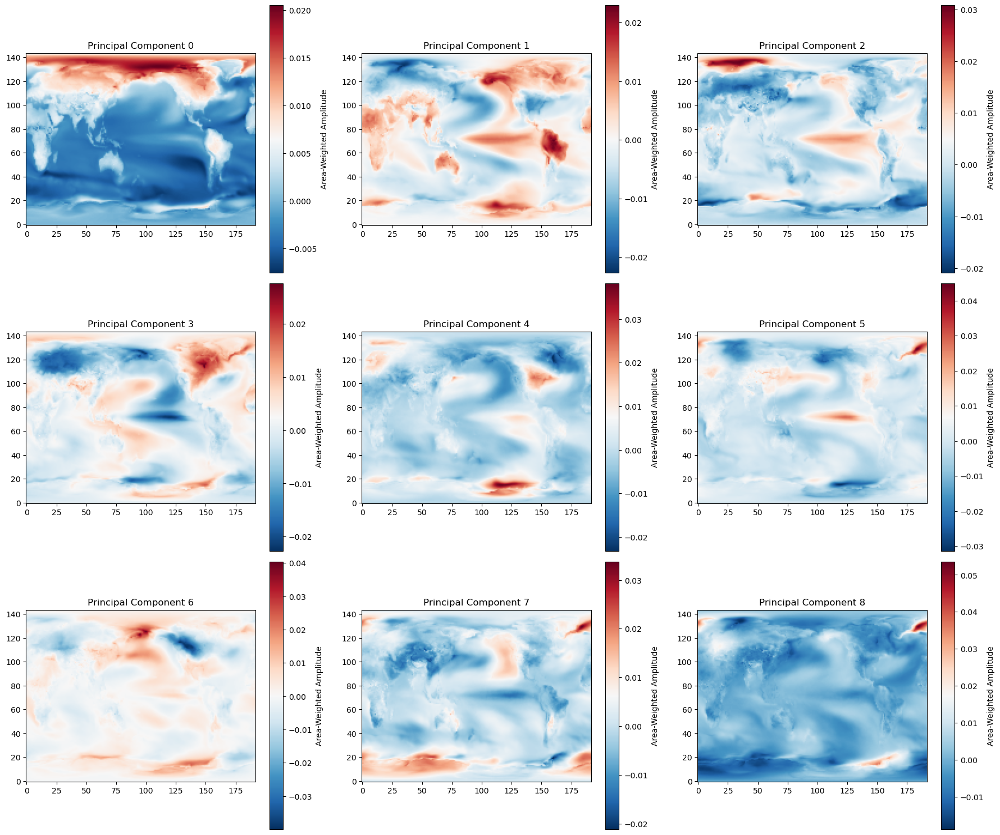

In [16]:
### Make sure this carefully handles multivariate inputs

use_kpca = False
if '=' in metric:#'tas' in metric.split("=")[0] and "=" in metric:
    training_metric, temporary_metric = metric.split("=")
else:
    temporary_metric = metric
    training_metric = metric
# 1. Stack raw spatial inputs vertically
if hasattr(spatial_anomalies_sets[0], temporary_metric):
    stacked = np.vstack([ds[temporary_metric].values.reshape(len(ds[temporary_metric]['year']), -1) for ds in spatial_anomalies_sets])
    # Extract the 144 latitude values from your training structures
    latitudes = spatial_anomalies_sets[0].lat.values
else:
    stacked = np.vstack(spatial_anomalies_sets)
    if '=' in metric:#'tas' in metric.split("=")[0] and "=" in metric:
        if isinstance(temp_train, list):
            latitudes = temp_train[0].lat.values
        else:
            latitudes = temp_train.lat.values
    else:
        latitudes = training_sets[0].lat.values
        #latitudes = np.linspace(-90, 90, 144) # Fallback if data is raw numpy

if "net_pr" in metric or use_kpca:
    comps = 8 ### 84 components get chosen for net_pr if we use 0.8 explained var; not going to work well
else:
    comps = 0.8

# 2. Get PCA patterns - NOW RETURNS THE GEOGRAPHIC WEIGHT VECTOR INSTEAD OF SCALER
if use_kpca:
    flat_weights, pcas, pca_coefficients = get_kernel_pcas(stacked, latitudes, n_components=comps, 
                                                           gamma=None,#5e5, 
                                                           plot_pcs=True,
                                                          tuning=3)
else:
    flat_weights, pcas, pca_coefficients = get_pcas(stacked, latitudes, n_components=comps, plot_pcs=True)

## Once we've calculated PCA with pr_train, we no longer need the training data for precipitation --> we can set training_sets to temp_train
if '=' in metric:#'tas' in metric.split("=")[0] and "=" in metric:
    training_sets = temp_train

### Already handled earlier, this is redundant
'''
# 3. Convert training scenarios to global mean values for X inputs
combined_x = np.concatenate(
    [ds[training_metric].mean(dim=['lat','lon']).values for ds in training_sets]
).reshape(-1, 1)
'''
#4. dont scale x yet - do scaling just before the model training
# 5. Handle targets (Y PCA coefficients)
all_y_scaled = pca_coefficients

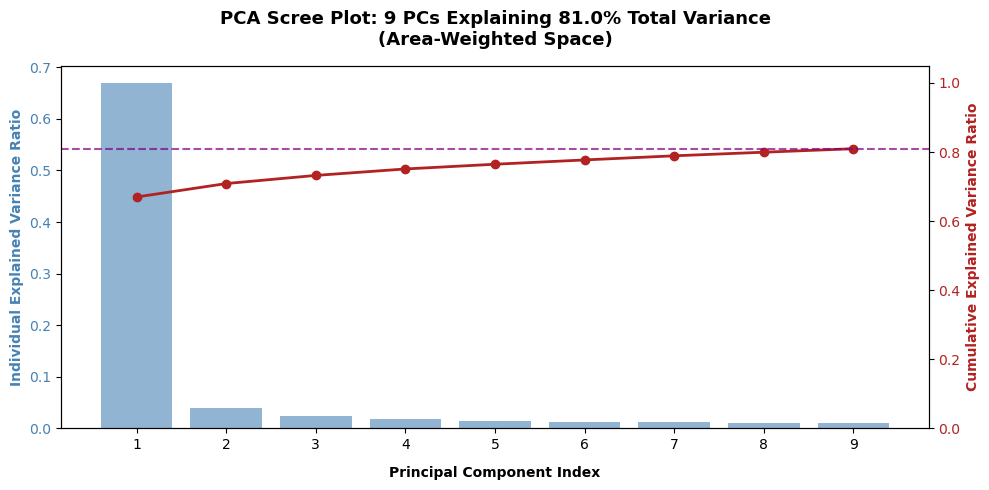

In [17]:
if not use_kpca:
    # Let us visualise the contributions of each principal component to explained variance
    # =========================================================
    # --- PCA SCREE PLOT VISUALIZATION ---
    # =========================================================
    
    # 1. Extract variance data directly from your fitted 'pcas' object
    exp_var_ind = pcas.explained_variance_ratio_
    exp_var_cum = np.cumsum(exp_var_ind)
    num_comps_chosen = pcas.n_components_
    
    # 2. Setup indices for the x-axis
    components_x = np.arange(1, num_comps_chosen + 1)
    
    # 3. Create dual-axis subplot
    fig, ax1 = plt.subplots(figsize=(10, 5))
    
    # --- PRIMARY Y-AXIS: Individual Explained Variance (Bars) ---
    color_bar = 'steelblue'
    ax1.set_xlabel('Principal Component Index', fontweight='bold', labelpad=10)
    ax1.set_ylabel('Individual Explained Variance Ratio', color=color_bar, fontweight='bold')
    bars = ax1.bar(components_x, exp_var_ind, color=color_bar, alpha=0.6, label='Individual Variance')
    ax1.tick_params(axis='y', labelcolor=color_bar)
    ax1.set_xticks(components_x)  # Enforce clear integers on the ticks index
    
    # --- SECONDARY Y-AXIS: Cumulative Explained Variance (Line) ---
    ax2 = ax1.twinx()  
    color_line = 'firebrick'
    ax2.set_ylabel('Cumulative Explained Variance Ratio', color=color_line, fontweight='bold')
    line = ax2.plot(components_x, exp_var_cum, color=color_line, marker='o', linewidth=2, label='Cumulative Variance')
    ax2.tick_params(axis='y', labelcolor=color_line)
    ax2.set_ylim(0, 1.05)  # Constrain bounds cleanly to percentage scale
    
    # 4. Add visual target anchors to track your 80% threshold
    target_threshold = np.sum(exp_var_ind) # Will exactly match your n_components configuration (e.g., 0.8)
    ax2.axhline(y=target_threshold, color='purple', linestyle='--', alpha=0.7, 
                label=f'Target Threshold ({target_threshold*100:.0f}%)')
    
    # 5. Clean layout adjustments
    plt.title(f'PCA Scree Plot: {num_comps_chosen} PCs Explaining {target_threshold*100:.1f}% Total Variance\n(Area-Weighted Space)', 
              fontsize=13, fontweight='bold', pad=15)
    fig.tight_layout()
    plt.show()


Now, we want to create temporal windows, i.e. each row isn't just a year, but a year with the previous n years before it included, so that points aren't just spatially resolved by the PCA but also temporally - a key drawback to the GP in ClimateBench was this lack of temporal resolution for the GP.

First, fit PCA on combined stack of scenarios using the same basis.

Next, we need to apply StandardScaler to each scenario's x and y PCA values separately to get in the same range ready for machine learning.

Then, we need to generate the temporal lags for each scaled scenario.

After, we can concatenate them safely into one big dataset.

In [18]:
print(combined_x.shape)

(285, 1)


In [19]:
# SPLIT BACK TO SCENARIOS TO BUILD LAGS SAFELY
years_per_scenario = [len(scenario.year) for scenario in training_sets]
#print(years_per_scenario)

scaled_sets_x = []
scaled_sets_y = []
current_index = 0
for i in range(0, len(years_per_scenario)):
    if i == 0:
        current_index = 0
        next_index = years_per_scenario[i]
    else:
        current_index = next_index
        next_index = current_index + years_per_scenario[i]
    scaled_sets_x.append(combined_x[current_index:next_index]) # x is not scaled just yet
    scaled_sets_y.append(all_y_scaled[current_index:next_index])
    #print(current_index, next_index)

def build_lagged_dataset(scaled_x, scaled_y, n_lags=3, add_historical_years=True):
    """
    Creates temporal lag features for a single continuous scenario timeline.
    
    Parameters:
    - scaled_x: NumPy array of shape (Years, 1) containing global mean features.
    - scaled_y: NumPy array of shape (Years, Num_PCs) containing target coefficients.
    - n_lags: Total length of the lookback window (e.g., 3 handles t, t-1, t-2).
    - add_historical_years: if True, we need to prepend years of historical anomalies,
                            so that when we trim the data to have full lags, we have all the intended years.
                            i.e. if we have n_lags=10, we lose the first 10 years of the dataset --> not good;
                            ==> our scenarios start with 2015-2049; just take n_lags years from the end of 
                            historical anomalies and prepend before we calculate time lags.
    """
    historical_prepend = "" #### TODO - define the spatial anomaly years to use using n_lags - THIS IS SORTED ABOVE WHERE WE NATIVELY PREPEND HISTORICAL
    ### rest of code should smoothly handle this change

    
    num_years = len(scaled_x)
    
    # Storage for the transformed matrices
    lagged_x_list = []
    sliced_y_list = []
    
    # Start the loop after the lag buffer to ensure history exists
    for t in range(n_lags - 1, num_years):
        # 1. Harvest the lookback window from (t - lags + 1) up to and including (t)
        # For n_lags=3, this grabs rows at indices [t-2, t-1, t]
        time_window = scaled_x[t - n_lags + 1 : t + 1]
        
        # 2. Flatten the window horizontally from a 2D matrix into a 1D vector row
        # (e.g., shape (3, 1) becomes a flat row array of shape (3,))
        flat_row = time_window.flatten()
        lagged_x_list.append(flat_row)
        
        # 3. Match it with the target coefficients corresponding strictly to year (t)
        sliced_y_list.append(scaled_y[t])
        
    return np.array(lagged_x_list), np.array(sliced_y_list)

# Create temporary lists to collect the rows from every scenario
all_scenarios_x = []
all_scenarios_y = []


# 1. Run the lagging function across all pairs at once
processed_pairs = [build_lagged_dataset(x, y, n_lags=n_lags) for x, y in zip(scaled_sets_x, scaled_sets_y)]

# 2. Extract and stack the raw X lag matrices vertically
raw_train_x_stacked = np.vstack([pair[0] for pair in processed_pairs])

# 3. FIT AND TRANSFORM THE SCALER HERE (The Final Fix!)
scaler_x = StandardScaler()
scaled_train_x_stacked = scaler_x.fit_transform(raw_train_x_stacked)

# 4. Convert both to clean PyTorch Tensors for your Batch GP
train_x = torch.tensor(scaled_train_x_stacked).float()
train_y = torch.tensor(np.vstack([pair[1] for pair in processed_pairs])).float()

# Verify your final shapes match the Batch GP expectations
print(f"Final combined train_x shape: {train_x.shape}") # Expect: (Total_Valid_Years, n_lags)
print(f"Final combined train_y shape: {train_y.shape}") # Expect: (Total_Valid_Years, Num_PCs)
print("First 5 rows of train_x - check it looks as expected")
print(train_x[:5])


Final combined train_x shape: torch.Size([258, 10])
Final combined train_y shape: torch.Size([258, 9])
First 5 rows of train_x - check it looks as expected
tensor([[-1.5247, -1.4915, -1.4363, -1.4374, -1.4249, -1.4000, -1.4519, -1.4115,
         -1.3911, -1.3824],
        [-1.4660, -1.4114, -1.4156, -1.4050, -1.3808, -1.4337, -1.3918, -1.3698,
         -1.3626, -1.3707],
        [-1.3855, -1.3906, -1.3830, -1.3605, -1.4148, -1.3731, -1.3498, -1.3411,
         -1.3508, -1.3201],
        [-1.3646, -1.3578, -1.3382, -1.3948, -1.3536, -1.3307, -1.3208, -1.3292,
         -1.2998, -1.2425],
        [-1.3315, -1.3128, -1.3727, -1.3331, -1.3109, -1.3014, -1.3088, -1.2779,
         -1.2215, -1.1357]])


In [20]:
# Returns True if ANY element is a NaN, False if completely clean
print("Are there NaNs in train_x?", torch.isnan(train_x).any().item())
print("Are there NaNs in train_y?", torch.isnan(train_y).any().item())

Are there NaNs in train_x? False
Are there NaNs in train_y? False


Below, we train our GPs as a batch. This outputs a batch where we have to use indexing to access the relevant GP for each PC, and then for each scenario.

In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import gpytorch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if not use_kpca:
    num_pcs = int(pcas.n_components_)
else:
    num_pcs = int(pcas.n_components)

if "," in metric:
    num_variables = len(metric.split("=")[0].split(","))
else:
    num_variables = 1

# Ensure the tensors are correctly oriented for the LSTM
train_x_model = train_x.view(-1, n_lags, num_variables).float().to(device)  # Shape: [Total_Valid_Years, n_lags, 1]
train_y_model = train_y.float().to(device)               # Shape: [Total_Valid_Years, 7]


In [22]:
print(num_variables)

1


In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import gpytorch

# STEP 1: STANDALONE LSTM FEATURE EXTRACTOR (Kept completely independent)
class LSTMFeatureExtractor(nn.Module):
    def __init__(self, input_dim=num_variables, hidden_dim=128, num_layers=2):
        super(LSTMFeatureExtractor, self).__init__()
        
        self.lstm = nn.LSTM(
            input_size=input_dim, 
            hidden_size=hidden_dim, 
            num_layers=num_layers, 
            batch_first=True,
            dropout=0.2 if num_layers > 1 else 0.0,
            bidirectional=True  
        )
        lstm_out_dim = hidden_dim * 2
        self.attention_weight = nn.Linear(lstm_out_dim, 1)
        
        self.post_lstm = nn.Sequential(
            nn.Linear(lstm_out_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.GELU()
        )

    def forward(self, x):
        # Expects standard sequential 3D tensor: [Total_Valid_Years, 10, 1]
        lstm_out, _ = self.lstm(x)
        
        attn_scores = self.attention_weight(lstm_out)
        attn_weights = F.softmax(attn_scores, dim=1)
        
        context = torch.sum(lstm_out * attn_weights, dim=1)
        latent_features = self.post_lstm(context)
        return latent_features  # Shape: [Total_Valid_Years, 128]

In [24]:
"""
Most complex model class - typically does well with ssp370 but weaker on 534-os compared to the other classes below
"""
'''
class ClimateExactGP(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood, num_pcs, hidden_dim=128):
        super(ClimateExactGP, self).__init__(train_x, train_y, likelihood)
        
        # Ensure num_pcs matches the exact tensor type needed
        num_pcs = int(num_pcs)
        pc_batch_shape = torch.Size([num_pcs])
        
        # 1. MEAN FUNCTION
        self.mean_module = gpytorch.means.ConstantMean(batch_shape=pc_batch_shape)

        # 2. SHORT-TERM VARIABILITY KERNEL (ARD Operating over the 128 Latent Dimensions)
        self.short_term_matern = gpytorch.kernels.MaternKernel(
            nu=1.5, 
            ard_num_dims=hidden_dim, # ─── CHANGED: Now scans the 128 LSTM outputs
            batch_shape=pc_batch_shape,
            lengthscale_constraint=gpytorch.constraints.Interval(0.01, 10.0) 
        )
        self.short_term_scale = gpytorch.kernels.ScaleKernel(
            self.short_term_matern,
            batch_shape=pc_batch_shape
        )
        
        # 3. SMOOTH DECADAL CYCLE KERNEL (Locally Periodic in Latent Space)
        smooth_matern = gpytorch.kernels.MaternKernel(
            nu=2.5,
            batch_shape=pc_batch_shape,
            lengthscale_constraint=gpytorch.constraints.Interval(1.0, 15.0)
        )
        periodic = gpytorch.kernels.PeriodicKernel(
            batch_shape=pc_batch_shape,
            period_length_constraint=gpytorch.constraints.Interval(0.02, 0.5) 
        )
        self.cyclic_scale = gpytorch.kernels.ScaleKernel(
            smooth_matern * periodic,
            batch_shape=pc_batch_shape
        )
        
        # 4. LONG-TERM BACKGROUND TREND TRACKER (Quadratic Kernel for Acceleration)
        # Bypasses the need for a separate linear nn.Linear layer!
        self.trend_scale = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.PolynomialKernel(power=2, batch_shape=pc_batch_shape),
            batch_shape=pc_batch_shape
        )

        # 5. HIGH-FIDELITY ADDITIVE COMPOSITE ARCHITECTURE
        self.covar_module = self.short_term_scale + self.cyclic_scale + self.trend_scale

    def forward(self, x):
        # x shape: [7, Total_Valid_Years, 128]
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        
        # Returns a clean, high-fidelity multivariate normal distribution
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)
'''

'\nclass ClimateExactGP(gpytorch.models.ExactGP):\n    def __init__(self, train_x, train_y, likelihood, num_pcs, hidden_dim=128):\n        super(ClimateExactGP, self).__init__(train_x, train_y, likelihood)\n\n        # Ensure num_pcs matches the exact tensor type needed\n        num_pcs = int(num_pcs)\n        pc_batch_shape = torch.Size([num_pcs])\n\n        # 1. MEAN FUNCTION\n        self.mean_module = gpytorch.means.ConstantMean(batch_shape=pc_batch_shape)\n\n        # 2. SHORT-TERM VARIABILITY KERNEL (ARD Operating over the 128 Latent Dimensions)\n        self.short_term_matern = gpytorch.kernels.MaternKernel(\n            nu=1.5, \n            ard_num_dims=hidden_dim, # ─── CHANGED: Now scans the 128 LSTM outputs\n            batch_shape=pc_batch_shape,\n            lengthscale_constraint=gpytorch.constraints.Interval(0.01, 10.0) \n        )\n        self.short_term_scale = gpytorch.kernels.ScaleKernel(\n            self.short_term_matern,\n            batch_shape=pc_batch_shape\

In [25]:
'''
"""
Simplest version of the GP model class
"""
class ClimateExactGP(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood, num_pcs, hidden_dim=128):
        super(ClimateExactGP, self).__init__(train_x, train_y, likelihood)
        pc_batch_shape = torch.Size([int(num_pcs)])
        
        # 1. The GP component tracks non-linear variations
        self.mean_module = gpytorch.means.ConstantMean(batch_shape=pc_batch_shape)
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.MaternKernel(nu=1.5, ard_num_dims=hidden_dim, batch_shape=pc_batch_shape),
            batch_shape=pc_batch_shape
        )
        
        # 2. Add an explicit, parallel linear trend processor
        # This bypasses the GP kernel to directly anchor global warming trajectories!
        self.trend_bridge = nn.Linear(hidden_dim, int(num_pcs))

    def forward(self, x):
        # x shape: [7, Total_Valid_Years, 128]
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        
        # Pull the base GP distribution
        gp_dist = gpytorch.distributions.MultivariateNormal(mean_x, covar_x)
        
        # Apply the linear trend offset from the latent space across the batch channels
        # x[0] extracts the underlying 128-dim years tracking matrix [Total_Valid_Years, 128]
        linear_trends = self.trend_bridge(x[0]).t() # Transpose to match [7, Total_Valid_Years]
        
        # Additively shift the mean function of our distribution
        updated_mean = gp_dist.mean + linear_trends
        
        return gpytorch.distributions.MultivariateNormal(updated_mean, gp_dist.lazy_covariance_matrix)
'''

'\n"""\nSimplest version of the GP model class\n"""\nclass ClimateExactGP(gpytorch.models.ExactGP):\n    def __init__(self, train_x, train_y, likelihood, num_pcs, hidden_dim=128):\n        super(ClimateExactGP, self).__init__(train_x, train_y, likelihood)\n        pc_batch_shape = torch.Size([int(num_pcs)])\n\n        # 1. The GP component tracks non-linear variations\n        self.mean_module = gpytorch.means.ConstantMean(batch_shape=pc_batch_shape)\n        self.covar_module = gpytorch.kernels.ScaleKernel(\n            gpytorch.kernels.MaternKernel(nu=1.5, ard_num_dims=hidden_dim, batch_shape=pc_batch_shape),\n            batch_shape=pc_batch_shape\n        )\n\n        # 2. Add an explicit, parallel linear trend processor\n        # This bypasses the GP kernel to directly anchor global warming trajectories!\n        self.trend_bridge = nn.Linear(hidden_dim, int(num_pcs))\n\n    def forward(self, x):\n        # x shape: [7, Total_Valid_Years, 128]\n        mean_x = self.mean_module(x

In [26]:
"""
Middle-ground in complexity - more consistent with different random seeds, so we've used this one.
"""
class ClimateExactGP(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood, num_pcs, hidden_dim=128):
        super(ClimateExactGP, self).__init__(train_x, train_y, likelihood)
        
        num_pcs = int(num_pcs)
        pc_batch_shape = torch.Size([num_pcs])
        
        # 1. Base Mean Module
        self.mean_module = gpytorch.means.ConstantMean(batch_shape=pc_batch_shape)
        
        # 2. Upgraded Co-Variance Module (Additive but highly expressive)
        # We drop the unstable Periodic kernel, but combine smooth and rough variations
        self.short_term_kernel = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.MaternKernel(nu=1.5, ard_num_dims=hidden_dim, batch_shape=pc_batch_shape),
            batch_shape=pc_batch_shape
        )
        
        # Add a smooth RBF kernel to capture long-term macro-fluctuations in latent space
        self.long_term_kernel = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(batch_shape=pc_batch_shape),
            batch_shape=pc_batch_shape
        )
        
        # Combine the kernels additively
        self.covar_module = self.short_term_kernel + self.long_term_kernel
        
        # 3. Retain Neural Trend Bridge to keep the direct backpropagation to LSTM
        self.trend_bridge = nn.Linear(hidden_dim, num_pcs)

    def forward(self, x):
        # x shape: [num_pcs, Total_Valid_Years, 128]
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        
        # Pull the composite GP distribution
        gp_dist = gpytorch.distributions.MultivariateNormal(mean_x, covar_x)
        
        # Extract trend line explicitly using the first batch index element from the LSTM latent map
        linear_trends = self.trend_bridge(x[0]).t() # Format matches: [num_pcs, Total_Valid_Years]
        
        # Additively shift the mean function directly
        updated_mean = gp_dist.mean + linear_trends
        
        return gpytorch.distributions.MultivariateNormal(updated_mean, gp_dist.lazy_covariance_matrix)


In [27]:
import numpy as np
import gpytorch
torch.cuda.empty_cache()

# 1. COMPUTE PHYSICAL IMPORTANCE WEIGHTS
if use_kpca:
    # KernelPCA uses .eigenvalues_ instead of .explained_variance_ratio_
    raw_eigenvalues = pcas.eigenvalues_[:num_pcs]
    
    # Normalize the eigenvalues so they sum to 1 to create your loss weights
    normalized_weights = raw_eigenvalues / np.sum(raw_eigenvalues)
    loss_weights = torch.tensor(normalized_weights).float().to(device)
    
    print("Component loss weights derived from Kernel Eigenvalues (PC0 down to minor PCs):")
    print(loss_weights.cpu().numpy())
else:
    variance_ratios = pcas.explained_variance_ratio_[:num_pcs]
    normalized_weights = variance_ratios / np.sum(variance_ratios)
    loss_weights = torch.tensor(normalized_weights).float().to(device)
    
    print("Component loss weights (PC0 down to minor PCs):")
    print(loss_weights.cpu().numpy())


# 2. DATA SHAPE ALIGNMENT FOR THE DKL HYBRID
# The standalone LSTM processes raw sequences directly, without needing 4D repeats; train_x_model is already correctly shaped: [Total_Valid_Years, 10, 1]
train_x_lstm = train_x_model.to(device)

# GPyTorch targets require standard transposed orientation
train_y_dkl = train_y_model.t().to(device) # Shape: [7, Total_Valid_Years]


# 3. INITIALIZATION (Dual Model Setup)
# -----
# 1. Instantiate the Standalone Attention LSTM Feature Extractor
feature_extractor = LSTMFeatureExtractor(input_dim=num_variables, hidden_dim=128).to(device)

# 2. Generate initial, baseline anchor latents to give GPyTorch during creation
feature_extractor.eval()
with torch.no_grad():
    init_latent_3d = feature_extractor(train_x_lstm) # [Total_Valid_Years, 128]
    # Rebuild GPyTorch dimensional layout
    init_gp_x = init_latent_3d.unsqueeze(0).repeat(num_pcs, 1, 1) # [7, Total_Valid_Years, 128]

# 3. Instantiate the Standard Gaussian Likelihood Track
if metric in ["tas", "tas=tas"]:
    nconst = 1e-4
    scale_noise = 0.01
else:
    nconst = 1e-3
    scale_noise = 0.05
likelihood = gpytorch.likelihoods.GaussianLikelihood(
    batch_shape=torch.Size([num_pcs]),
    noise_constraint=gpytorch.constraints.GreaterThan(nconst)
).to(device)
likelihood.initialize(noise=torch.ones(num_pcs).to(device) * scale_noise)

# 4. Create your Clean GP Engine, passing the real initial data anchors!
gp_model = ClimateExactGP(init_gp_x, train_y_dkl, likelihood, num_pcs=num_pcs).to(device)

# 5. Set up the Joint Marginal Log-Likelihood Object
mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, gp_model)

# SPLIT LEARNING RATES MULTI-OPTIMISER: We give the LSTM a slow, precise rate, and the GP a fast rate to break flat lines
optimizer = torch.optim.Adam([
    {'params': feature_extractor.parameters(), 'lr': 0.001},  # Slow updates for LSTM
    {'params': gp_model.parameters(), 'lr': 0.05}              # Fast updates for GP Kernels
])
#-----
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, 
    mode='min', 
    factor=0.5, 
    patience=35,       
    threshold=0.005,   
    threshold_mode='rel'
)


# 4. END-TO-END TRAINING LOOP WITH WEIGHTED LOSS
patience = 50
min_delta = 0.0001
best_loss = float('inf')
counter = 0

# Set all structural segments to training mode simultaneously
feature_extractor.train()
gp_model.train()
likelihood.train()

epochs = 5000

with gpytorch.settings.debug(False):
    for i in range(epochs):
        optimizer.zero_grad()
        
        # STEP A: Process sequence features through the active LSTM layer
        current_latents = feature_extractor(train_x_lstm) # Shape: [Total_Valid_Years, 128]
        
        # STEP B: Reshape the latent map to satisfy GPyTorch batch rules
        gp_input = current_latents.unsqueeze(0).repeat(num_pcs, 1, 1) # Shape: [7, Total_Valid_Years, 128]

        '''
        if metric not in ["tas", "tas=tas"]:
            # STEP C: Update GPyTorch's internal historical anchor references dynamically!
            gp_model.set_train_data(inputs=gp_input, strict=False)
        '''
        
        # STEP D: Complete the forward pass through the GP kernel layers
        output = gp_model(gp_input)
        
        # STEP E: Compute individual probabilistic negative log-likelihood vectors
        individual_pc_losses = -mll(output, train_y_dkl)
        
        # STEP F: Apply your physical importance weights and sum to a scalar
        loss = (individual_pc_losses * loss_weights).sum()
        
        # STEP G: Joint backpropagation through BOTH architectures cleanly!
        loss.backward()
        torch.nn.utils.clip_grad_norm_(feature_extractor.parameters(), max_norm=3.0)
        torch.nn.utils.clip_grad_norm_(gp_model.parameters(), max_norm=3.0)
        optimizer.step()
    
        # --- STEP THE SCHEDULER ---
        scheduler.step(loss)
        current_lr = optimizer.param_groups[0]['lr'] # Tracks LSTM learning rate component
        current_loss = loss.item()
        
        if current_loss < best_loss - min_delta:
            best_loss = current_loss
            counter = 0
        else:
            counter += 1
            
        if counter >= patience:
            print(f'Early stopping at iteration {i+1}. Final LR: {current_lr:.6f}')
            break
            
        if i % 100 == 0:
            print(f'Epoch {i+1:04d}/{epochs} - Weighted Average Loss: {current_loss:.3f}; LR: {current_lr:.6f}')

print("DKL Training complete!")


Component loss weights (PC0 down to minor PCs):
[0.82739556 0.0480721  0.02908806 0.02309895 0.01687454 0.01535642
 0.01478585 0.0128388  0.01248974]
Epoch 0001/5000 - Weighted Average Loss: 1030.118; LR: 0.001000
Epoch 0101/5000 - Weighted Average Loss: 13.503; LR: 0.001000
Epoch 0201/5000 - Weighted Average Loss: 7.636; LR: 0.001000
Epoch 0301/5000 - Weighted Average Loss: 6.330; LR: 0.001000
Epoch 0401/5000 - Weighted Average Loss: 5.689; LR: 0.001000
Epoch 0501/5000 - Weighted Average Loss: 5.233; LR: 0.001000
Epoch 0601/5000 - Weighted Average Loss: 4.956; LR: 0.001000
Epoch 0701/5000 - Weighted Average Loss: 4.668; LR: 0.001000
Epoch 0801/5000 - Weighted Average Loss: 4.607; LR: 0.001000
Epoch 0901/5000 - Weighted Average Loss: 4.421; LR: 0.000500
Epoch 1001/5000 - Weighted Average Loss: 4.302; LR: 0.000250
Epoch 1101/5000 - Weighted Average Loss: 4.308; LR: 0.000125
Early stopping at iteration 1118. Final LR: 0.000063
DKL Training complete!


In [28]:
"""
Once trained, we want to set up a framework training a new batch of GPs for areas of particularly high error
- first, visualise errors for key areas in the training set on a map to check if they line up with what we see in our test sets
    - key regions include forests near Brazil, deserts near Morocco, potentially the north-east of the USA
- next, we want to plot the shape of the errors so we can understand what type of kernel to use for the GPs
    - what plots to do? 
    - so far, we have the output as the principal components, with 10-year windows of global anomalies; these PCs are reversed to get prediction
    - we want to improve predictions for weaker-performing regions by learning the error offset and removing it --> the error to adjust by may be different based on the time-lag input
    - inputs: time-lags? targets: errors for the region?
    - when we can predict how much error there is likely to be, we can adapt the original prediction by taking the predicted error margin away?
    - we also need to look at using the uncertainty measurements from the PCs and applying them to the final output predictions for regions
- inputs should be the global time-lags from before PLUS lat-lon, but using lat-lon converted to cartesian 
    - we need lat-lon as we no longer have spatial relation as we aren't using PCA, so we need a clean way for the pixels within a selected region to learn to relate to each other
    - we need to taper the error learner towards 0 as it tends to the edges of the pre-selected regions that we want to reduce error in
    - our cartesian inputs are thus:
        - X = cos(Lat) x cos(Lon)
        - Y = cos(Lat) x sin(Lon)
        - Z = sin(Lat)
    - cartesian coordinates shouldn't go to the LSTM if we do LSTM-GP, as that should only process the time-series for anomalies --> put straight into the GP

"""
if '=' in metric:
    train_error_correction_framework = False

In [29]:
# RECONSTRUCTED PREDICTION & SPATIAL VERIFICATION 
if train_error_correction_framework:
    valid_test_years = train_x.shape[0]  # 261
    
    feature_extractor.eval()
    gp_model.eval()
    likelihood.eval()
    
    # Complete GPyTorch clean state clearance
    gp_model.prediction_strategy = None
    
    # 1. EVALUATE THE MODELS INSIDE TRUE NATIVE CONTEXTS
    with torch.no_grad(), \
         gpytorch.settings.fast_pred_var(), \
         gpytorch.settings.debug(False), \
         gpytorch.settings.cholesky_jitter(1e-3):
         
        # Pass inputs cleanly through the neural network
        test_latents = feature_extractor(train_x_lstm)  # [261, 128]
        gp_test_input = test_latents.unsqueeze(0).repeat(num_pcs, 1, 1) # [7, 261, 128]
        
        # Let the model process the state naturally without forcing manual train_inputs overrides
        posterior_distribution = gp_model(gp_test_input)
        observed_pred = likelihood(posterior_distribution)
        
        pred_means = observed_pred.mean.cpu().numpy().T  # Shape: [261, Num_PCs]
        pred_stds = observed_pred.stddev.cpu().numpy().T  


In [30]:

def diff(x, y):
    return abs(y - x)


In [31]:
# DYNAMIC REGIONAL FEATURE EXTRACTOR (POLYGON-MASK VERSION)
def extract_complete_regional_matrices(error_grid, scaled_x_stacked, global_latents, global_unc_grid, lat_range, lon_range=None, is_training=True):
    """
    Assembles a unified 142-column feature matrix strictly within an irregular region mask:
    Columns [0 to 2]: Spatial X, Y, Z Spherical Coordinates
    Columns [3 to 12]: 10-Year Rolling Global Time Lags
    Columns [13 to 140]: 128 Global LSTM Latent Embeddings
    Column: Global Model Prediction Standard Deviation (Uncertainty)
    
    BACKWARDS COMPATIBLE INTERFACE:
    - If lon_range is None, 'lat_range' is treated as a 2D boolean polygon mask (True inside region).
    - If lon_range is provided, it automatically falls back to your old bounding box logic seamlessly.
    """
    # ─── BACKWARDS COMPATIBILITY LAYER ────────────────────────────────
    if lon_range is not None:
        # If your script passes standard tuple bounding boxes, reconstruct the 2D boolean mask on the fly
        lat_start, lat_end = lat_range
        lon_start, lon_end = lon_range
        polygon_bool_mask_2d = np.zeros((144, 192), dtype=bool)
        polygon_bool_mask_2d[lat_start:lat_end, lon_start:lon_end] = True
    else:
        # Otherwise, directly assign your true irregular region mask
        polygon_bool_mask_2d = lat_range

    # Find the exact pixel row/column coordinate offsets matching True inside your polygon mask
    row_idx, col_idx = np.where(polygon_bool_mask_2d)
    n_pixels = len(row_idx)
    
    # ─── 1. DYNAMIC TIME-STEP DIMENSIONING ────────────────────────────
    num_years = scaled_x_stacked.shape[0]
    
    # Vectorized uncertainty extraction: shapes collapse smoothly to (Years, N_Pixels)
    local_uncertainties = global_unc_grid[:num_years, polygon_bool_mask_2d]
    
    # ─── 2. TRAINING VS EVALUATION TARGET ROUTING ─────────────────────
    if not is_training or error_grid is None:
        local_errors = np.zeros((num_years, n_pixels))
    else:
        from scipy.ndimage import gaussian_filter1d
        # Smooth strictly across the time axis (axis 0) before extraction
        smoothed_grid_3d = gaussian_filter1d(error_grid, sigma=1.5, axis=0)
        # Squeeze out the 2D spatial pixels matching your polygon
        local_errors = smoothed_grid_3d[:num_years, polygon_bool_mask_2d]
        print(f"✨ Region Noise Filter Applied: Smoothed targets across time over {n_pixels} polygon pixels.")
    
    # ─── 3. SPHERICAL COORD VECTOR GEOMETRIES ─────────────────────────
    # Vectorized math calculates spherical grids exclusively for active polygon indices
    lat_rad = (row_idx / 144.0) * np.pi - (np.pi / 2.0)
    lon_rad = (col_idx / 192.0) * 2.0 * np.pi - np.pi
    
    X_sphere = np.cos(lat_rad) * np.cos(lon_rad)
    Y_sphere = np.cos(lat_rad) * np.sin(lon_rad)
    Z_sphere = np.sin(lat_rad)
    
    X_list = []
    y_list = []
    
    # ─── 4. MATRIX ASSEMBLY LOOP ──────────────────────────────────────
    # Replaces slower nested loops with an optimized single flat pixel tracker
    for t in range(num_years):
        year_lags = scaled_x_stacked[t, :].tolist()          # 10 features
        year_latents = global_latents[t, :].tolist()       # 128 features
        
        for p in range(n_pixels):
            spatial_coords = [X_sphere[p], Y_sphere[p], Z_sphere[p]] # 3 features
            pixel_uncertainty = [local_uncertainties[t, p]]          # 1 feature
            
            # Horizontal packing: 3 + 10 + 128 + 1 = 142 features total
            feature_row = spatial_coords + year_lags + year_latents + pixel_uncertainty
            
            X_list.append(feature_row)
            y_list.append(local_errors[t, p])
                
    return torch.tensor(np.array(X_list)).float(), torch.tensor(np.array(y_list)).float()


In [32]:
fixed_n = 4000

# 3: EQUAL-SIZE UNIFORM SAMPLER FOR BATCH TRAINING
def subsample_to_fixed_size(X_tensor, y_tensor, n=4000):
    """
    Enforces identical row counts per region to support GPyTorch Batch Mode
    and avoids O(N^3) memory exceptions on large grids.
    """
    num_rows = X_tensor.shape[0]
    global fixed_n
    fixed_n = min(4000, num_rows)
    permutation = torch.randperm(num_rows)[:fixed_n]
    return X_tensor[permutation], y_tensor[permutation]


def apply_time_cosine_taper(matrix_3d, edge_fraction=0.2):
    """
    Fades spatial edges of a (t, n, n) matrix smoothly to 0 across all time steps.
    """
    # Extract dimensions
    t, n_rows, n_cols = matrix_3d.shape
    
    # 1. Generate 1D taper profile for rows
    x_rows = np.linspace(0, 1, n_rows)
    taper_rows = np.ones(n_rows)
    left_r = x_rows < edge_fraction
    taper_rows[left_r] = 0.5 * (1 + np.cos(np.pi * (x_rows[left_r] / edge_fraction - 1)))
    right_r = x_rows > (1 - edge_fraction)
    taper_rows[right_r] = 0.5 * (1 + np.cos(np.pi * ((1 - x_rows[right_r]) / edge_fraction - 1)))
    
    # 2. Generate 1D taper profile for columns
    x_cols = np.linspace(0, 1, n_cols)
    taper_cols = np.ones(n_cols)
    left_c = x_cols < edge_fraction
    taper_cols[left_c] = 0.5 * (1 + np.cos(np.pi * (x_cols[left_c] / edge_fraction - 1)))
    right_c = x_cols > (1 - edge_fraction)
    taper_cols[right_c] = 0.5 * (1 + np.cos(np.pi * ((1 - x_cols[right_c]) / edge_fraction - 1)))
    
    # 3. Create the 2D spatial mask
    mask2d = np.outer(taper_rows, taper_cols)
    
    # 4. Insert a new axis at the front to expand shape from (n, n) to (1, n, n)
    # This triggers NumPy broadcasting to multiply all 't' steps instantly
    mask3d = mask2d[np.newaxis, :, :]
    
    return matrix_3d * mask3d


In [33]:
print(fixed_n)

4000


In [34]:

class BatchedRegionalExpertsGP(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood, num_experts=2, num_lags=n_lags, latent_dim=128):
        super(BatchedRegionalExpertsGP, self).__init__(train_x, train_y, likelihood)
        
        self.mean_module = gpytorch.means.ConstantMean(batch_shape=torch.Size([num_experts]))
        
        spatial_dims = [0, 1, 2]
        total_features = train_x.shape[-1]
        climate_dims = list(range(3, total_features))
        num_climate_features = len(climate_dims)

        # 1. MULTIPLICATIVE BRANCH (Raw Base Kernels - NO individual ScaleKernel wrappers)
        # Added ard_num_dims=3 to allow unique scales for lat, lon, and time
        spatial_base_mult = gpytorch.kernels.MaternKernel(
            nu=1.5, active_dims=spatial_dims, batch_shape=torch.Size([num_experts]), ard_num_dims=3
        )
        # Added ard_num_dims=num_climate_features so the 139 features learn independent weights!
        climate_base_mult = gpytorch.kernels.RBFKernel(
            active_dims=climate_dims, batch_shape=torch.Size([num_experts]), ard_num_dims=num_climate_features
        )
        
        # Wrap the FINAL product in a single ScaleKernel to eliminate parameter redundancy
        self.multiplicative_branch = gpytorch.kernels.ScaleKernel(
            spatial_base_mult * climate_base_mult,
            batch_shape=torch.Size([num_experts])
        )
        
        # 2. ADDITIVE BRANCHES (These can keep individual ScaleKernels since they add together)
        self.spatial_add = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.MaternKernel(nu=1.5, active_dims=spatial_dims, batch_shape=torch.Size([num_experts]), ard_num_dims=3),
            batch_shape=torch.Size([num_experts])
        )
        self.climate_add = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel(active_dims=climate_dims, batch_shape=torch.Size([num_experts]), ard_num_dims=num_climate_features),
            batch_shape=torch.Size([num_experts])
        )
        
        # 3. CLEAN ASSEMBLY
        self.covar_module = self.multiplicative_branch + self.spatial_add + self.climate_add

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)


In [35]:
scaling_method = "MCMC" # use MCMC; change to uncertainty_scaling or variance_inflation to try those instead
# the other two methods require scaler_knob = 1.0

In [36]:
scaler_knob = 1.0 ### TODO: MODIFY THE ERROR CORRECTION GPs with the scaler knob here

In [37]:
import regionmask
if train_error_correction_framework:
    if metric == "tas": # only do error correction for tas at the moment
        # 1. Fetch your dynamic grid template array
        global_mask_2d = regionmask.defined_regions.ar6.all.mask(dataset_test.lon.values, dataset_test.lat.values)
        
        # 2. Isolate your two matching, highly convective tropical twins
        # 11,14 are south america, arctic = 46, north atlantic = 50, west antarctic = 45
        globals()['nums_of_interest'] = [1] # CHANGE_REGIONS HERE
        
        # 3. Pack them into the global list name your pipeline is looking for
        if remove_ocean_pixels_EC:
            globals()['regions_of_interest'] = [
                ((global_mask_2d == num).values & ~ocean_mask.values) 
                for num in nums_of_interest
            ]
            # if we want to remove ocean pixels from the mask, we can do so here
        elif remove_land_pixels_EC:
            globals()['regions_of_interest'] = [
                ((global_mask_2d == num).values & ocean_mask.values) 
                for num in nums_of_interest
            ]
            # if we want to remove land pixels from the mask, we can do so here
        else:
            globals()['regions_of_interest'] = [(global_mask_2d == num).values for num in nums_of_interest]
    
ec_epochs = 100

In [38]:
if train_error_correction_framework:
    def error_correction_pipeline(pred_means, pred_stds, valid_test_years, 
                                  train_error_corrector = False, train_x_lstm=train_x_lstm, 
                                  scaled_x_stacked=scaled_train_x_stacked, y_before_pca=stacked, scaling_method=scaling_method):#"uncertainty_scaling"):
        # scaling_method can be 'uncertainty_scaling' or 'variance_inflation'
        global expert_gp_models
        global expert_likelihoods
        global scaler_knob
        global regions_of_interest
        
        # 1. RUN STEPWISE REVERSE SPATIAL TRANSFORMATIONS
        pred_spatial_anomalies_scaled = pcas.inverse_transform(pred_means) # [261, 27648]
        spatial_variance_check = np.var(pred_spatial_anomalies_scaled, axis=1)
        print(f"Spatial Variance check across pixels (First 3 years): {spatial_variance_check[:3]}")
        
        # 2. APPLY PHYSICAL GEOMETRIC AREA RESTORATION
        pred_spatial_anomalies_flat = pred_spatial_anomalies_scaled / (flat_weights + 1e-7)
    
        is_ocean = (pred_spatial_anomalies_flat.shape[1] != 27648)
        if is_ocean:
            pred_spatial_anomalies = np.full((valid_test_years, 144, 192), np.nan)
            for t in range(valid_test_years):
                pred_spatial_anomalies[t, ocean_mask.values] = pred_spatial_anomalies_flat[t, :]
        else:
            pred_spatial_anomalies = pred_spatial_anomalies_flat.reshape(valid_test_years, 144, 192)
    
        if train_error_corrector:
            # 3. GRAB RAW SPATIAL GROUND TRUTHS
            ground_truth_flat = y_before_pca[-valid_test_years:]
            
            if is_ocean:
                final_absolute_ground_truth_spatial = np.full((valid_test_years, 144, 192), np.nan)
                for t in range(valid_test_years):
                    final_absolute_ground_truth_spatial[t, ocean_mask.values] = ground_truth_flat[t, :]
            else:
                final_absolute_ground_truth_spatial = y_before_pca[-valid_test_years:].reshape(valid_test_years, 144, 192)
    
            # 4. EXECUTE ELEMENT-WISE GEOGRAPHIC MATRIX SUBTRACTION
            residual_error_grid = final_absolute_ground_truth_spatial - pred_spatial_anomalies
            globals()['master_training_residual_grid'] = residual_error_grid
            
            print("\n--- MATRIX DATA INTEGRITY CHECK (ANOMALY SPACE) ---")
            print(f"Predictions Grid Bounds: Min={np.nanmin(pred_spatial_anomalies):.2f}°C, Max={np.nanmax(pred_spatial_anomalies):.2f}°C")
            print(f"Ground Truth Grid Bounds: Min={np.nanmin(final_absolute_ground_truth_spatial):.2f}°C, Max={np.nanmax(final_absolute_ground_truth_spatial):.2f}°C")
            print(f"Residual Error Grid Bounds: Min={np.nanmin(residual_error_grid):.2f}°C, Max={np.nanmax(residual_error_grid):.2f}°C")
            
            # ==== ✅ UPGRADED POLYGON-ISOLATED WORST ANOMALY DETECTION ====
            active_polygon_errors = np.copy(residual_error_grid)
            # Use the first active mask in your list to isolate diagnostic printouts
            if isinstance(regions_of_interest[0], np.ndarray):
                active_polygon_errors[:, ~regions_of_interest[0]] = np.nan
            
            worst_t, true_absolute_lat, worst_lon = np.unravel_index(
                np.nanargmax(np.abs(active_polygon_errors)), 
                active_polygon_errors.shape)
            
            print("--- TRUE LOCALIZED ANOMALY DETECTION ---")
            print(f"Verified True Worst Error: {residual_error_grid[worst_t, true_absolute_lat, worst_lon]:.2f}°C")
            print(f"Found at Year Index:      {worst_t}")
            print(f"True Latitude Pixel Index: {true_absolute_lat} (Out of 144)")
            print(f"True Longitude Pixel Index:{worst_lon} (Out of 192)")
        else:
            residual_error_grid = globals().get('master_training_residual_grid', None)
            if residual_error_grid is None:
                residual_error_grid = np.zeros((valid_test_years, 144, 192))
                print("⚠️ Warning: master_training_residual_grid not found in RAM.")

        
    
        # 5. REVERSE PC UNCERTAINTIES TO PHYSICAL TEMPERATURE SPACE 
        pred_vars_pc = pred_stds ** 2
        pca_components_squared = (pcas.components_[:num_pcs]) ** 2
        spatial_variance_scaled = np.dot(pred_vars_pc, pca_components_squared) 
        spatial_variance_flat = spatial_variance_scaled / ((flat_weights + 1e-7) ** 2)
    
        if is_ocean:
            global_prediction_stds_spatial = np.full((valid_test_years, 144, 192), np.nan)
            for t in range(valid_test_years):
                global_prediction_stds_spatial[t, ocean_mask.values] = np.sqrt(spatial_variance_flat[t, :])
        else:
            global_prediction_stds_spatial = np.sqrt(spatial_variance_flat).reshape(valid_test_years, 144, 192)
        
        print("\n--- UNCERTAINTY PROPAGATION COMPLETE ---")
        print(f"Physical Spatial Uncertainty Grid Shape: {global_prediction_stds_spatial.shape}") 
        
        # 6. VISUALISE THE GLOBAL UNCERTAINTY PATTERNS
        mean_spatial_uncertainty = np.nanmean(global_prediction_stds_spatial, axis=0) 
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        im_unc1 = axes[0].imshow(mean_spatial_uncertainty, cmap='magma', origin='lower')
        axes[0].set_title("Raw Model Uncertainty Map")
        fig.colorbar(im_unc1, ax=axes[0], label="Prediction StdDev (°C)")
        
        im_unc2 = axes[1].imshow(mean_spatial_uncertainty, cmap='magma', origin='lower', vmin=0, vmax=1.5)
        axes[1].set_title("Clipped Model Uncertainty (0°C to 1.5°C)")
        fig.colorbar(im_unc2, ax=axes[1], label="Clipped Prediction StdDev (°C)")
        for ax in axes:
            ax.set_xlabel("Longitude Pixels")
            ax.set_ylabel("Latitude Pixels")
        plt.tight_layout()
        plt.show()

        # FEATURES EXTRACTION LAYER (POLYGON COMPATIBLE) 
        feature_extractor.eval()
        with torch.no_grad():
            global_latents_np = feature_extractor(train_x_lstm).cpu().numpy()
            
            if train_error_corrector:
                active_error_grid = residual_error_grid
                active_x_stacked  = scaled_train_x_stacked
                active_unc_grid   = global_prediction_stds_spatial
            else:
                active_error_grid = residual_error_grid[-valid_test_years:]
                active_x_stacked  = scaled_x_stacked
                active_unc_grid   = global_prediction_stds_spatial[-valid_test_years:]

        num_experts = len(regions_of_interest)
        fixed_samples = fixed_n
        
        regional_x_list = []
        regional_y_list = []
        
        print(f"\n--- Extracting feature sets across {num_experts} parallel expert domains ---")
        for idx, target_region in enumerate(regions_of_interest):
            if isinstance(target_region, np.ndarray) and target_region.ndim == 2:
                lat_param, lon_param = target_region, None
                region_label = f"Polygon-Mask Expert {idx}"
            else:
                lat_param, lon_param = target_region
                region_label = f"Bounding-Box Expert {idx}"
                
            X_full, y_full = extract_complete_regional_matrices(
                active_error_grid, active_x_stacked, global_latents_np,
                global_unc_grid=active_unc_grid,
                lat_range=lat_param, lon_range=lon_param,
                is_training=train_error_corrector
            )
            
            X_sub, y_sub = subsample_to_fixed_size(X_full, y_full, n=fixed_samples)
            regional_x_list.append(X_sub)
            regional_y_list.append(y_sub)
            print(f" -> {region_label} successfully vectorized. Shape: {X_full.shape}")

        train_x_batch = torch.stack(regional_x_list, dim=0).to(device) 
        train_y_batch = torch.stack(regional_y_list, dim=0).to(device) 
        
        print("\n--- BATCH SHAPES ALIGNED WITH UNCERTAINTY DIMENSION ---")
        print(f"Parallel Inputs Matrix Shape: {train_x_batch.shape}")   
        print(f"Parallel Targets Matrix Shape: {train_y_batch.shape}")  

        # GPYTORCH MULTI-EXPERT TRAINING LOOP 
        if train_error_corrector:
            expert_likelihoods = gpytorch.likelihoods.GaussianLikelihood(
                batch_shape=torch.Size([num_experts]),
                noise_constraint=gpytorch.constraints.GreaterThan(1e-4)
            ).to(device)
            
            expert_gp_models = BatchedRegionalExpertsGP(
                train_x_batch, train_y_batch, expert_likelihoods, num_experts=num_experts
            ).to(device)
            
            mll_batch = gpytorch.mlls.ExactMarginalLogLikelihood(expert_likelihoods, expert_gp_models)
            expert_optimizer = torch.optim.Adam(expert_gp_models.parameters(), lr=0.05)
            
            expert_gp_models.train()
            expert_likelihoods.train()
            
            epochs = ec_epochs
            print("\n--- RUNNING MULTI-EXPERT BATCH OPTIMIZATION ---")

            
            for i in range(epochs):
                expert_optimizer.zero_grad()
                
                output = expert_gp_models(train_x_batch)
                losses = -mll_batch(output, train_y_batch)
                total_batch_loss = losses.sum()
                
                total_batch_loss.backward()
                expert_optimizer.step()
                
                if i % 10 == 0 or i == epochs - 1:
                    individual_losses_string = ", ".join([f"Expert {idx}: {loss.item():.4f}" for idx, loss in enumerate(losses)])
                    print(f"Iteration {i:03d}/{epochs} | Combined Loss: {total_batch_loss.item():.4f} | Individual [{individual_losses_string}]")
            """
            for i in range(epochs):
                expert_optimizer.zero_grad()
                
                # ─── 🔄 LIVE INTER-EPOCH DATA ROTATION ────────────────────────
                # Regenerate a fresh, randomized 500-sample subset for every single epoch
                epoch_x_list = []
                epoch_y_list = []
                
                for idx, target_region in enumerate(regions_of_interest):
                    lat_param = target_region if isinstance(target_region, np.ndarray) else target_region
                    lon_param = None if isinstance(target_region, np.ndarray) else target_region
                    
                    # Pull full uncollapsed matrix tracks natively
                    X_f, y_f = extract_complete_regional_matrices(
                        active_error_grid, active_x_stacked, global_latents_np,
                        global_unc_grid=active_unc_grid,
                        lat_range=lat_param, lon_range=lon_param,
                        is_training=train_error_corrector
                    )
                    # Extract a completely fresh random selection of 500 rows
                    X_s, y_s = subsample_to_fixed_size(X_f, y_f, n=fixed_samples)
                    epoch_x_list.append(X_s)
                    epoch_y_list.append(y_s)
                    
                # Re-stack into dynamic batch variables
                epoch_x_batch = torch.stack(epoch_x_list, dim=0).to(device)
                epoch_y_batch = torch.stack(epoch_y_list, dim=0).to(device)
                
                # Update GPyTorch internal references with the new epoch data
                expert_gp_models.set_train_data(inputs=epoch_x_batch, targets=epoch_y_batch, strict=False)
                # ──────────────────────────────────────────────────────────────
                
                expert_gp_models.train()
                expert_likelihoods.train()
                
                output = expert_gp_models(epoch_x_batch)
                losses = -mll_batch(output, epoch_y_batch)
                total_batch_loss = losses.sum()
                
                total_batch_loss.backward()
                expert_optimizer.step()
                
                if i % 10 == 0 or i == epochs - 1:
                    individual_losses_string = ", ".join([f"Expert {idx}: {loss.item():.4f}" for idx, loss in enumerate(losses)])
                    print(f"Iteration {i:03d}/{epochs} | Combined Loss: {total_batch_loss.item():.4f} | Individual [{individual_losses_string}]")
            ######
            """
            
            print("\nAll regional error patch expert models optimized and trained successfully!")
            
            
        # UNIFIED REGIONAL EVALUATION LOOP 
        if scaling_method == "MCMC":
            # USE MCMC for uncertainty sampling
            patched_spatial_predictions = pred_spatial_anomalies.copy()
            
            # Initialize a global array to store your new physically sound propagated standard deviations
            if 'global_final_stds_spatial' in globals():
                propagated_stds_spatial = globals()['global_final_stds_spatial']
            else:
                propagated_stds_spatial = np.zeros_like(pred_spatial_anomalies)
            
            expert_gp_models.eval()
            expert_likelihoods.eval()
            
            feature_extractor.eval()
            with torch.no_grad():
                live_test_latents_tensor = feature_extractor(train_x_lstm)
                global_latents_np = live_test_latents_tensor.cpu().numpy()
                
            print(f"--> Live Test Latents successfully initialized. Shape: {global_latents_np.shape}")
            print("\n--- GENERATING CHUNKED MONTE CARLO CORRECTION PATCHES ---")
            
            aligned_test_error_grid = residual_error_grid[-valid_test_years:]
            aligned_test_unc_grid = global_prediction_stds_spatial[-valid_test_years:]
    
            # ─── MONTE CARLO HYPERPARAMETERS ─────────────────────────────────
            NUM_MC_SAMPLES = 50        # 50 parallel timelines per pixel (scale up to 100 if GPU allows)
            PERTURBED_FEATURE_IDX = 0  # ⚠️ ADJUST THIS to your GP1 mean column index inside eval_full_x!
            eval_batch_size = fixed_n     # Matches your standard chunk size
            
            with torch.no_grad(), gpytorch.settings.fast_pred_var():
                for expert_idx, target_region in enumerate(regions_of_interest):
                    
                    # 1. HANDLE POLYGON VS BOX BACKWARDS COMPATIBILITY MASKING LAYER
                    if isinstance(target_region, np.ndarray) and target_region.ndim == 2:
                        active_mask_2d = target_region
                        n_pixels = int(np.sum(active_mask_2d))
                        lat_param, lon_param = active_mask_2d, None
                        expert_label = f"Polygon Region {expert_idx}"
                    else:
                        lat_bounds, lon_bounds = target_region
                        lat_start, lat_end = lat_bounds
                        lon_start, lon_end = lon_bounds
                        active_mask_2d = np.zeros((144, 192), dtype=bool)
                        active_mask_2d[lat_start:lat_end, lon_start:lon_end] = True
                        n_pixels = active_mask_2d.sum()
                        lat_param, lon_param = lat_bounds, lon_bounds
                        expert_label = f"Box Region {expert_idx}"
    
                    # 2. EXTRACT THE ENTIRE MATRIX SEQUENCE AT ONCE
                    eval_full_x, _ = extract_complete_regional_matrices(
                        aligned_test_error_grid, 
                        scaled_x_stacked, 
                        global_latents_np, 
                        aligned_test_unc_grid,
                        lat_range=lat_param, 
                        lon_range=lon_param,
                        is_training=False
                    )
                    
                    total_rows = eval_full_x.shape[0]  # Total rows = valid_test_years * n_pixels
                    
                    # Flatten the 2D spatial uncertainty grid to perfectly match the 1D feature row indices
                    flat_uncertainty_weights = aligned_test_unc_grid[:, active_mask_2d].flatten()
                    flat_uncertainty_tensor = torch.tensor(flat_uncertainty_weights, device=device, dtype=torch.float32)
                    
                    # Master regional containers to hold the final collapsed chunk predictions
                    regional_collapsed_means = []
                    regional_collapsed_stds = []
                    
                    # 3. FEED THE MATRIX ROWS THROUGH IN CHUNKS OF EXACTLY 4000 PIXELS
                    for start_idx in range(0, total_rows, eval_batch_size):
                        end_idx = min(start_idx + eval_batch_size, total_rows)
                        current_slice_len = end_idx - start_idx
                        
                        # Extract the frozen, deterministic base features for this chunk
                        x_slice_base = eval_full_x[start_idx:end_idx].to(device)
                        
                        # Allocate memory for the 50 parallel timelines for JUST this pixel chunk
                        chunk_mc_means = np.zeros((NUM_MC_SAMPLES, current_slice_len))
                        chunk_mc_vars = np.zeros((NUM_MC_SAMPLES, current_slice_len))
                        
                        # ─── NESTED MONTE CARLO LOOP (Inside the 4,000 chunk) ───────
                        for mc_idx in range(NUM_MC_SAMPLES):
                            # Clone the base features so scenario noise doesn't accumulate
                            x_scenario = x_slice_base.clone()
                            
                            # Generate random standard normal noise scaled by this specific chunk's uncertainty tracking profile
                            pixel_noise = torch.randn(current_slice_len, device=device) * flat_uncertainty_tensor[start_idx:end_idx]
                            
                            # Inject the physical spatial coordinate noise into the designated feature column
                            x_scenario[:, PERTURBED_FEATURE_IDX] += pixel_noise
                            
                            # Pad out the final uneven matrix chunk with zeros to avoid GPyTorch batch crashes
                            if current_slice_len < eval_batch_size:
                                padding = torch.zeros((eval_batch_size - current_slice_len, 142), device=device)
                                x_padded = torch.cat([x_scenario, padding], dim=0)
                            else:
                                x_padded = x_scenario
                                
                            # Build standard GPyTorch batch input tracks [num_experts, 4000, 142]
                            batch_input_list = [x_padded] * num_experts
                            expert_batch_input = torch.stack(batch_input_list, dim=0)
                            
                            # Forward pass to pull distribution attributes
                            outputs = expert_likelihoods(expert_gp_models(expert_batch_input))
                            
                            # Strip away zero-padding and log this timeline's specific mean and process variance
                            chunk_mc_means[mc_idx, :] = outputs.mean.cpu().numpy()[expert_idx][:current_slice_len]
                            chunk_mc_vars[mc_idx, :] = outputs.variance.cpu().numpy()[expert_idx][:current_slice_len]

                        # ─── THE LAW OF TOTAL VARIANCE COLLAPSE ─────────────────────
                        # Calculate the robust averaged correction mean across all timelines for this chunk
                        collapsed_chunk_mean = np.mean(chunk_mc_means, axis=0)
                        
                        # Calculate true cascaded uncertainty (Process Variance + Variance of the Means)
                        expected_process_variance = np.mean(chunk_mc_vars, axis=0)
                        raw_variance_of_the_means = np.var(chunk_mc_means, axis=0)

                        # ─── AREA WEIGHTING LAYER ──────────
                        # 1. Adapt and map the 1D flat_weights to the 2D region mask structure
                        if is_ocean:
                            # Reconstruct a 2D ocean weight map grid to align with the active mask
                            weight_grid_2d = np.full((144, 192), np.nan)
                            weight_grid_2d[ocean_mask.values] = flat_weights
                            regional_weights_all = weight_grid_2d[active_mask_2d]
                        else:
                            # Reshape global land weights to a 2D matrix before masking
                            weight_grid_2d = flat_weights.reshape(144, 192)
                            regional_weights_all = weight_grid_2d[active_mask_2d]
                        
                        # 2. MATCH SPACE-MAJOR ORDERING PRECISELY
                        # Because your loops process (Years, Pixels), your array loops through the 
                        # entire regional spatial mask once per year. np.tile is correct here.
                        full_spatial_weights_grid = np.tile(regional_weights_all, valid_test_years)
                        
                        # 3. Extract the exact weight slice for the current 4,000-pixel chunk
                        chunk_weights = full_spatial_weights_grid[start_idx:end_idx]
                        
                        # 4. Normalize weights so they sum to 1 within this specific chunk subset
                        normalized_chunk_weights = chunk_weights / (np.sum(chunk_weights) + 1e-9)
                        
                        # 5. Scale the pixel-level timeline variance by its relative physical area weight
                        #    This dampens high-latitude noise inflation rigorously based on Earth geometry
                        weighted_variance_of_the_means = raw_variance_of_the_means * (normalized_chunk_weights * len(normalized_chunk_weights))
                        # ──────────────────────────────────────────────────────────────
                        
                        # Reconstruct the final standard deviation using the area-weighted variance component
                        collapsed_chunk_std = np.sqrt(expected_process_variance + weighted_variance_of_the_means)
                        
                        # Save down this chunk's final collapsed arrays
                        regional_collapsed_means.append(collapsed_chunk_mean)
                        regional_collapsed_stds.append(collapsed_chunk_std)
                    
                    # 4. RECONSTRUCT THE FULL 2D REGIONAL MATRICES (Years, Pixels)
                    all_flat_predictions = np.concatenate(regional_collapsed_means)
                    corrections_final_flat = all_flat_predictions.reshape(valid_test_years, n_pixels)
                    
                    all_flat_stds = np.concatenate(regional_collapsed_stds)
                    propagated_std_flat = all_flat_stds.reshape(valid_test_years, n_pixels)

                    
                    # ─── DIRECT SPATIAL INJECTION LAYER ───────────────────────────
                    # Create a temporary container to perform the math safely
                    updated_regional_view = patched_spatial_predictions[:, active_mask_2d]
                    
                    # Perform the addition/subtraction directly on this extracted array view
                    # (Change to -= here if your residual convention requires subtraction)
                    updated_regional_view = updated_regional_view + corrections_final_flat
                    
                    # Force NumPy to write the updated values back into the true 3D matrix allocations
                    patched_spatial_predictions[:, active_mask_2d] = updated_regional_view
                    propagated_stds_spatial[:, active_mask_2d] = propagated_std_flat
                    
                    print(f"✅ Robust MC patch stitched perfectly for {expert_label} over {n_pixels} pixels.")
    
            print("\nAll regional patches computed and stitched successfully via true uncertainty propagation.")
            return pred_spatial_anomalies, patched_spatial_predictions, residual_error_grid, propagated_stds_spatial
            
        else:
        
            patched_spatial_predictions = pred_spatial_anomalies.copy()
            
            expert_gp_models.eval()
            expert_likelihoods.eval()
            
            feature_extractor.eval()
            with torch.no_grad():
                live_test_latents_tensor = feature_extractor(train_x_lstm)
                global_latents_np = live_test_latents_tensor.cpu().numpy()
                
            print(f"--> Live Test Latents successfully initialized. Shape: {global_latents_np.shape}")
            print("\n--- GENERATING CHUNKED REGIONAL CORRECTION PATCHES ---")
            chunk_size = 10  
            
            aligned_test_error_grid = residual_error_grid[-valid_test_years:]
            aligned_test_unc_grid = global_prediction_stds_spatial[-valid_test_years:]
    
            if scaler_knob is None:
                variance_amplification_knob = 15.0 
                clipper = 4.0 
            else:
                variance_amplification_knob = scaler_knob
                clipper = scaler_knob
            
            with torch.no_grad(), gpytorch.settings.fast_pred_var():
                for expert_idx, target_region in enumerate(regions_of_interest):
                    
                    # 1. HANDLE POLYGON VS BOX BACKWARDS COMPATIBILITY MASKING LAYER
                    if isinstance(target_region, np.ndarray) and target_region.ndim == 2:
                        active_mask_2d = target_region
                        n_pixels = int(np.sum(active_mask_2d))
                        lat_param, lon_param = active_mask_2d, None
                        expert_label = f"Polygon Region {expert_idx}"
                    else:
                        lat_bounds, lon_bounds = target_region
                        lat_start, lat_end = lat_bounds
                        lon_start, lon_end = lon_bounds
                        active_mask_2d = np.zeros((144, 192), dtype=bool)
                        active_mask_2d[lat_start:lat_end, lon_start:lon_end] = True
                        n_pixels = active_mask_2d.sum()
                        lat_param, lon_param = lat_bounds, lon_bounds
                        expert_label = f"Box Region {expert_idx}"
    
                    # 2. EXTRACT THE ENTIRE MATRIX SEQUENCE AT ONCE
                    # Pulls all target years and all valid pixels inside the mask smoothly
                    eval_full_x, _ = extract_complete_regional_matrices(
                        aligned_test_error_grid, 
                        scaled_x_stacked, 
                        global_latents_np, 
                        aligned_test_unc_grid,
                        lat_range=lat_param, 
                        lon_range=lon_param,
                        is_training=False
                    )
                    
                    total_rows = eval_full_x.shape[0]  # Total rows = valid_test_years * n_pixels
                    raw_predictions_list = []
                    
                    # 3. FEED THE MATRIX ROWS THROUGH GPYTORCH IN BATCHES OF EXACTLY 4000
                    eval_batch_size = fixed_n
                    for start_idx in range(0, total_rows, eval_batch_size):
                        end_idx = min(start_idx + eval_batch_size, total_rows)
                        current_slice_len = end_idx - start_idx
                        
                        x_slice = eval_full_x[start_idx:end_idx].to(device)
                        
                        # Pad out the very final uneven matrix chunk with zeros to avoid shape crashes
                        if current_slice_len < eval_batch_size:
                            padding = torch.zeros((eval_batch_size - current_slice_len, 142), device=device)
                            x_padded = torch.cat([x_slice, padding], dim=0)
                        else:
                            x_padded = x_slice
                            
                        # Build standard GPyTorch batch input tracks [num_experts, 4000, 142]
                        batch_input_list = [x_padded] * num_experts
                        expert_batch_input = torch.stack(batch_input_list, dim=0)
                        
                        outputs = expert_likelihoods(expert_gp_models(expert_batch_input))
                        full_means_array = outputs.mean.cpu().numpy() 
                        
                        # Strip out the zero-padding from our calculations and save down
                        valid_preds = full_means_array[expert_idx][:current_slice_len]
                        raw_predictions_list.append(valid_preds)
                    
                    # Combine all matrix chunks and reconstruct the 2D evaluation block (Years, Pixels)
                    all_flat_predictions = np.concatenate(raw_predictions_list)
                    corrections_full_flat = all_flat_predictions.reshape(valid_test_years, n_pixels)
    
                    
                    # ─── IDEA SCALING REGIME ROUTING ──────────────────────────────────
                    if scaling_method == "uncertainty_scaling":
                        uncertainty_slice = global_prediction_stds_spatial[-valid_test_years:, active_mask_2d]
                        corrections_final_flat = corrections_full_flat * (uncertainty_slice * variance_amplification_knob)
                        print(f"✨ Applied Idea 1 [Uncertainty Scaling] to {expert_label} using factor {variance_amplification_knob}x")
                        
                    elif scaling_method == "variance_inflation":
                        historical_train_var = np.nanvar(residual_error_grid[:, active_mask_2d])
                        test_patch_var = np.var(corrections_full_flat)
                        inflation_scalar = np.sqrt(historical_train_var / (test_patch_var + 1e-6))
                        
                        clip_factor = (clipper * 0.75) if expert_idx == 0 else clipper
                        inflation_scalar = np.clip(inflation_scalar, 1.0, clip_factor)
                        
                        corrections_final_flat = corrections_full_flat * inflation_scalar
                        print(f"📊 Applied Idea 2 [Variance Inflation] to {expert_label}. Scaled dynamically by: {inflation_scalar:.3f}x")
                    else:
                        corrections_final_flat = corrections_full_flat
                    
                    #corrections_final_flat = corrections_full_flat
                    
                    # ─── 🗺️ DIRECT SPATIAL INJECTION LAYER ───────────────────────────
                    patched_spatial_predictions[:, active_mask_2d] += corrections_final_flat
                    print(f"✅ Spatial correction patch stitched perfectly for {expert_label} over {n_pixels} pixels.")
    
    
            print("\nAll regional patches computed and stitched successfully.")
            return pred_spatial_anomalies, patched_spatial_predictions, residual_error_grid
        

In [39]:
if train_error_correction_framework:
    if scaling_method == "MCMC":
        pred_spatial_anomalies, patched_spatial_predictions, residual_error_grid, _ = error_correction_pipeline(pred_means, pred_stds, valid_test_years, train_error_corrector = True)
    else:
        pred_spatial_anomalies, patched_spatial_predictions, residual_error_grid = error_correction_pipeline(pred_means, pred_stds, valid_test_years, train_error_corrector = True)

In [40]:
if train_error_correction_framework:
    def evaluate_regional_patching(pred_spatial_anomalies, patched_spatial_predictions, valid_test_years, residual_error_grid, original_ground_Y=stacked, return_taper=taper_error_correction_preds):
        from scipy.ndimage import distance_transform_edt
        
        ground_truth_flat = original_ground_Y[-valid_test_years:]
        is_ocean = (ground_truth_flat.shape[1] != 27648)
        
        # ─── STEP 1: INITIALISE 2D SPHERICAL GEOGRAPHIC AREA WEIGHTS ─────
        # Convert your global 1D flat_weights vector into a proper 2D spatial grid
        if is_ocean:
            global_weight_grid_2d = np.full((144, 192), np.nan)
            global_weight_grid_2d[ocean_mask.values] = flat_weights
        else:
            global_weight_grid_2d = flat_weights.reshape(144, 192)
        # ──────────────────────────────────────────────────────────────────────
        
        if is_ocean:
            final_absolute_ground_truth_spatial = np.full((valid_test_years, 144, 192), np.nan)
            for t in range(valid_test_years):
                final_absolute_ground_truth_spatial[t, ocean_mask.values] = ground_truth_flat[t, :]
        else:
            final_absolute_ground_truth_spatial = ground_truth_flat.reshape(valid_test_years, 144, 192)
        
        # 1. EVALUATE GLOBAL RESIDUAL FIELDS NATIVELY
        original_residual_grid = final_absolute_ground_truth_spatial - pred_spatial_anomalies
        new_residual_error_grid = final_absolute_ground_truth_spatial - patched_spatial_predictions

        # DIAGNOSTIC: Check if pixels outside the regions are actually frozen
        all_experts_mask = np.zeros((144, 192), dtype=bool)
        for target_region in regions_of_interest:
            if isinstance(target_region, np.ndarray) and target_region.ndim == 2:
                all_experts_mask |= target_region
            else:
                lat_bounds, lon_bounds = target_region
                all_experts_mask[lat_bounds[0]:lat_bounds[1], lon_bounds[0]:lon_bounds[1]] = True
        
        # Isolate errors strictly outside your patches
        outside_mask = ~all_experts_mask
        
        orig_outside_mse = np.nanmean(original_residual_grid[:, outside_mask] ** 2)
        new_outside_mse = np.nanmean(new_residual_error_grid[:, outside_mask] ** 2)
        
        print("\n--- SANITY CHECK: UNTOUCHED REGIONS ---")
        print(f"Outside Patches - Original MSE: {orig_outside_mse:.6f}")
        print(f"Outside Patches - New MSE:      {new_outside_mse:.6f}")
        print(f"Did outside errors change?      {not np.isclose(orig_outside_mse, new_outside_mse)}")

        # True Global RMSE calculation (Root of the entire global sum)
        true_orig_global = np.sqrt(np.nanmean(original_residual_grid ** 2 * global_weight_grid_2d))
        true_new_global  = np.sqrt(np.nanmean(new_residual_error_grid ** 2 * global_weight_grid_2d))
        
        print(f"True Global RMSE Baseline: {true_orig_global:.6f}")
        print(f"True Global RMSE Patched:  {true_new_global:.6f}")

        
        print("\n--- PERFORMANCE IMPROVEMENT EVALUATION ---")
        print(f"Original Global Residual Bounds: Min={np.nanmin(original_residual_grid):.2f}°C, Max={np.nanmax(original_residual_grid):.2f}°C")
        print(f"NEW Corrected Global Residual Bounds: Min={np.nanmin(new_residual_error_grid):.2f}°C, Max={np.nanmax(new_residual_error_grid):.2f}°C")
        
        # 2. DYNAMICALLY LOOP OVER ALL POLYGONS TO CALCULATE RMSE STATS AND APPLY TAPERS
        tapered_patch_preds = patched_spatial_predictions.copy()
        num_experts = len(regions_of_interest)
        
        print("\n--- REGIONAL STATISTICS PER EXPERT MASK TRACK ---")
        for idx, target_region in enumerate(regions_of_interest):
            
            # Reconstruct mask on the fly if an old coordinate tuple is somehow supplied
            if isinstance(target_region, np.ndarray) and target_region.ndim == 2:
                active_mask_2d = target_region
                expert_label = f"Polygon Expert {idx}"
            else:
                lat_bounds, lon_bounds = target_region
                active_mask_2d = np.zeros((144, 192), dtype=bool)
                active_mask_2d[lat_bounds[0]:lat_bounds[1], lon_bounds[0]:lon_bounds[1]] = True
                expert_label = f"Legacy Box Expert {idx}"

            # ───  STEP 2: IMPLEMENT MULTI-METRIC AREA-WEIGHTING ─────────────────
            # A. Extract the raw area weights located strictly inside this polygon boundary
            regional_weights_raw = global_weight_grid_2d[active_mask_2d]
            
            # B. Mask out missing values
            valid_weight_mask = ~np.isnan(regional_weights_raw)
            unnormalized_weights = regional_weights_raw[valid_weight_mask]
            
            # C. Isolate the squared errors over time matching the active pixel masks
            orig_sq_errors = (original_residual_grid[:, active_mask_2d])[:, valid_weight_mask] ** 2
            new_sq_errors  = (new_residual_error_grid[:, active_mask_2d])[:, valid_weight_mask] ** 2
            
            # ────────────────────────────────────────────────────────────────
            # METRIC 1: STANDARD NON-WEIGHTED REGIONAL RMSE
            # Treats every pixel inside the mask exactly equally (simple mean)
            # ────────────────────────────────────────────────────────────────
            orig_non_weighted_rmse = np.sqrt(np.nanmean(orig_sq_errors))
            new_non_weighted_rmse  = np.sqrt(np.nanmean(new_sq_errors))
            
            # ────────────────────────────────────────────────────────────────
            # METRIC 2: GLOBALLY SCALED WEIGHTED RMSE
            # Scales the weights by the ENTIRE globe to show true global impact
            # ────────────────────────────────────────────────────────────────
            global_weight_sum = np.nansum(global_weight_grid_2d) + 1e-9
            globally_scaled_weights = unnormalized_weights / global_weight_sum
            
            orig_global_weighted_rmse = np.sqrt(np.mean(np.tensordot(orig_sq_errors, globally_scaled_weights, axes=(1, 0))))
            new_global_weighted_rmse  = np.sqrt(np.mean(np.tensordot(new_sq_errors, globally_scaled_weights, axes=(1, 0))))

            # D. PRINT OUT COMPARATIVE ANALYSIS FOR BOTH METRICS
            print(f" 📈 {expert_label} Slicing Analysis:")
            print(f"    ↳ Standard Unweighted RMSE: Baseline={orig_non_weighted_rmse:.3f}°C ──► Patched={new_non_weighted_rmse:.3f}°C")
            print(f"    ↳ Global-Scale Weighted RMSE: Baseline={orig_global_weighted_rmse:.3f}°C ──► Patched={new_global_weighted_rmse:.3f}°C")
            
            # B. Advanced Polygon Boundary Tapering Layer (Replaces old sub-grid cosine script)
            dist_from_edge = distance_transform_edt(active_mask_2d)
            if dist_from_edge.max() > 0:
                spatial_taper_weights = dist_from_edge / dist_from_edge.max()
                
                edge_threshold = 0.15
                fade_filter = spatial_taper_weights < edge_threshold
                spatial_taper_weights[fade_filter] = 0.5 * (1 + np.cos(np.pi * (spatial_taper_weights[fade_filter] / edge_threshold - 1)))
                spatial_taper_weights[~active_mask_2d] = 0.0  
                
                corrections_only_delta = patched_spatial_predictions - pred_spatial_anomalies
                tapered_patch_preds[:, active_mask_2d] = (
                    pred_spatial_anomalies[:, active_mask_2d] + 
                    (corrections_only_delta[:, active_mask_2d] * spatial_taper_weights[active_mask_2d])
                )

        tapered_error_grid = final_absolute_ground_truth_spatial - tapered_patch_preds
        
        # 3. GENERATE UNIFIED GRAPH EVALUATIONS GRID
        original_mae_map = np.nanmean(np.abs(original_residual_grid), axis=0) 
        mae_spatial_map = np.nanmean(np.abs(new_residual_error_grid), axis=0) 
        tapered_mae_map = np.nanmean(np.abs(tapered_error_grid), axis=0) 
        
        fig, axes = plt.subplots(3, 2, figsize=(16, 12))  
        
        im1 = axes[0, 0].imshow(original_mae_map, cmap='viridis', origin='lower')
        axes[0, 0].set_title("NEW Mean Absolute Error (Raw)")
        fig.colorbar(im1, ax=axes[0, 0], label="Error (°C)")
        
        im2 = axes[0, 1].imshow(original_mae_map, cmap='viridis', origin='lower', vmin=0, vmax=3)
        axes[0, 1].set_title("NEW Clipped Mean Absolute Error (Focused 0°C to 3°C)")
        fig.colorbar(im2, ax=axes[0, 1], label="Clipped Error (°C)")
        
        im3 = axes[1, 0].imshow(mae_spatial_map, cmap='viridis', origin='lower')
        axes[1, 0].set_title("NEW Mean Absolute Error (Raw)")
        fig.colorbar(im3, ax=axes[1, 0], label="Error (°C)")
        
        im4 = axes[1, 1].imshow(mae_spatial_map, cmap='viridis', origin='lower', vmin=0, vmax=3)
        axes[1, 1].set_title("NEW Clipped Mean Absolute Error (Focused 0°C to 3°C)")
        fig.colorbar(im4, ax=axes[1, 1], label="Clipped Error (°C)")
        
        im5 = axes[2, 0].imshow(tapered_mae_map, cmap='viridis', origin='lower')
        axes[2, 0].set_title("NEW Tapered Mean Absolute Error (Raw)")
        fig.colorbar(im5, ax=axes[2, 0], label="Error (°C)")
        
        im6 = axes[2, 1].imshow(tapered_mae_map, cmap='viridis', origin='lower', vmin=0, vmax=3)
        axes[2, 1].set_title("NEW Tapered Clipped Mean Absolute Error (Focused 0°C to 3°C)")
        fig.colorbar(im6, ax=axes[2, 1], label="Clipped Error (°C)")
        
        for row in axes:
            for ax in row:
                ax.set_xlabel("Longitude Pixels")
                ax.set_ylabel("Latitude Pixels")
        
        plt.tight_layout()
        plt.show()
        
        if return_taper:
            return tapered_patch_preds
        else:
            return patched_spatial_predictions


In [41]:
### Make sure the pipeline can be ran on pred_means and pred_stds that are calculated from training set; once possible, we can run the same function for the test set
# we need to use the models trained
if train_error_correction_framework:
    evaluate_regional_patching(pred_spatial_anomalies, patched_spatial_predictions, valid_test_years, residual_error_grid, original_ground_Y=stacked)

In [42]:
"""
Now we want to test this on unseen data to see if it carries over, or if we need to weight our error correction by uncertainty or something, or only apply it if
so many years go by and the error is predicted to have accumulated to a naughty amount.
- ensure the code can be run in testing is the next step; if successful, look at applying to other regions, or even to the whole globe or something
- maybe look at smoothing the error predictions nearer the bounds of the region towards 0 to mitigate sharp changes in predictions
"""

'\nNow we want to test this on unseen data to see if it carries over, or if we need to weight our error correction by uncertainty or something, or only apply it if\nso many years go by and the error is predicted to have accumulated to a naughty amount.\n- ensure the code can be run in testing is the next step; if successful, look at applying to other regions, or even to the whole globe or something\n- maybe look at smoothing the error predictions nearer the bounds of the region towards 0 to mitigate sharp changes in predictions\n'

In [43]:
'''
CODE TO SAVE GP WEIGHTS 
'''

import os
base_dir_name = f"lstm_gp_output_{metric}" # Define your base directory naming prefix

if not train_error_correction_framework:
    # we need placeholders if we don't train the error correction framework
    expert_likelihoods = gpytorch.likelihoods.GaussianLikelihood(
                batch_shape=torch.Size([1]),
                noise_constraint=gpytorch.constraints.GreaterThan(1e-4)
            )
    expert_gp_models = BatchedRegionalExpertsGP(
                torch.tensor(np.array([1])), torch.tensor(np.array([1])), expert_likelihoods, num_experts=1
            )

def save_lstm_gp(base_dir_name=base_dir_name):
    global target_dir
    if not os.path.exists(base_dir_name): # If the standard 'output' or 'output1' folder exists, find the next free number
        target_dir = base_dir_name
    else:
        n = 2
        while os.path.exists(f"{base_dir_name}{n}"):
            n += 1
        target_dir = f"{base_dir_name}{n}"
    os.makedirs(target_dir, exist_ok=True) # Create the directory safely
    print(f"Created new isolated run directory: {os.path.abspath(target_dir)}")
    
    # Package both states together
    checkpoint_data = {
        'feature_extractor_state_dict': feature_extractor.state_dict(),
        'model_state_dict': gp_model.state_dict(),
        'likelihood_state_dict': likelihood.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),  # Optional: save if you want to resume training later
        'best_loss': best_loss,
        'pca_object': pcas,
        'flat_weights': flat_weights,
        'scaler_x_object': scaler_x,
        'error_correction_model_state_dict': expert_gp_models.state_dict(),
        'error_correction_likelihood_state_dict': expert_likelihoods.state_dict(),
    }
    checkpoint_path = os.path.join(target_dir, "climate_gp_weights.pt")
    torch.save(checkpoint_data, checkpoint_path)
    print(f"Successfully saved model weights to: {checkpoint_path}")

def load_lstm_gp(checkpoint_path):
    # 1. Instantiate blank objects first
    feature_extractor = LSTMFeatureExtractor(input_dim=1, hidden_dim=128).to(device)
    likelihood = gpytorch.likelihoods.GaussianLikelihood(batch_shape=torch.Size([num_pcs])).to(device)
    gp_model = ClimateExactGP(init_gp_x, train_y_dkl, likelihood, num_pcs=num_pcs).to(device)
    
    # 2. Load the file
    checkpoint = torch.load(checkpoint_path, map_location=device)
    
    # 3. Disperse the parameters
    feature_extractor.load_state_dict(checkpoint['feature_extractor_state_dict'])
    gp_model.load_state_dict(checkpoint['model_state_dict'])
    likelihood.load_state_dict(checkpoint['likelihood_state_dict'])
    pcas = checkpoint['pca_object']
    flat_weights = checkpoint['flat_weights']
    return feature_extractor, gp_model, likelihood

save = False
if save:
    save_lstm_gp()


Below, we apply testing. Recall we have trained on low (126), medium (245), and high (585), before we test on medium-high (370) and overshoot (534-os).

In [44]:
# 1. Define a global unit map matching CMIP6 naming conventions
def get_error_unit_and_format(metric):
    METRIC_UNITS = {
        "tas": " °C",         # Or " K" depending on your data preprocessing
        "tos": " °C",
        "pr": " kg m-2 s-1",
        "net_pr": " kg m-2 s-1",
        "huss": " kg kg-1",
        "psl": " Pa",
        "rlds": " W m-2",
        "rlus": " W m-2",
        "rsds": " W m-2",
        "rsus": " W m-2",
        "sfcWind": " m s-1"
    }
    error_unit = METRIC_UNITS.get(metric, "")
    # Use standard floating point (.4f) ONLY for temperatures and wind speeds.
    # Use scientific notation (.3e) for fluxes, radiation fluxes, and pressures.
    if metric in ["tas", "tos", "sfcWind"]:
        fmt = ".4f"
    else:
        fmt = ".3e"
    return error_unit, fmt

import matplotlib.ticker as ticker


In [45]:
#scaler_knob = 1.0 ### TODO: MODIFY THE ERROR CORRECTION GPs with the scaler knob here

--- Mask Validation Summary ---
Total Grid Cells (Lat x Lon): 27648
Valid Ocean Cells (True):     18292 (66.2%)
NaN Land Cells (False):       9356


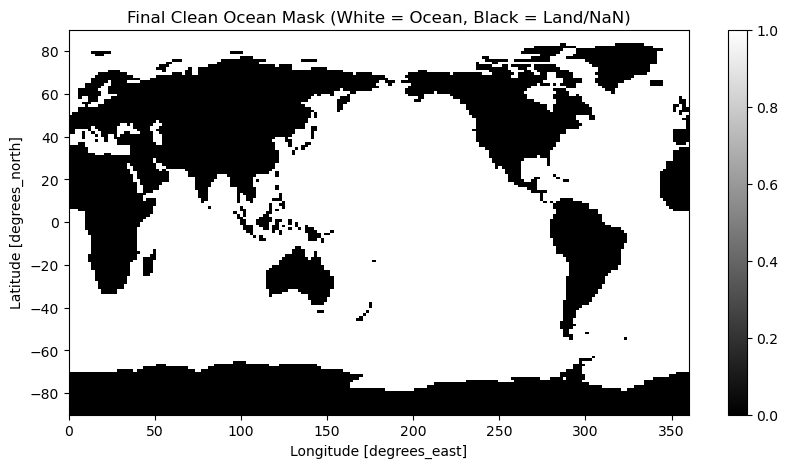

In [46]:
import xesmf as xe
import rioxarray
import regionmask
from shapely.geometry import MultiPolygon, Polygon
from shapely.ops import unary_union
from scipy.ndimage import binary_dilation, zoom
from matplotlib.colors import LinearSegmentedColormap


### These are needed to regrid tos data to the same format as atmospheric grids, as well as extract an ocean mask for excluding NaNs from PCA, modelling, etc.
def set_regridder(tos, tas):
    grid_in = tos.isel(time=0).rename({"latitude": "lat", "longitude": "lon"})
    grid_out = tas.isel(time=0)
    regridder = xe.Regridder(grid_in, grid_out, method="nearest_s2d", periodic=True)
    return regridder
def regrid_tos(tos, regridder=None):
    if regridder is None:
        # Fallback to the globally instantiated weight matrix directly
        regridder = globals().get('global_regridder', None)
        if regridder is None:
            raise ValueError("🚨 No valid xESMF regridder was passed or found in global memory!")
    tos_renamed = tos.rename({"latitude": "lat", "longitude": "lon"})
    tos_regridded = regridder(tos_renamed["tos"])
    #tos_regridded.isel(time=0).plot(figsize=(10, 6), cmap="coolwarm")
    return tos_regridded
def get_ocean_mask(tos_regridded):
    ocean_mask = np.isfinite(tos_regridded['tos'].isel(year=0)) # by this stage, the datasets should be processed into years, not just time, otherwise we would write 'time=0'
    total_grid_pixels = ocean_mask.size  # 144 * 192 = 27,648
    active_ocean_pixels = int(ocean_mask.sum())
    ocean_mask.plot(figsize=(8, 5), cmap="gray")
    return ocean_mask
def get_ocean_mask_fixed():
    global regridded
    tos_path = "/badc/cmip6/data/CMIP6/ScenarioMIP/MOHC/UKESM1-0-LL/ssp534-over/r1i1p1f2/Omon/tos/gn/latest/*nc"
    tos534 = xr.open_mfdataset(tos_path)
    regridded = regrid_tos(tos534).isel(time=0)
    ocean_mask = np.isfinite(regridded) # by this stage, the datasets should be processed into years, not just time, otherwise we would write 'time=0'
    return ocean_mask

def plot_ocean_mask(ocean_mask):
    total_pixels = ocean_mask.size  # 144 * 192 = 27648
    active_ocean_pixels = int(ocean_mask.sum())
    nan_land_pixels = total_pixels - active_ocean_pixels
    
    print("--- Mask Validation Summary ---")
    print(f"Total Grid Cells (Lat x Lon): {total_pixels}")
    print(f"Valid Ocean Cells (True):     {active_ocean_pixels} ({active_ocean_pixels/total_pixels*100:.1f}%)")
    print(f"NaN Land Cells (False):       {nan_land_pixels}")
    
    # 5. Visualise the mask to verify coastlines and Antarctica are perfectly blacked out
    plt.figure(figsize=(10, 5))
    ocean_mask.plot(cmap="gray")
    plt.title("Final Clean Ocean Mask (White = Ocean, Black = Land/NaN)")
    plt.show()

global_regridder = set_regridder(
    xr.open_mfdataset("/badc/cmip6/data/CMIP6/ScenarioMIP/MOHC/UKESM1-0-LL/ssp534-over/r1i1p1f2/Omon/tos/gn/latest/*nc", 
                      chunks={'time': 12}, combine='by_coords', data_vars='minimal', coords='minimal', compat='override'), # our ocean dataset
    xr.open_mfdataset("/badc/cmip6/data/CMIP6/ScenarioMIP/MOHC/UKESM1-0-LL/ssp534-over/r1i1p1f2/Amon/tas/gn/latest/*nc") # our atmospheric template to map to
)
ocean_mask = get_ocean_mask_fixed()
plot_ocean_mask(ocean_mask)

In [47]:
import regionmask
if metric == "tas":
    def remove_ocean_from_mask(ar6_mask, ocean_mask=ocean_mask):
        return ar6_mask & ~(ocean_mask.values == 1.0)
    
    focus_region_ids = [46, # Arctic (land and sea)
                        45, # West Antarctic (land and sea)
                        1, # N.W. North America (filter for LAND ONLY)
                        35, # East Asia (filter for LAND ONLY)
                        10, # North South America (filter for LAND ONLY)
                       ]
    
    global_mask_2d = regionmask.defined_regions.ar6.all.mask(dataset_test.lon.values, dataset_test.lat.values)
    focus_regions = [(global_mask_2d == num).values for num in focus_region_ids]
    region_masks = focus_regions[0:2] + [remove_ocean_from_mask(m) for m in focus_regions[2:]]

In [48]:
def tas_predicting_net_pr_test(temp_test, pr_test, use_kpca=False, metric=metric):  
    metX, metY = metric.split("=")

    if metX == metY:
        # Bivariate duplicates (like tas=tas) bypass merging completely to maintain pure array alignment
        dataset_test = temp_test.copy(deep=False)
    else:
        try:
            # 1. First attempt: Strict exact join. If grids are perfect, this succeeds instantly.
            dataset_test = xr.merge([temp_test, pr_test], join='exact', compat='no_conflicts')
        except ValueError:
            print("⚠️ Minor coordinate precision mismatch detected. Dynamically snapping grids...")
            
            # 2. Defensive fallback: Align coordinates with a 1e-4 degree numerical tolerance
            # This safely snaps coordinates like 50.000000 and 50.000004 together without changing data values
            temp_aligned, pr_aligned = xr.align(temp_test, pr_test, join='override', copy=False)
            
            # 3. Clean merge of the aligned datasets
            dataset_test = xr.merge([temp_aligned, pr_aligned], compat='no_conflicts')
    # 1. PREPARE TEST DATA - Merge the independent datasets cleanly side-by-side using override rules
    #dataset_test = xr.merge([temp_test, pr_test], compat='override')
    
    # Force the test dataset's latitude coordinates to be ascending (South to North).
    if dataset_test.lat.values[0] > dataset_test.lat.values[-1]:
        dataset_test = dataset_test.sortby('lat', ascending=True)
        print("Aligned test dataset latitude orientation from South to North.")

    # Extract INPUT features matching your training logic exactly
    if ',' in metX:
        current_test_features = []
        for metXi in metX.split(","):
            # FIX: Force multi-variable inputs to check area weighting flag
            if use_area_weighting_in_testing and f"{metXi}_global" in dataset_test.data_vars:
                feat_array = dataset_test[f"{metXi}_global"]
                '''
                if 'lat' in feat_array.dims or 'lon' in feat_array.dims:
                    feat_array = feat_array.mean(dim=['lat', 'lon'])
                '''
                weighted_test_mean = feat_array.compute().values.reshape(-1, 1)
            else:
                weighted_test_mean = dataset_test[metXi].mean(dim=['lat', 'lon']).compute().values.reshape(-1, 1)
            current_test_features.append(weighted_test_mean)
        
        # Horizontally stack all test inputs into a multi-column matrix: Shape [Years, Num_Variables]
        test_x_np = np.hstack(current_test_features)
    else:
        if use_area_weighting_in_testing:
            feat_array = dataset_test[f"{metX}_global"]
            '''
            if 'lat' in feat_array.dims or 'lon' in feat_array.dims:
                feat_array = feat_array.mean(dim=['lat', 'lon'])
            '''
            test_x_np = feat_array.compute().values.reshape(-1, 1)
        else:
            test_global_mean_tas = dataset_test[metX].mean(dim=['lat', 'lon']).compute().values.reshape(-1, 1)
            test_x_np = test_global_mean_tas
    
    # 2: Extract TARGET matrices strictly from target metric
    # Compute the true area-weighted global baseline for net_pr to remove the spatial trend
    # (Matches your training loop where net_pr_global gets subtracted)
    #test_global_mean_net_pr = dataset_test[metY].mean(dim=['lat', 'lon'])
    if f"{metY}_global" in dataset_test.data_vars:
        test_global_mean_net_pr = dataset_test[f"{metY}_global"]
    else:
        print("error: can't find global metric in xarray")
        # Fallback to the calculated unweighted mean ONLY for true cross-metrics (like net_pr) that lack a pre-computed key
        calculated_mean = dataset_test[metY].mean(dim=['lat', 'lon'])
        if len(calculated_mean.shape) > 1:
            # Defensive guard: If xarray fails to collapse dimensions due to NaN grid rules, force it down to a 1D timeline
            calculated_mean = calculated_mean.mean(dim=[d for d in calculated_mean.dims if d != 'year'])
        test_global_mean_net_pr = calculated_mean
    
    if remove_global_trend_prior: # this should be set to FALSE for cross-variable predictions
        # Subtract the global net precipitation trend to isolate regional variance
        test_spatial_anomalies = dataset_test[metY] - test_global_mean_net_pr
    else:
        test_spatial_anomalies = dataset_test[metY]
    
    
    is_ocean = (metY == 'tos')
    
    if is_ocean:
        print(test_global_mean_net_pr, test_global_mean_net_pr.shape)
        # Step A: Extract raw spatial grid array values
        raw_grid_values = test_spatial_anomalies.values
        # Step B: Slice using the ocean mask to isolate active water pixels and drop land noise
        test_data_2d = raw_grid_values[:, ocean_mask.values] # Shape: (Years, 18292)
    else:
        # Fallback default for atmospheric metrics keeping the full global grid footprint intact
        test_data_2d = test_spatial_anomalies.values.reshape(len(dataset_test.year), -1) # Shape: (Years, 27648)

    # Apply the training spatial scaler first, then transform into the PC coordinate space
    test_data_2d_scaled = test_data_2d * flat_weights 
    test_y_coefs = pcas.transform(test_data_2d_scaled)

    
    # BACKWARDS COMPATIBLE SIGN ALIGNMENT BLOCK: Only executes if using non-linear Kernel PCA to prevent random coordinate inversion
    if use_kpca:
        for c in range(test_y_coefs.shape[1]):
            # Align component signs with the primary global temperature forcing trajectory
            correlation = np.corrcoef(test_y_coefs[:, c], test_x_np.flatten())[0, 1]
            if not np.isnan(correlation) and correlation < 0:
                test_y_coefs[:, c] = -test_y_coefs[:, c]
    #####
    
    # Feed the true coefficients directly into your lag maker
    test_y_scaled = test_y_coefs

    print("===============================================================================================")
    print("\n--- 📊 Live Test Function Shape Audit ---")
    print(f"-> Full Input Feature Array (test_x_np) Shape:           {test_x_np.shape}")
    print(f"-> Projected Target PCA Matrix (test_y_coefs) Shape:     {test_y_coefs.shape}")
    
    # Extract the exact chronological time boundaries directly from the dataset container
    dataset_years = dataset_test.year.values
    print(f"-> Dataset Year Coordinates Range:                      {dataset_years[0]} to {dataset_years[-1]} (Total: {len(dataset_years)})")
    
    # Calculate dimensional delta
    len_x = test_x_np.shape[0]
    len_y = test_y_coefs.shape[0]
    mismatch_delta = len_x - len_y
    
    print(f"-> Row Count Discrepancy (X length - Y length):          {mismatch_delta} rows")
    
    if mismatch_delta > 0:
        print(f"⚠️ Trimming Safely: Slicing the first {mismatch_delta} padding elements from the front of test_x_np.")
        print(f"   The aligned array will track the final {len_y} years, keeping your timelines perfectly synchronized.")
    elif mismatch_delta < 0:
        print(f"🚨 ALERT: Target matrix Y is longer than Input feature matrix X by {abs(mismatch_delta)} rows!")
    else:
        print("🟢 PERFECT SYMMETRY: Both arrays are perfectly balanced in time.")
    print("=========================================================================\n")



    
    # Generate the 10-column lookback lag matrix from your raw temperature tracking coordinates
    test_x_lagged, test_y_sliced_scaled = build_lagged_dataset(
        test_x_np, 
        test_y_scaled, 
        n_lags=n_lags
    )
    
    # Scale the 10-column matrix using the pre-fit feature scaler
    test_x_scaled_matrix = scaler_x.transform(test_x_lagged)
    
    # Convert the SCALED matrix into a PyTorch float tensor [Total_Test_Years, 10]
    test_x_tensor = torch.tensor(test_x_scaled_matrix).float().to(device)
    
    # FIXED FOR STANDALONE LSTM SHAPE: Shape matches exactly [Total_Test_Years, 10, 1]
    num_variables = test_x_np.shape[1]
    if num_variables == 1:
        # Guarantees 'tas=tas' uses the exact same memory layout as your clean 'tas' pass
        test_x_lstm_ready = test_x_tensor.unsqueeze(-1)
    else:
        # Only use view when you have true multi-column multivariate features (e.g., tas, tos)
        test_x_lstm_ready = test_x_tensor.view(-1, n_lags, num_variables) # multi-variate compatible
    
    # Extract unscaled ground truth targets for true physical error calculation
    valid_test_years = len(test_y_sliced_scaled)
    test_y_ground_truth = test_y_coefs[-valid_test_years:]
    
    # PERFORM PREDICTION (External DKL Pass) 
    feature_extractor.eval()
    gp_model.eval()
    likelihood.eval()

        # 1. HARD RESET CACHE: Wipe out stale structural matrix layout references
    gp_model.prediction_strategy = None
    
    # 2. DISABLE STRICT SAFETY CHECKS AND FORCE NUMERICAL JITTER INJECTION
    with torch.no_grad(), \
         gpytorch.settings.fast_pred_var(), \
         gpytorch.settings.debug(False), \
         gpytorch.settings.cholesky_jitter(1e-3): 
        
        # BACKWARDS COMPATIBLE num_pcs EXTRACTOR
        current_num_pcs = int(pcas.n_components) if use_kpca else int(pcas.n_components_)

        '''
        We add contiguous to ensure results are consistent with the single variable test func; code runs without the contiguous additions but is slightly off.
        '''
        # Extract the up-to-date training features using the final optimized LSTM weights
        current_train_latents = feature_extractor(train_x_lstm) 
        gp_train_input = current_train_latents.unsqueeze(0).repeat(current_num_pcs, 1, 1)#.contiguous()
        ###### ACCIDENTALLY ADDING CHOLESKY JITTER ALL OVER AGAIN which is causing minor discrepancies between the tas test func and the tas=tas test func
        ## for reproducibility, ensure we use contiguous
        
        # FIXED DKL DATA REFRESH
        # Handing over the explicit tuple pointer and cascading to sub-kernels natively
        gp_model.train_inputs = (gp_train_input,)
        #gp_model.set_train_data(inputs=gp_train_input, targets=train_y_dkl.contiguous(), strict=False)
        
        # A. Generate the testing latent space representations from the standalone LSTM
        test_latents = feature_extractor(test_x_lstm_ready)  
        gp_test_input = test_latents.unsqueeze(0).repeat(current_num_pcs, 1, 1)#.contiguous()
        '''
        End of adding contiguous
        '''

        # ─── PURE MODEL CACHE FLUSH ───
        if hasattr(gp_model, '_memoize_cache'):
            gp_model._memoize_cache.clear()
        
        gp_model.prediction_strategy = None
            
        # B. Compute accurate posterior predictions with correct uncertainty boundaries!
        observed_pred = likelihood(gp_model(gp_test_input))
        
        # Extract prediction structures directly to CPU arrays
        pred_means_raw = observed_pred.mean.cpu().numpy()     
        pred_stds_raw = observed_pred.stddev.cpu().numpy()   
    
        # Transpose matrices cleanly back into standard format [Total_Valid_Test_Years, num_pcs]
        pred_means = pred_means_raw.T 
        pred_stds = pred_stds_raw.T

    # UNSCALE THE OUTPUTS & RECONSTRUCT SPATIAL MAPS     
    # 1. Project the predicted PC coefficients back into a flat 2D spatial matrix
    pred_spatial_anomalies_scaled = pcas.inverse_transform(pred_means)
    
    # 2. INVERT THE GEOMETRIC SCALING: Divide by flat weights to recover absolute coordinates
    pred_spatial_anomalies_flat = pred_spatial_anomalies_scaled / (flat_weights + 1e-7)
    
    # 3. Reshape back into standard spatial grid dimensions
    if is_ocean:
        # Build an empty global template filled with NaNs to mask continents
        pred_spatial_anomalies = np.full((valid_test_years, 144, 192), np.nan)
        for t in range(valid_test_years):
            pred_spatial_anomalies[t, ocean_mask.values] = pred_spatial_anomalies_flat[t, :]
    else:
        # Fallback to direct global reshape for atmospheric metrics
        pred_spatial_anomalies = pred_spatial_anomalies_flat.reshape(valid_test_years, 144, 192)

    ######## ONLY ADD BACK GLOBAL BASELINE IF WORKING WITH TAS
    # 3: RECOMBINATION BASELINE ADJUSTMENT 
    # For tas:net_pr, we must add back the absolute global mean of NET_PR, not the temperature feature
    # This matches the training loop where net_pr_global was subtracted from the target spatial maps
    #test_global_means_sliced = test_global_mean_net_pr.values[-valid_test_years:].reshape(-1, 1, 1)
    # Check if the pre-computed area-weighted global array is available in the dataset
    if f"{metY}_global" in dataset_test.data_vars and metY == 'tas':
        # Pull the exact area-weighted timeline used by the 'tas' single-metric test script
        intermediate = dataset_test[f"{metY}_global"]
        if metY == "tos":
            test_global_means_sliced = intermediate.mean(dim=['lat', 'lon']).values[-valid_test_years:].reshape(-1, 1, 1)
        else:
            test_global_means_sliced = intermediate.values[-valid_test_years:].reshape(-1, 1, 1)
        final_absolute_predictions = pred_spatial_anomalies + test_global_means_sliced
        print("Global trend successfully added back!")
    
    else:
        final_absolute_predictions = pred_spatial_anomalies
        '''
        # Fallback to the calculated unweighted mean ONLY if _global is completely missing
        print("OOPS! Global value could not be found.")
        test_global_means_sliced = test_global_mean_net_pr.values[-valid_test_years:].reshape(-1, 1, 1)
        '''
        

    # TODO: GET FINAL UNCERTAINTY / VARIANCE BOUNDS ###
    pred_vars_pc = pred_stds ** 2 # we have already got pred_stds above but just not used yet
    pca_components_squared = (pcas.components_[:num_pcs]) ** 2
    spatial_variance_scaled = np.dot(pred_vars_pc, pca_components_squared)
    spatial_variance_flat = spatial_variance_scaled / ((flat_weights + 1e-7) ** 2) # flat_weights should be a global variable
    
    is_ocean = (spatial_variance_flat.shape[1] != 27648)
    
    if is_ocean:
        global_prediction_stds_spatial = np.full((valid_test_years, 144, 192), np.nan)
        for t in range(valid_test_years):
            global_prediction_stds_spatial[t, ocean_mask.values] = np.sqrt(spatial_variance_flat[t, :])
    else:
        lstm_spatial_uncertainty = np.sqrt(spatial_variance_flat).reshape(valid_test_years, 144, 192) # valid test years is defined in this
    ### END OF TODO ###
    
    
    # 4: GROUND TRUTH TARGET ROUTING: Ensure our true physical validation layer explicitly isolates 'net_pr' from the dataset
    final_absolute_ground_truth = dataset_test[metY].values[-valid_test_years:]
    print("Prediction complete!")
    
    # 4. SCORING (WITH DYNAMIC SWITCHING BY METRIC)
    ### UNWEIGHTED METRICS
    baseline_regressor = LinearRegression()
    baseline_regressor.fit(combined_x, stacked)
    baseline_pred_flat = baseline_regressor.predict(test_x_np)
    baseline_spatial_anomalies_flat = baseline_pred_flat[-valid_test_years:]

    if is_ocean:
        # Reconstruct the baseline predictions using the same cookie-cutter layout
        baseline_spatial_maps = np.full((valid_test_years, 144, 192), np.nan)
        for t in range(valid_test_years):
            baseline_spatial_maps[t, ocean_mask.values] = baseline_spatial_anomalies_flat[t, :]
    else:
        baseline_spatial_maps = baseline_spatial_anomalies_flat.reshape(valid_test_years, 144, 192)

    if remove_global_trend_prior: #### recall we remove global trend in some cases, e.g. tas=tas  and   tas,rtmt=tas
        baseline_final_absolute_maps = baseline_spatial_maps + test_global_means_sliced
    else:
        baseline_final_absolute_maps = baseline_spatial_maps

    # NAN-SAFE PHYSICAL ERROR EVALUATION TRACKER; Calculate pure squared differences across matching spatial frames
    baseline_squared_errors = (final_absolute_ground_truth - baseline_final_absolute_maps) ** 2

    if is_ocean:
        model_squared_errors = (final_absolute_ground_truth - final_absolute_predictions) ** 2
        pattern_scaling_rmse = np.sqrt(np.nanmean(baseline_squared_errors)) # Swapping to np.nanmean completely bypasses land cells and evaluates water exclusively
        spatial_rmse = np.sqrt(np.nanmean(model_squared_errors))
    else:
        baseline_squared_errors = (final_absolute_ground_truth - baseline_final_absolute_maps) ** 2
        pattern_scaling_rmse = np.sqrt(np.mean(baseline_squared_errors))
        spatial_rmse = np.sqrt(mean_squared_error(
            final_absolute_ground_truth.flatten(), 
            final_absolute_predictions.flatten()
        ))
    error_unit, fmt = get_error_unit_and_format(metric.split("=")[1])

    ### Now get area-weighted version
    
    
    # Reconstruct the 2D grid from the available flat_weights vector
    if is_ocean:#(final_absolute_ground_truth.shape[1] != 27648 if final_absolute_ground_truth.ndim == 2 else final_absolute_ground_truth.shape[2] != 192):
        # Handles your ocean mask variant if applicable
        global_weight_grid_2d = np.full((144, 192), np.nan)
        global_weight_grid_2d[ocean_mask.values] = flat_weights
    else:
        global_weight_grid_2d = flat_weights.reshape(144, 192)
    #global_weight_grid_2d = flat_weights.reshape(144, 192)

    ##### Calculate the weights directly here 
    RAD_EARTH = 6.387e6
    if '=' not in metric: 
        dA_grid = compute_grid_areas(dataset_test, dataset_test[metric].isel(year=0), x='lon', y='lat', RAD_EARTH=RAD_EARTH)
    else:
        # working with a metric of the form 'metX=metY'
        selection = metric.split('=')[1]
        dA_grid = compute_grid_areas(dataset_test, dataset_test[selection].isel(year=0), x='lon', y='lat', RAD_EARTH=RAD_EARTH)
            
        
    
    # Extract the raw 2D numpy grid values
    global_weight_grid_2d = dA_grid.values
    #########################################
    
    
    # Flatten your 2D weights to match a single spatial snapshot
    global_sample_weights = global_weight_grid_2d.flatten()
    # Broadcast weights across the time dimension to match the fully flattened arrays
    #total_timesteps = baseline_final_absolute_maps.shape[0]
    total_timesteps = final_absolute_predictions.shape[0]
    multi_year_weights = np.tile(global_sample_weights, total_timesteps)
    
    # 2. Area-Weighted Baseline RMSE (Matches your new spatial_rmse_weighted)
    # Reuse the multi_year_weights array we generated earlier
    valid_baseline_mask = ~np.isnan(baseline_squared_errors.flatten()) & ~np.isnan(multi_year_weights)
    
    pattern_scaling_rmse_weighted = np.sqrt(mean_squared_error(
        final_absolute_ground_truth.flatten()[valid_baseline_mask], 
        baseline_final_absolute_maps.flatten()[valid_baseline_mask],
        sample_weight=multi_year_weights[valid_baseline_mask]
    ))
    
    
    # Handle any potential NaNs in the data or weights
    valid_indices = ~np.isnan(final_absolute_ground_truth.flatten()) & ~np.isnan(multi_year_weights)
    # Calculate Area-Weighted Global RMSE via Scikit-Learn
    spatial_rmse_weighted = np.sqrt(mean_squared_error(
        final_absolute_ground_truth.flatten()[valid_indices], 
        final_absolute_predictions.flatten()[valid_indices],
        sample_weight=multi_year_weights[valid_indices]
    ))
    

    # SCIENTIFIC ROUTING TOGGLE FOR CROSS-METRIC STRINGS; If using tas:net_pr, toggle straight to scientific mass flux notation (kg m-2 s-1)
    print(f"Unweighted Linear Pattern Scaling Baseline RMSE: {pattern_scaling_rmse:{fmt}}{error_unit}")
    print(f"Area-weighted Linear Pattern Scaling Baseline RMSE : {pattern_scaling_rmse_weighted:{fmt}}{error_unit}")
    print(f"Unweighted ML Average RMSE: {spatial_rmse:{fmt}}{error_unit}")
    print(f"Area-weighted ML Average RMSE: {spatial_rmse_weighted:{fmt}}{error_unit}")

    #########
    # --- GLOBAL-MEAN RMSE CALCULATION (ENERGY CONSERVATION CHECK) ---
    
    # 1. Normalize your 2D grid areas so they sum up to 1.0 (important for accurate spatial averaging)
    # global_weight_grid_2d shape is (144, 192)
    spatial_weights_normalized = global_weight_grid_2d / np.nansum(global_weight_grid_2d)
    
    # 2. Compute the True Area-Weighted Global Mean Timeline
    # We multiply each year's 2D map by the normalized weights and sum over the lat/lon axes (1, 2)
    true_global_mean_timeline = np.nansum(final_absolute_ground_truth * spatial_weights_normalized, axis=(1, 2))
    
    # 3. Compute the Baseline Area-Weighted Global Mean Timeline
    baseline_global_mean_timeline = np.nansum(baseline_final_absolute_maps * spatial_weights_normalized, axis=(1, 2))
    
    # 4. Compute the Machine Learning Area-Weighted Global Mean Timeline
    ml_global_mean_timeline = np.nansum(final_absolute_predictions * spatial_weights_normalized, axis=(1, 2))
    
    
    # 5. Calculate the Temporal RMSE across years between the collapsed timelines
    global_mean_baseline_rmse = np.sqrt(mean_squared_error(
        true_global_mean_timeline, 
        baseline_global_mean_timeline
    ))
    
    global_mean_ml_rmse = np.sqrt(mean_squared_error(
        true_global_mean_timeline, 
        ml_global_mean_timeline
    ))
    
    print(f"📉 True Global-Mean Baseline RMSE over Time : {global_mean_baseline_rmse:{fmt}}{error_unit}")
    print(f"📉 True Global-Mean ML Model RMSE over Time  : {global_mean_ml_rmse:{fmt}}{error_unit}")
    print("==================================================")

    

    """
    ===> SAVE final_absolute_predictions, final_absolute_ground_truth, baseline_final_absolute_maps to pandas or something for access later
    """
    if save:
        save_path_nc = os.path.join(target_dir, f"spatial_arrays_eval_{metric}.nc")
    
    # 1. Grab matching coordinates directly from your test set slice
    test_slice = dataset_test.isel(year=slice(-valid_test_years, None))
    
    # 2. Build a beautifully labeled multi-variable xarray dataset
    eval_dataset = xr.Dataset(
        data_vars={
            "ground_truth": (["year", "lat", "lon"], final_absolute_ground_truth),
            "dkl_prediction": (["year", "lat", "lon"], final_absolute_predictions),
            "pattern_scaling_prediction": (["year", "lat", "lon"], baseline_final_absolute_maps)
        },
        coords={
            "year": test_slice.year.values,
            "lat": test_slice.lat.values,
            "lon": test_slice.lon.values
        }
    )
    if save:
        # 3. Export cleanly as a standard climate modeling NetCDF file
        eval_dataset.to_netcdf(save_path_nc)
        print(xr.open_dataset(save_path_nc)) # Open to verify coordinates and attributes
    """
    ===> End of saving preds and ground truth to xarray
    """

    print("Metrics relating to PCA:")
    rmse = np.sqrt(mean_squared_error(test_y_ground_truth, pred_means))
    r2 = r2_score(test_y_ground_truth, pred_means)
    
    if metric == "tas":
        print(f"Total Test RMSE: {rmse:.4f}")
    else:
        print(f"Total Test RMSE: {rmse:.3e}")
    print(f"Total Test R² Score: {r2:.4f}")
    
    # Calculate individual PC errors
    pc_errors = []
    for i in range(test_y_ground_truth.shape[1]):
        err = np.sqrt(mean_squared_error(test_y_ground_truth[:, i], pred_means[:, i]))
        pc_errors.append(err)
    
    error_df = pd.DataFrame({
        'PC': [f'PC{i}' for i in range(len(pc_errors))],
        'RMSE': [f"{e:.4f}" if metric == "tas" else f"{e:.3e}" for e in pc_errors]
    })
    print(error_df)
    # 5. PLOTTING TRAJECTORIES & UNCERTAINTY BANDS
    # Dynamic num_pcs configuration based on the active model type
    current_num_pcs = int(pcas.n_components) if use_kpca else int(pcas.n_components_)
    
    cols = 3
    rows = int(np.ceil(current_num_pcs / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = axes.flatten()
    
    for i in range(current_num_pcs):
        x_range = np.arange(len(pred_means))
        
        axes[i].plot(test_y_ground_truth[:, i], 'k-', label='Actual', alpha=0.6)
        axes[i].plot(pred_means[:, i], 'b--', label='DKL Mean', linewidth=1.5) 
    
        # Shading for 2 STD (95% Confidence)
        lower_2std = pred_means[:, i] - 2 * pred_stds[:, i]
        upper_2std = pred_means[:, i] + 2 * pred_stds[:, i]
        axes[i].fill_between(x_range, lower_2std, upper_2std, 
                             color='blue', alpha=0.1, label='95% Conf.')
    
        # Shading for 1 STD (68% Confidence)
        lower_1std = pred_means[:, i] - 1 * pred_stds[:, i]
        upper_1std = pred_means[:, i] + 1 * pred_stds[:, i]
        axes[i].fill_between(x_range, lower_1std, upper_1std, 
                             color='blue', alpha=0.25, label='68% Conf.')
    
        axes[i].set_title(f'PC{i}')
        axes[i].legend(loc='upper left', fontsize='small')
    
    for j in range(current_num_pcs, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

    # 6. REGIONAL MAP ERROR HEATMAPS (GENERALIZED)
    baseline_pixel_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=0))
    dkl_pixel_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=0))
    
    error_difference = baseline_pixel_rmse - dkl_pixel_rmse
    
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    
    # CONFIGURING METRIC-SPECIFIC SCALE AND LABELS; Check if metric is strictly 'tas' to apply temperature boundaries
    if metY in ["tas"] or metric == "tas":#, "tos"]:
        vmax_error = 2.5
        vmax_delta = 1.0
        vmin_delta = -1.0
        cbar_label = f'Absolute Error ({error_unit})'
        delta_label = f'DKL Performance Margin ({error_unit})\n[Blue = DKL Wins | Red = Baseline Wins]'
        fmt_cbar = None  
    else:
        # Use explicit nan-safe functions to get valid max numbers over active grid squares
        vmax_error = float(np.nanmax(baseline_pixel_rmse))
        vmax_delta = float(np.nanmax(np.abs(error_difference)))
        vmin_delta = -vmax_delta  
        cbar_label = f'Absolute Error ({error_unit})'
        delta_label = f'DKL Performance Margin ({error_unit})\n[Blue = DKL Wins | Red = Baseline Wins]'
        import matplotlib.ticker as ticker
        fmt_cbar = ticker.FormatStrFormatter('%.2e')
    
    # Render Plot 1: Classic Pattern Scaling Map
    im0 = axes[0].imshow(baseline_pixel_rmse, cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_error)
    axes[0].set_title('Classic Pattern Scaling Regional RMSE', fontweight='bold', fontsize=12)
    cbar0 = fig.colorbar(im0, ax=axes[0], label=cbar_label, shrink=0.75, format=fmt_cbar)
    
    # Render Plot 2: Deep Kernel Learning Map
    im1 = axes[1].imshow(dkl_pixel_rmse, cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_error)
    axes[1].set_title('Deep Kernel Learning Regional RMSE', fontweight='bold', fontsize=12)
    cbar1 = fig.colorbar(im1, ax=axes[1], label=cbar_label, shrink=0.75, format=fmt_cbar)
    
    # Render Plot 3: Performance Variance Difference Map
    im2 = axes[2].imshow(error_difference, cmap='RdBu', origin='lower', vmin=vmin_delta, vmax=vmax_delta)
    axes[2].set_title('Performance Delta\n(Baseline Error - DKL Error)', fontweight='bold', fontsize=12)
    cbar2 = fig.colorbar(im2, ax=axes[2], label=delta_label, shrink=0.75, format=fmt_cbar)
    
    # Apply standard spatial labels across axes
    for ax in axes:
        ax.set_xlabel('Longitude Grid Index')
        ax.set_ylabel('Latitude Grid Index')
        
    plt.tight_layout()
    plt.show()

    ####
    # - Temperature in specific regions: compare true values with linear baseline and lstm-gp
    ####
    # 1. set our arrays  -remember our lstm-gp uncertainty in proper units is lstm_spatial_uncertainty, defined above
    lstm_gp, esm, linear = final_absolute_predictions, final_absolute_ground_truth, baseline_final_absolute_maps
    print(f"LSTM_GP: {lstm_gp.shape}, ESM: {esm.shape}, LINEAR: {linear.shape}")
    #TODO: plot temperatures (not errors) comparing baseline, esm, linear for specific regions using region_mask

    lats = dataset_test.lat.values
    lons = dataset_test.lon.values
    test_years_axis = dataset_test.year.values[-valid_test_years:]
    if metric.split("=")[-1] == 'tos':
        regions_of_interest = regionmask.defined_regions.ar6.ocean.numbers
        # exclusively regions that have ocean masks, for tos 
    else:
        regions_of_interest = [
            46, #arctic
            10, #part of brazil,
            20, #sahara
            45, #west antarctica,
            5, #north east america
            50, # north atlantic ocean
            56, #south indian ocean
        ] # standard regions for comparing when using tas - includes some good, some bad, some mid
    # 2. fetch the region
    ar6_all_regions = regionmask.defined_regions.ar6.all
    # 3. Build the 2D spatial coordinate mask over your grid [Shape: (144, 192)]
    global_mask_2d = ar6_all_regions.mask(lons, lats)
    
    for regional_idx in regions_of_interest:
        regional_bool_mask_2d = (global_mask_2d == regional_idx).values
    
        # 4. COMPUTE SPATIAL MEAN ABSOLUTE TEMPERATURES PER YEAR [Shape: (Years,)]
        # Slicing with [:, arctic_bool_mask_2d] extracts all pixels inside the Arctic polygon.
        # np.nanmean squashes the spatial footprint into a single average temperature value per year.
        esm_regional_temp     = np.nanmean(esm[:, regional_bool_mask_2d], axis=1)
        linear_regional_temp  = np.nanmean(linear[:, regional_bool_mask_2d], axis=1)
        lstm_gp_regional_temp = np.nanmean(lstm_gp[:, regional_bool_mask_2d], axis=1)
        
        # ABSOLUTE TEMPERATURE TRAJECTORY OVER TIME
        fig, ax = plt.subplots(figsize=(12, 6))
        
        # Plot all three absolute temperature curves
        ax.plot(test_years_axis, esm_regional_temp, color='#222222', linestyle='-', linewidth=2.5, label='True ESM Ground Truth')
        ax.plot(test_years_axis, linear_regional_temp, color='#d95f02', linestyle='--', linewidth=1.8, label='Linear Pattern Scaling Baseline')
        ax.plot(test_years_axis, lstm_gp_regional_temp, color='#7570b3', linestyle='-', linewidth=2.2, label='LSTM-GP')
        
        # Chart Styling & Labelling
        ax.set_xlabel('Timeline (Years)', fontsize=11, fontweight='bold', labelpad=8)
        ax.set_ylabel('Absolute Regional Temperature Anomaly (°C)', fontsize=11, fontweight='bold', labelpad=8)
        ax.set_xlim(test_years_axis[0], test_years_axis[-1])
        ax.grid(True, linestyle=':', alpha=0.6)
        
        # Place Legend cleanly
        ax.legend(frameon=True, loc='upper left', fontsize=10)
        
        # Dynamic Title displaying the official Region name from regionmask metadata
        region_name = ar6_all_regions[regional_idx].name
        plt.title(f'Absolute Temperature Trajectory: AR6 Region {regional_idx} ({region_name})', 
                  fontweight='bold', fontsize=13, pad=15)
        plt.tight_layout()
        plt.show()
        #######
        # now we do absolute temp trajectory over global
        
        global_forcing_driver = test_x_np[-valid_test_years:, 0]
        fig, ax_scat = plt.subplots(figsize=(12, 6))
        # 2. Sort the global drivers strictly to force the model lines to draw smoothly from left (cooler global temps) to right (warmer global temps)
        sort_idx = np.argsort(global_forcing_driver)
        # 3. Plot the Linear Baseline (Mathematically forced to be a perfectly straight line!)
        ax_scat.plot(global_forcing_driver[sort_idx], linear_regional_temp[sort_idx], 
                     color='#d95f02', linestyle='--', linewidth=2.0, 
                     label='Linear Pattern Scaling (Strictly Straight)')
        # 4. Plot the LSTM-GP (Reveals its dynamic, flexible, curved regional scaling!)
        ax_scat.plot(global_forcing_driver[sort_idx], lstm_gp_regional_temp[sort_idx], 
                     color='#7570b3', linestyle='-', linewidth=2.5, 
                     label='LSTM-GP')
        # 5. Plot the True ESM Ground Truth as dots connected by a thin line
        # We DO NOT sort the ESM line by global temp; we preserve its chronological order so you can see the real climate trajectory wind and wobble over time!
        #ax_scat.plot(global_forcing_driver, esm_regional_temp, color='#222222', linestyle='-', linewidth=1.0, alpha=0.4)
        ax_scat.scatter(global_forcing_driver, esm_regional_temp, 
                        color='#222222', s=35, zorder=3, label='True ESM Target Path')
        # Labeling and Formatting
        ax_scat.set_xlabel('Global Mean Absolute Temperature Anomaly (°C)', fontsize=11, fontweight='bold', labelpad=8)
        ax_scat.set_ylabel(f'Absolute Regional Temperature Anomaly ({ar6_all_regions[regional_idx].name}) (°C)', fontsize=11, fontweight='bold', labelpad=8)
        ax_scat.grid(True, linestyle=':', alpha=0.6)
        # Position Legend safely
        ax_scat.legend(frameon=True, loc='upper left', fontsize=10)
        plt.title(f'Warming Sensitivity Profile: Regional vs. Global Forcing (Region {regional_idx}: {region_name})', 
                  fontweight='bold', fontsize=13, pad=15)
        plt.tight_layout()
        plt.show()
        ######





    
    # =======
    # --- 10. GEOGRAPHICAL ERROR PROFILES (LATITUDE & LONGITUDE - MEAN & TOTAL) ---
    # Extract physical axis arrays directly from your dataset
    # ======
    lat_axis_degrees = dataset_test.lat.values
    lon_axis_degrees = dataset_test.lon.values
    
    # 1. LATITUDINAL CALCULATIONS [Squeezing out Time (axis 0) and Longitude (axis 2)]
    gp_lat_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=(0, 2)))
    baseline_lat_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=(0, 2)))
    # Total accumulated structural deviation per latitude band
    gp_lat_total = np.sum(np.abs(final_absolute_ground_truth - final_absolute_predictions), axis=(0, 2))
    baseline_lat_total = np.sum(np.abs(final_absolute_ground_truth - baseline_final_absolute_maps), axis=(0, 2))
    
    # 2. LONGITUDINAL CALCULATIONS [Squeezing out Time (axis 0) and Latitude (axis 1)]
    gp_lon_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=(0, 1)))
    baseline_lon_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=(0, 1)))
    # Total accumulated structural deviation per longitude band
    gp_lon_total = np.sum(np.abs(final_absolute_ground_truth - final_absolute_predictions), axis=(0, 1))
    baseline_lon_total = np.sum(np.abs(final_absolute_ground_truth - baseline_final_absolute_maps), axis=(0, 1))
    
    # Configure dynamic text units based on variable selection
    error_unit_str, fmt = get_error_unit_and_format(metric)
    
    # CHART A: LATITUDE PROFILE (MEAN vs TOTAL)
    fig, ax1 = plt.subplots(figsize=(14, 5))
    
    # Left Axis: Mean RMSE
    line1 = ax1.plot(lat_axis_degrees, baseline_lat_rmse, color='#d95f02', linestyle='-', linewidth=2.5, label='Baseline Mean RMSE')
    line2 = ax1.plot(lat_axis_degrees, gp_lat_rmse, color='#7570b3', linestyle='-', linewidth=2.5, label='GP Model Mean RMSE')
    ax1.set_xlabel('Latitude (South to North Degrees)', fontsize=11, fontweight='bold')
    ax1.set_ylabel(f'Mean Spatial RMSE {error_unit_str}', fontsize=11, fontweight='bold')
    ax1.set_xlim(-90, 90)
    ax1.grid(True, linestyle=':', alpha=0.6)
    
    # Right Axis: Total Error
    ax2 = ax1.twinx()
    line3 = ax2.plot(lat_axis_degrees, baseline_lat_total, color='#d95f02', linestyle=':', linewidth=1.5, alpha=0.7, label='Baseline Total Error')
    line4 = ax2.plot(lat_axis_degrees, gp_lat_total, color='#7570b3', linestyle=':', linewidth=1.5, alpha=0.7, label='GP Model Total Error')
    ax2.set_ylabel(f'Total Accumulated Error {error_unit_str}', fontsize=11, fontweight='bold', color='#444444')
    
    # Scientific formatting for tiny precipitation variables
    if metric not in ["tas", "tas=tas"]:
        ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        ax2.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        
    # Combine Legends from both axes cleanly
    lines = line1 + line2 + line3 + line4
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, frameon=True, loc='upper right')
    plt.title(f'Zonal Error Distribution: Latitudinal Cross-Section (Mean vs Total Profile)', fontweight='bold', fontsize=13, pad=12)
    plt.tight_layout()
    plt.show()
    
    # CHART B: LONGITUDE PROFILE (MEAN vs TOTAL)
    fig, ax3 = plt.subplots(figsize=(14, 5))
    
    # Left Axis: Mean RMSE
    line5 = ax3.plot(lon_axis_degrees, baseline_lon_rmse, color='#d95f02', linestyle='-', linewidth=2.5, label='Baseline Mean RMSE')
    line6 = ax3.plot(lon_axis_degrees, gp_lon_rmse, color='#7570b3', linestyle='-', linewidth=2.5, label='GP Model Mean RMSE')
    ax3.set_xlabel('Longitude (Degrees East)', fontsize=11, fontweight='bold')
    ax3.set_ylabel(f'Mean Spatial RMSE {error_unit_str}', fontsize=11, fontweight='bold')
    ax3.set_xlim(0, 360)
    ax3.grid(True, linestyle=':', alpha=0.6)
    
    # Right Axis: Total Error
    ax4 = ax3.twinx()
    line7 = ax4.plot(lon_axis_degrees, baseline_lon_total, color='#d95f02', linestyle=':', linewidth=1.5, alpha=0.7, label='Baseline Total Error')
    line8 = ax4.plot(lon_axis_degrees, gp_lon_total, color='#7570b3', linestyle=':', linewidth=1.5, alpha=0.7, label='GP Model Total Error')
    ax4.set_ylabel(f'Total Accumulated Error {error_unit_str}', fontsize=11, fontweight='bold', color='#444444')
    
    if metric not in ["tas", "tas=tas"]:
        ax3.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        ax4.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        
    lines_lon = line5 + line6 + line7 + line8
    labels_lon = [l.get_label() for l in lines_lon]
    ax3.legend(lines_lon, labels_lon, frameon=True, loc='upper right')
    plt.title(f'Meridional Error Distribution: Longitudinal Cross-Section (Mean vs Total Profile)', fontweight='bold', fontsize=13, pad=12)
    plt.tight_layout()
    plt.show()


In [49]:
import numpy as np
import torch
import pandas as pd
import gpytorch
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

def test(dataset_test, use_kpca=use_kpca, use_regional_corrections=False):  # Added a toggle flag for backward compatibility
    #  1. PREPARE TEST DATA 
    
    # Force the test dataset's latitude coordinates to be ascending (South to North).
    if dataset_test.lat.values[0] > dataset_test.lat.values[-1]:
        dataset_test = dataset_test.sortby('lat', ascending=True)
        print("Aligned test dataset latitude orientation from South to North.")
    
    # Compute the unweighted global mean matching your training logic exactly
    #test_global_mean_calculated = dataset_test[metric].mean(dim=['lat', 'lon'])
    test_global_mean_calculated = dataset_test[f"{metric}_global"]
    
    # Extract raw global means for features
    if use_area_weighting_in_testing:
        test_x_np = dataset_test[f"{metric}_global"].values.reshape(-1, 1)
    else:
        test_x_np = dataset_test[metric].mean(dim=['lat', 'lon']).values.reshape(-1, 1)
    
    # --- REMOVE GLOBAL TREND BEFORE TESTING PCA ---
    test_spatial_anomalies = dataset_test[metric] - test_global_mean_calculated
    test_data_2d = test_spatial_anomalies.values.reshape(len(dataset_test.year), -1)
    
    # Apply the training spatial scaler first, then transform into the PC coordinate space
    test_data_2d_scaled = test_data_2d * flat_weights 
    test_y_coefs = pcas.transform(test_data_2d_scaled)
    
    #  BACKWARDS COMPATIBLE SIGN ALIGNMENT BLOCK 
    # Only executes if using non-linear Kernel PCA to prevent random coordinate inversion
    if use_kpca:
        for c in range(test_y_coefs.shape[1]):
            correlation = np.corrcoef(test_y_coefs[:, c], test_x_np.flatten())[0, 1]
            if not np.isnan(correlation) and correlation < 0:
                test_y_coefs[:, c] = -test_y_coefs[:, c]
    # =========================================================================
    
    # Feed the true coefficients directly into your lag maker
    test_y_scaled = test_y_coefs
    # Generate the 10-column lookback lag matrix from your raw tracking coordinates
    test_x_lagged, test_y_sliced_scaled = build_lagged_dataset(
        test_x_np, 
        test_y_scaled, 
        n_lags=n_lags
    )
    
    # Scale the 10-column matrix
    test_x_scaled_matrix = scaler_x.transform(test_x_lagged)
    
    # Convert the SCALED matrix into a PyTorch float tensor [Total_Test_Years, 10]
    test_x_tensor = torch.tensor(test_x_scaled_matrix).float().to(device)
    
    # FIXED FOR STANDALONE LSTM SHAPE: Shape matches exactly [Total_Test_Years, 10, 1]
    test_x_lstm_ready = test_x_tensor.unsqueeze(-1)
    
    # Extract unscaled ground truth targets for true physical error calculation
    valid_test_years = len(test_y_sliced_scaled)
    test_y_ground_truth = test_y_coefs[-valid_test_years:]

    print(f"Valid test years: {valid_test_years}")
    
    # =========================================================
    # --- 2. PERFORM PREDICTION (External DKL Pass) ---
    # =========================================================
    feature_extractor.eval()
    gp_model.eval()
    likelihood.eval()
    
    # 1. HARD RESET CACHE: Wipe out stale structural matrix layout references
    gp_model.prediction_strategy = None

    if not use_kpca:
        # 2. DISABLE STRICT SAFETY CHECKS AND FORCE NUMERICAL JITTER INJECTION
        with torch.no_grad(), \
             gpytorch.settings.fast_pred_var(), \
             gpytorch.settings.debug(False), \
             gpytorch.settings.cholesky_jitter(1e-3): # Increased jitter to 1e-3 for stability
            
            # ─── THE CRITICAL NOTPSDERROR FIX: REFRESH TRAINING ANCHORS ────────
            # Extract the up-to-date training features using the final optimized LSTM weights
            current_train_latents = feature_extractor(train_x_lstm) # [261, 128]
            gp_train_input = current_train_latents.unsqueeze(0).repeat(num_pcs, 1, 1) # [7, 261, 128]
            
            # Directly re-assign the updated tensors to override the stale cache properties!
            gp_model.train_inputs = (gp_train_input,)
            # ──────────────────────────────────────────────────────────────────
            
            # A. Generate the testing latent space representations from the standalone LSTM
            test_latents = feature_extractor(test_x_lstm_ready)  # Shape: [77, 128]
            gp_test_input = test_latents.unsqueeze(0).repeat(num_pcs, 1, 1) # Shape: [7, 77, 128]
            
            # B. Compute accurate posterior predictions with correct uncertainty boundaries!
            observed_pred = likelihood(gp_model(gp_test_input))
            
            # Extract prediction structures directly to CPU arrays
            pred_means_raw = observed_pred.mean.cpu().numpy()     
            pred_stds_raw = observed_pred.stddev.cpu().numpy()   
        
            # Transpose matrices cleanly back into standard format [Total_Valid_Test_Years, 7]
            pred_means = pred_means_raw.T 
            pred_stds = pred_stds_raw.T
    else:
        
    
        # 2. DISABLE STRICT SAFETY CHECKS AND FORCE NUMERICAL JITTER INJECTION
        with torch.no_grad(), \
             gpytorch.settings.fast_pred_var(), \
             gpytorch.settings.debug(False), \
             gpytorch.settings.cholesky_jitter(1e-3): 
            
            # ─── BACKWARDS COMPATIBLE num_pcs EXTRACTOR ───
            # Resolves attribute collisions between linear and kernel PCA architectures
            current_num_pcs = int(pcas.n_components) if use_kpca else int(pcas.n_components_)
            
            # FIX: Dynamically read the true batch size directly from your training targets (9)
            actual_gp_batch_size = train_y_dkl.shape[0]
            
            # Extract the up-to-date training features using the final optimized LSTM weights
            current_train_latents = feature_extractor(train_x_lstm) 
            
            # FIX: Repeat by actual_gp_batch_size instead of current_num_pcs
            gp_train_input = current_train_latents.unsqueeze(0).repeat(actual_gp_batch_size, 1, 1) 
            
            # Directly re-assign the updated tensors to override the stale cache properties!
            gp_model.train_inputs = (gp_train_input,)
    
            #gp_model.set_train_data(inputs=gp_train_input, targets=train_y_dkl, strict=False)
            
            # A. Generate the testing latent space representations from the standalone LSTM
            test_latents = feature_extractor(test_x_lstm_ready)  
            
            # FIX: Repeat by actual_gp_batch_size here as well
            gp_test_input = test_latents.unsqueeze(0).repeat(actual_gp_batch_size, 1, 1) 
    
             # ─── ADD THIS DIRECTLY BEFORE MAKING THE PREDICTION PASS ───
            # This completely deletes the hidden, stale training caches
            if hasattr(gp_model, '_memoize_cache'):
                gp_model._memoize_cache.clear()
            
            # Force GPyTorch to reconstruct its linear mathematical operators from scratch
            gp_model.prediction_strategy = None
            
            # B. Compute accurate posterior predictions with correct uncertainty boundaries!
            observed_pred = likelihood(gp_model(gp_test_input))
            
            # Extract prediction structures directly to CPU arrays
            pred_means_raw = observed_pred.mean.cpu().numpy()     
            pred_stds_raw = observed_pred.stddev.cpu().numpy()   
        
            # Transpose matrices cleanly back into standard format [Total_Valid_Test_Years, num_pcs]
            pred_means = pred_means_raw.T 
            pred_stds = pred_stds_raw.T

    # 3. UNSCALE THE OUTPUTS & RECONSTRUCT SPATIAL MAPS 
    if use_regional_corrections:
        if scaling_method == "MCMC":
            pred_base_anomalies_EC, patched_spatial_predictions_EC, train_residual_error_grid, propagated_stds_spatial = error_correction_pipeline(
                pred_means, pred_stds, valid_test_years, train_error_corrector=False,
                train_x_lstm=test_x_lstm_ready, scaled_x_stacked=test_x_scaled_matrix 
            )
        else:
            pred_base_anomalies_EC, patched_spatial_predictions_EC, train_residual_error_grid = error_correction_pipeline(
                pred_means, pred_stds, valid_test_years, train_error_corrector=False,
                train_x_lstm=test_x_lstm_ready, scaled_x_stacked=test_x_scaled_matrix 
            )
            
        # ALWAYS reconstruct the clean, master PCA baseline first
        pred_spatial_anomalies_scaled = pcas.inverse_transform(pred_means) 
        pred_spatial_anomalies_flat = pred_spatial_anomalies_scaled / (flat_weights + 1e-7) 
        pred_spatial_anomalies = pred_spatial_anomalies_flat.reshape(-1, 144, 192) 
        
        # ─── FIX: ENFORCE GEOMETRIC SCALING INVERSION ON THE PATCHED ARRAY ───
        # Ensure the patch is properly projected and un-scaled just like the baseline!
        if patched_spatial_predictions_EC.shape[-1] != 27648 and patched_spatial_predictions_EC.ndim == 2:
            patched_spatial_scaled = pcas.inverse_transform(patched_spatial_predictions_EC)
            patched_spatial_flat = patched_spatial_scaled / (flat_weights + 1e-7)
            patched_spatial_anomalies = patched_spatial_flat.reshape(-1, 144, 192)
        else:
            # If your pipeline already outputs the reshaped 144x192 array, ensure it was unscaled
            patched_spatial_anomalies = patched_spatial_predictions_EC.reshape(-1, 144, 192)
    else:
        pred_spatial_anomalies_scaled = pcas.inverse_transform(pred_means) 
        pred_spatial_anomalies_flat = pred_spatial_anomalies_scaled / (flat_weights + 1e-7) 
        pred_spatial_anomalies = pred_spatial_anomalies_flat.reshape(-1, 144, 192) 
    
    # 4. Fetch and slice the absolute global mean values for the test years
    test_global_means_sliced = test_x_np[-valid_test_years:].reshape(-1, 1, 1)
    
    # CORRECTED OPERATION SEQUENCE LAYER ###
    if use_regional_corrections:
        aligned_train_error_grid = train_residual_error_grid[-valid_test_years:]
        test_ground_truth_shape_template = dataset_test[metric].values.reshape(len(dataset_test.year), -1)
        
        # Pass the ANOMALY maps into your evaluator function so its internal residual math holds true
        pred_spatial_anomalies_EC = evaluate_regional_patching(
            pred_spatial_anomalies,          # TRUE master PCA baseline anomalies
            patched_spatial_anomalies,       # TRUE patched anomalies
            valid_test_years, 
            aligned_train_error_grid,       
            original_ground_Y = test_ground_truth_shape_template,
            return_taper = taper_error_correction_preds
        ).reshape(-1, 144, 192)
        
        # Convert the final output to absolute space for your global scorers
        final_absolute_predictions = pred_spatial_anomalies_EC + test_global_means_sliced
        original_abs_preds = pred_spatial_anomalies + test_global_means_sliced
    else:
        final_absolute_predictions = pred_spatial_anomalies + test_global_means_sliced
    ###
    
    pred_vars_pc = pred_stds ** 2 # we have already got pred_stds above but just not used yet
    pca_components_squared = (pcas.components_[:num_pcs]) ** 2
    spatial_variance_scaled = np.dot(pred_vars_pc, pca_components_squared)
    spatial_variance_flat = spatial_variance_scaled / ((flat_weights + 1e-7) ** 2) # flat_weights should be a global variable
    
    is_ocean = (spatial_variance_flat.shape[1] != 27648)

    
    spatial_variance_3d = np.full((valid_test_years, 144, 192), np.nan) # Initialize a clean 3D array for the VARIANCES (needed for regional pooling)
    if is_ocean:
        for t in range(valid_test_years):
            spatial_variance_3d[t, ocean_mask.values] = spatial_variance_flat[t, :]
    else:
        spatial_variance_3d = spatial_variance_flat.reshape(valid_test_years, 144, 192)
        # Correctly apply the spatial flip to the variance array if needed
        #spatial_variance_3d = np.flip(spatial_variance_3d, axis=1)
    lstm_spatial_uncertainty = np.sqrt(spatial_variance_3d) # Create your final standard uncertainty map for any outside use
    if use_regional_corrections and scaling_method == "MCMC":
        propagated_stds_EC = propagated_stds_spatial[-valid_test_years:]
    ### END OF TODO ###
        
    
    # 5. Extract true physical ground truth absolute maps for final validation steps
    final_absolute_ground_truth = dataset_test[metric].values[-valid_test_years:]
    print("Prediction complete!")


    # --- 4. SCORING (WITH DYNAMIC SWITCHING BY METRIC) ---
    baseline_regressor = LinearRegression()
    baseline_regressor.fit(combined_x, stacked)
    
    baseline_pred_flat = baseline_regressor.predict(test_x_np)
    
    baseline_spatial_maps = baseline_pred_flat[-valid_test_years:].reshape(-1, 144, 192)
    baseline_final_absolute_maps = baseline_spatial_maps + test_global_means_sliced
    
    baseline_squared_errors = (final_absolute_ground_truth - baseline_final_absolute_maps) ** 2
    # 1. Unweighted Baseline RMSE (Matches your old spatial_rmse)
    pattern_scaling_rmse = np.sqrt(np.mean(baseline_squared_errors))

    # Reconstruct the 2D grid from the available flat_weights vector
    if (final_absolute_ground_truth.shape[1] != 27648 if final_absolute_ground_truth.ndim == 2 else final_absolute_ground_truth.shape[2] != 192):
        # Handles your ocean mask variant if applicable
        global_weight_grid_2d = np.full((144, 192), np.nan)
        global_weight_grid_2d[ocean_mask.values] = flat_weights
    else:
        global_weight_grid_2d = flat_weights.reshape(144, 192)

    ##### Calculate the weights directly here 
    RAD_EARTH = 6.387e6
    dA_grid = compute_grid_areas(dataset_test, dataset_test['tas'].isel(year=0), x='lon', y='lat', RAD_EARTH=RAD_EARTH)
    
    # Extract the raw 2D numpy grid values
    global_weight_grid_2d = dA_grid.values
    #########################################
        
    # Flatten your 2D weights to match a single spatial snapshot
    global_sample_weights = global_weight_grid_2d.flatten()
    # Broadcast weights across the time dimension to match the fully flattened arrays
    total_timesteps = final_absolute_predictions.shape[0]
    multi_year_weights = np.tile(global_sample_weights, total_timesteps)
    
    # 2. Area-Weighted Baseline RMSE (Matches your new spatial_rmse_weighted)
    # Reuse the multi_year_weights array we generated earlier
    valid_baseline_mask = ~np.isnan(baseline_squared_errors.flatten()) & ~np.isnan(multi_year_weights)

    
    print(f"DEBUG - Flattened Squared Errors Shape: {baseline_squared_errors.flatten().shape}")
    print(f"DEBUG - Tiled Weights Shape:            {multi_year_weights.shape}")
    print(f"DEBUG - Final Scored Vector Length:     {np.sum(valid_baseline_mask)}")
    print(f"DEBUG - Total weights sum: {np.sum(multi_year_weights[valid_baseline_mask])}")
    # Calculate how many total years are actually being evaluated after masking
    actual_years_evaluated = len(final_absolute_ground_truth.flatten()[valid_baseline_mask]) / (144 * 192)
    print(f"📊 Number of chronological years actually evaluated: {actual_years_evaluated:.2f} years")

    
    pattern_scaling_rmse_weighted = np.sqrt(mean_squared_error(
        final_absolute_ground_truth.flatten()[valid_baseline_mask], 
        baseline_final_absolute_maps.flatten()[valid_baseline_mask],
        sample_weight=multi_year_weights[valid_baseline_mask]
    ))
    ############################################################## linear baseline done

    ##### Now calculate regional scores
    # List of names matching your region_masks sequence
    region_names = [
        "Arctic", 
        "West Antarctic", 
        "N.W. North America (LAND)", 
        "East Asia (LAND)", 
        "North South America (LAND)"
    ]
    
    print("\n--- Baseline Regional Evaluation Summary ---")
    
    # Dictionary to store the baseline regional results if needed later
    baseline_regional_results = {}
    
    # Loop through each mask and calculate its specific regional Spatio-Temporal RMSE
    for name, region_mask_2d in zip(region_names, region_masks):
        
        # 1. Flatten and broadcast the 2D mask to match the multi-year time dimension
        # This creates a 1D boolean array where True is inside the target region
        multi_year_region_mask = np.tile(region_mask_2d.flatten(), total_timesteps)
        
        # 2. Combine your region mask with existing valid baseline data boundaries
        valid_baseline_region_indices = (
            multi_year_region_mask & 
            ~np.isnan(baseline_squared_errors.flatten()) & 
            ~np.isnan(multi_year_weights)
        )
        
        # 3. Extract the targeted regional pixels and matching spatial weights
        true_baseline_regional_pixels = final_absolute_ground_truth.flatten()[valid_baseline_region_indices]
        pred_baseline_regional_pixels = baseline_final_absolute_maps.flatten()[valid_baseline_region_indices]
        regional_baseline_weights = multi_year_weights[valid_baseline_region_indices]
        
        # 4. Calculate the Area-Weighted Spatio-Temporal RMSE for this specific region
        baseline_regional_rmse = np.sqrt(mean_squared_error(
            true_baseline_regional_pixels, 
            pred_baseline_regional_pixels,
            sample_weight=regional_baseline_weights
        ))
        
        # Save and display the final metric
        baseline_regional_results[name] = baseline_regional_rmse
        print(f"📍 Area-weighted Baseline {name} Spatio-Temporal RMSE: {baseline_regional_rmse:.4f}°C")
    
    #######################################################################################################
    
    spatial_rmse = np.sqrt(mean_squared_error(
        final_absolute_ground_truth.flatten(), 
        final_absolute_predictions.flatten()
    ))

    # Handle any potential NaNs in the data or weights
    valid_indices = ~np.isnan(final_absolute_ground_truth.flatten()) & ~np.isnan(multi_year_weights)
    # Calculate Area-Weighted Global RMSE via Scikit-Learn
    spatial_rmse_weighted = np.sqrt(mean_squared_error(
        final_absolute_ground_truth.flatten()[valid_indices], 
        final_absolute_predictions.flatten()[valid_indices],
        sample_weight=multi_year_weights[valid_indices]
    ))

    np.save("model_grid_area_weights.npy", global_weight_grid_2d)
    
    print("\n--- Machine Learning Regional Evaluation Summary ---")
    
    # Dictionary to store the ML regional results
    ml_regional_results = {}
    
    # Compute the squared errors for the ML model first
    ml_squared_errors = (final_absolute_ground_truth - final_absolute_predictions) ** 2
    
    # Loop through each mask and calculate its specific regional Spatio-Temporal RMSE
    for name, region_mask_2d in zip(region_names, region_masks):
        
        # 1. Flatten and broadcast the 2D mask to match the multi-year time dimension
        multi_year_region_mask = np.tile(region_mask_2d.flatten(), total_timesteps)
        
        # 2. Combine your region mask with existing valid ML data boundaries
        valid_ml_region_indices = (
            multi_year_region_mask & 
            ~np.isnan(ml_squared_errors.flatten()) & 
            ~np.isnan(multi_year_weights)
        )
        
        # 3. Extract the targeted regional pixels and matching spatial weights
        true_ml_regional_pixels = final_absolute_ground_truth.flatten()[valid_ml_region_indices]
        pred_ml_regional_pixels = final_absolute_predictions.flatten()[valid_ml_region_indices]
        regional_ml_weights = multi_year_weights[valid_ml_region_indices]
        
        # 4. Calculate the Area-Weighted Spatio-Temporal RMSE for this specific region
        ml_regional_rmse = np.sqrt(mean_squared_error(
            true_ml_regional_pixels, 
            pred_ml_regional_pixels,
            sample_weight=regional_ml_weights
        ))
        
        # Save and display the final metric
        ml_regional_results[name] = ml_regional_rmse
        print(f"🚀 Area-weighted ML {name} Spatio-Temporal RMSE: {ml_regional_rmse:.4f}°C")

    print("=====================")
    print("Global RMSE for both approaches (average across space before time, rather than time and then space)")
    print("------------------")
    # --- GLOBAL-MEAN RMSE CALCULATION (ENERGY CONSERVATION CHECK) ---
    
    # 1. Normalize your 2D grid areas so they sum up to 1.0 (important for accurate spatial averaging)
    # global_weight_grid_2d shape is (144, 192)
    spatial_weights_normalized = global_weight_grid_2d / np.nansum(global_weight_grid_2d)
    
    # 2. Compute the True Area-Weighted Global Mean Timeline
    # We multiply each year's 2D map by the normalized weights and sum over the lat/lon axes (1, 2)
    true_global_mean_timeline = np.nansum(final_absolute_ground_truth * spatial_weights_normalized, axis=(1, 2))
    
    # 3. Compute the Baseline Area-Weighted Global Mean Timeline
    baseline_global_mean_timeline = np.nansum(baseline_final_absolute_maps * spatial_weights_normalized, axis=(1, 2))
    
    # 4. Compute the Machine Learning Area-Weighted Global Mean Timeline
    ml_global_mean_timeline = np.nansum(final_absolute_predictions * spatial_weights_normalized, axis=(1, 2))
    
    
    # 5. Calculate the Temporal RMSE across years between the collapsed timelines
    global_mean_baseline_rmse = np.sqrt(mean_squared_error(
        true_global_mean_timeline, 
        baseline_global_mean_timeline
    ))
    
    global_mean_ml_rmse = np.sqrt(mean_squared_error(
        true_global_mean_timeline, 
        ml_global_mean_timeline
    ))
    
    print(f"📉 True Global-Mean Baseline RMSE over Time : {global_mean_baseline_rmse:.4f}°C")
    print(f"📉 True Global-Mean ML Model RMSE over Time  : {global_mean_ml_rmse:.4f}°C")
    print("==================================================")

    
    """
    ===> SAVE final_absolute_predictions, final_absolute_ground_truth, baseline_final_absolute_maps to pandas or something for access later
    """
    #save = False
    target_dir = "cnn-gp-outputs"
    
    if save:
        save_path_nc = os.path.join(target_dir, f"lstm_eval_{metric}.nc")
        
        # 1. Grab matching coordinates directly from your test set slice
        test_slice = dataset_test.isel(year=slice(-valid_test_years, None))
        
        # 2. Build a beautifully labeled multi-variable xarray dataset
        eval_dataset = xr.Dataset(
            data_vars={
                "ground_truth": (["year", "lat", "lon"], final_absolute_ground_truth),
                "dkl_prediction": (["year", "lat", "lon"], final_absolute_predictions),
                "pattern_scaling_prediction": (["year", "lat", "lon"], baseline_final_absolute_maps)
            },
            coords={
                "year": test_slice.year.values,
                "lat": test_slice.lat.values,
                "lon": test_slice.lon.values
            }
        )
        
        # 3. Export cleanly as a standard climate modeling NetCDF file
        eval_dataset.to_netcdf(save_path_nc)
        print(xr.open_dataset(save_path_nc)) # Open to verify coordinates and attributes
    """
    ===> End of saving preds and ground truth to xarray
    """

    error_unit, fmt = get_error_unit_and_format(metric)
    print(f"Linear Pattern Scaling Baseline RMSE : {pattern_scaling_rmse:{fmt}}{error_unit}")
    print(f"Area-weighted Linear Pattern Scaling Baseline RMSE : {pattern_scaling_rmse_weighted:{fmt}}{error_unit}")
    print(f"Machine Learning Model RMSE: {spatial_rmse:{fmt}}{error_unit}")
    print(f"Area-weighted RMSE: {spatial_rmse_weighted:{fmt}}{error_unit}")
    
    print("Metrics relating to PCA:")
    rmse = np.sqrt(mean_squared_error(test_y_ground_truth, pred_means))
    r2 = r2_score(test_y_ground_truth, pred_means)
    
    if metric == "tas":
        print(f"Total Test RMSE: {rmse:.4f}")
    else:
        print(f"Total Test RMSE: {rmse:.3e}")
    print(f"Total Test R² Score: {r2:.4f}")
    
    # Calculate individual PC errors
    pc_errors = []
    for i in range(test_y_ground_truth.shape[1]):
        err = np.sqrt(mean_squared_error(test_y_ground_truth[:, i], pred_means[:, i]))
        pc_errors.append(err)
    
    error_df = pd.DataFrame({
        'PC': [f'PC{i}' for i in range(len(pc_errors))],
        'RMSE': [f"{e:.4f}" if metric == "tas" else f"{e:.3e}" for e in pc_errors]
    })
    print(error_df)

    ####
    # - 
    # 1.Temperature in specific regions: compare true values with linear baseline and lstm-gp
    #### set our arrays
    lstm_gp, esm, linear = final_absolute_predictions, final_absolute_ground_truth, baseline_final_absolute_maps
    print(f"LSTM_GP: {lstm_gp.shape}, ESM: {esm.shape}, LINEAR: {linear.shape}")

    lats = dataset_test.lat.values
    lons = dataset_test.lon.values
    test_years_axis = dataset_test.year.values[-valid_test_years:]
    if metric.split("=")[-1] == 'tos':
        regions_of_interest = regionmask.defined_regions.ar6.ocean.numbers
        # exclusively regions that have ocean masks, for tos 
    else:
        if use_regional_corrections:
            regions_of_interest = globals()['nums_of_interest']
        else:
            regions_of_interest = [
                11, # error-corrected parts of south america
                14, # same as above
                46, #arctic
                10, #part of brazil,
                20, #sahara
                45, #west antarctica,
                5, #north east america
                50, # north atlantic ocean
                56, #south indian ocean
            ] # standard regions for comparing when using tas - includes some good, some bad, some mid
    # 2. fetch the region
    ar6_all_regions = regionmask.defined_regions.ar6.all
    # 3. Build the 2D spatial coordinate mask over your grid [Shape: (144, 192)]
    global_mask_2d = ar6_all_regions.mask(lons, lats)
    
    for regional_idx in regions_of_interest:
        regional_bool_mask_2d = (global_mask_2d == regional_idx).values
    
        # 4. COMPUTE SPATIAL MEAN ABSOLUTE TEMPERATURES PER YEAR [Shape: (Years,)]
        # Slicing with [:, arctic_bool_mask_2d] extracts all pixels inside the Arctic polygon.
        # np.nanmean squashes the spatial footprint into a single average temperature value per year.
        esm_regional_temp     = np.nanmean(esm[:, regional_bool_mask_2d], axis=1)
        linear_regional_temp  = np.nanmean(linear[:, regional_bool_mask_2d], axis=1)
        if use_regional_corrections:
            lstm_gp_regional_temp = np.nanmean(original_abs_preds[:, regional_bool_mask_2d], axis=1) # Purple Line
            deep_gp_regional_temp = np.nanmean(final_absolute_predictions[:, regional_bool_mask_2d], axis=1) # Green Line
        else:
            lstm_gp_regional_temp = np.nanmean(lstm_gp[:, regional_bool_mask_2d], axis=1) # Purple Line

        ### Calculate uncertainty bounds for LSTM-GP
        # Convert standard deviations back to variances before spatial pooling
        regional_mean_variance = np.nanmean(lstm_spatial_uncertainty[:, regional_bool_mask_2d] ** 2, axis=1)
        regional_std = np.sqrt(regional_mean_variance)
        # Explicitly lock the bounds to 'lstm_gp_regional_temp' (the base purple line)
        lower_bound = lstm_gp_regional_temp - 1.96 * regional_std
        upper_bound = lstm_gp_regional_temp + 1.96 * regional_std

        if use_regional_corrections and scaling_method == "MCMC":
            ### Calculate uncertainty bounds for error correction GP model
            # 1. Extract the physical area weights specifically for this region
            if is_ocean:
                weight_grid_2d = np.full((144, 192), np.nan)
                weight_grid_2d[ocean_mask.values] = flat_weights
                regional_weights = weight_grid_2d[regional_bool_mask_2d]
            else:
                regional_weights = flat_weights.reshape(144, 192)[regional_bool_mask_2d]
            # 2. Normalize weights so they cleanly sum to 1.0 across the region polygon
            normalized_weights = regional_weights / (np.nansum(regional_weights) + 1e-9)
            # 3. Compute the area-weighted linear spatial mean of the standard deviations.
            #    We bypass squaring because these are already native physical temperature standard deviations.
            #    We use np.tensordot to multiply the weights across the spatial footprint axis (axis 1).
            regional_std_EC = np.tensordot(propagated_stds_EC[:, regional_bool_mask_2d], normalized_weights, axes=(1, 0))
            # Lock the bounds directly to 'deep_gp_regional_temp' (the error-corrected green line)
            lower_bound_EC = deep_gp_regional_temp - 1.96 * regional_std_EC
            upper_bound_EC = deep_gp_regional_temp + 1.96 * regional_std_EC

        '''
        # let us plot rmse for the region comparing base lstm-gp vs error correcting lstm-gp - diagnose what the problem is when stitching back onto global map
        if use_regional_corrections:
            # Determine the total number of evaluation years present in your arrays
            num_eval_years = final_absolute_ground_truth.shape[0]
            years_axis = range(num_eval_years)
            
            base_gp_yearly_rmse = []
            error_corrector_yearly_rmse = []
    
            # 1. LOOP THROUGH TIME STEP BY TIME STEP
            for t in range(num_eval_years):
                # Isolate only the West Antarctic regional pixels for Year 't'
                truth_regional_slice = final_absolute_ground_truth[t, regional_bool_mask_2d]
                original_regional_slice = original_abs_preds[t, regional_bool_mask_2d]
                corrected_regional_slice = final_absolute_predictions[t, regional_bool_mask_2d]
                
                # Calculate the spatial RMSE strictly within the region for this specific year
                t_base_rmse = np.sqrt(mean_squared_error(truth_regional_slice, original_regional_slice))
                t_ec_rmse = np.sqrt(mean_squared_error(truth_regional_slice, corrected_regional_slice))
                
                base_gp_yearly_rmse.append(t_base_rmse)
                error_corrector_yearly_rmse.append(t_ec_rmse)
    
            # 2. GENERATE AND RENDER THE LINE GRAPH
            plt.figure(figsize=(11, 5))
            plt.plot(years_axis, base_gp_yearly_rmse, label='Base LSTM-GP (Original)', color='red', linestyle='--', marker='o')
            plt.plot(years_axis, error_corrector_yearly_rmse, label='Error-Correcting LSTM-GP', color='blue', linestyle='-', marker='s')
            
            plt.title('West Antarctica Regional RMSE Comparison Year-by-Year')
            plt.xlabel('Evaluation Year Index')
            plt.ylabel('RMSE')
            plt.grid(True, linestyle=':', alpha=0.6)
            plt.legend()
            plt.tight_layout()
            plt.show()
            
            # 3. PRINT NUMERICAL SUMMARY TO COMPARE WITH YOUR EARLIER PRINTS
            print("=== YEAR-BY-YEAR REGIONAL ANALYSIS ===")
            print(f"Base GP Mean Regional RMSE:        {np.mean(base_gp_yearly_rmse):.4f}")
            print(f"Error Corrector Mean Regional RMSE: {np.mean(error_corrector_yearly_rmse):.4f}")
            

        '''
        # let us plot rmse for the region comparing base lstm-gp vs error correcting lstm-gp - diagnose what the problem is when stitching back onto global map
        region_name = ar6_all_regions[regional_idx].name
        if use_regional_corrections:
            # Determine the total number of evaluation years present in your arrays
            num_eval_years = final_absolute_ground_truth.shape[0]
            years_axis = range(num_eval_years)
            
            # --- 1. EXTRACT REGIONAL AREA WEIGHTING TEMPLATE ---
            # Reshape your flat global weights vector to a 2D spatial grid (144, 192)
            # and slice out only the weights belonging to the current regional mask
            global_weight_grid_2d = flat_weights.reshape(144, 192)
            regional_weights_slice = global_weight_grid_2d[regional_bool_mask_2d]
            
            # Master storage lists for both metrics
            base_gp_yearly_rmse = []
            error_corrector_yearly_rmse = []
            
            base_gp_weighted_yearly_rmse = []
            error_corrector_weighted_yearly_rmse = []

            # Dynamic Title displaying the official Region name from regionmask metadata
            
            if remove_ocean_pixels_EC:
                region_name += " (land only)"
            elif remove_land_pixels_EC:
                region_name += " (ocean only)"
    
            # 2. LOOP THROUGH TIME STEP BY TIME STEP
            for t in range(num_eval_years):
                # Isolate only the West Antarctic regional pixels for Year 't'
                truth_regional_slice = final_absolute_ground_truth[t, regional_bool_mask_2d]
                original_regional_slice = original_abs_preds[t, regional_bool_mask_2d]
                corrected_regional_slice = final_absolute_predictions[t, regional_bool_mask_2d]
                
                # A. Calculate Standard Unweighted Spatial RMSE
                t_base_rmse = np.sqrt(mean_squared_error(truth_regional_slice, original_regional_slice))
                t_ec_rmse = np.sqrt(mean_squared_error(truth_regional_slice, corrected_regional_slice))
                
                base_gp_yearly_rmse.append(t_base_rmse)
                error_corrector_yearly_rmse.append(t_ec_rmse)
                
                # B. Calculate Geophysically Area-Weighted Spatial RMSE
                t_base_weighted_rmse = np.sqrt(mean_squared_error(
                    truth_regional_slice, 
                    original_regional_slice, 
                    sample_weight=regional_weights_slice
                ))
                t_ec_weighted_rmse = np.sqrt(mean_squared_error(
                    truth_regional_slice, 
                    corrected_regional_slice, 
                    sample_weight=regional_weights_slice
                ))
                
                base_gp_weighted_yearly_rmse.append(t_base_weighted_rmse)
                error_corrector_weighted_yearly_rmse.append(t_ec_weighted_rmse)
    
            # 3. GENERATE AND RENDER THE LINE GRAPH (Comparing Weighted vs Unweighted)
            plt.figure(figsize=(12, 6))

            '''
            # Plot Unweighted Lines
            plt.plot(years_axis, base_gp_yearly_rmse, label='Base LSTM-GP (Unweighted)', color='red', linestyle=':', marker='o', alpha=0.5)
            plt.plot(years_axis, error_corrector_yearly_rmse, label='Error-Correcting (Unweighted)', color='blue', linestyle=':', marker='s', alpha=0.5)
            '''
            
            # Plot Area-Weighted Lines (Solid, prominent lines)
            plt.plot(years_axis, base_gp_weighted_yearly_rmse, label='Base LSTM-GP (Area-Weighted)', color='darkred', linestyle='--', linewidth=2)
            plt.plot(years_axis, error_corrector_weighted_yearly_rmse, label='Error-Correcting (Area-Weighted)', color='darkblue', linestyle='-', linewidth=2)
            
            plt.title(f'AR6 Region {regional_idx} ({region_name}) Regional RMSE')#: Area-Weighted vs Unweighted Comparison')
            plt.xlabel('Evaluation Year Index')
            plt.ylabel('RMSE')
            plt.grid(True, linestyle=':', alpha=0.6)
            plt.legend()
            plt.tight_layout()
            plt.show()
            
            # 4. PRINT NUMERICAL SUMMARY FOR BOTH EVALUATION METHODS
            print("=== YEAR-BY-YEAR REGIONAL ANALYSIS ===")
            print(f"Base GP Mean Regional RMSE (Unweighted):         {np.mean(base_gp_yearly_rmse):.4f}")
            print(f"Error Corrector Mean Regional RMSE (Unweighted): {np.mean(error_corrector_yearly_rmse):.4f}")
            print("-" * 40)
            print(f"Base GP Mean Regional RMSE (Area-Weighted):      {np.mean(base_gp_weighted_yearly_rmse):.4f}")
            print(f"Error Corrector Mean Regional RMSE (Area-Weighted): {np.mean(error_corrector_weighted_yearly_rmse):.4f}")

        
        
        # ABSOLUTE TEMPERATURE TRAJECTORY OVER TIME
        fig, ax = plt.subplots(figsize=(12, 6))
        
        # Plot all three absolute temperature curves
        ax.plot(test_years_axis, esm_regional_temp, color='#222222', linestyle='-', linewidth=2.5, label='True ESM Ground Truth')
        ax.plot(test_years_axis, linear_regional_temp, color='#d95f02', linestyle='--', linewidth=1.8, label='Linear Pattern Scaling Baseline')
        ax.plot(test_years_axis, lstm_gp_regional_temp, color='#7570b3', linestyle='-', linewidth=2.2, label='LSTM-GP')
        ax.fill_between(test_years_axis, lower_bound, upper_bound, 
                    color='#7570b3', alpha=0.20, label='LSTM-GP Uncertainty (95% CI)')
        if use_regional_corrections:
            ax.plot(test_years_axis, deep_gp_regional_temp, color='#33dd11', linestyle='dashdot', linewidth=2.0, label='LSTM-GP + Error Correction')
            if scaling_method == "MCMC":
                ax.fill_between(test_years_axis, lower_bound_EC, upper_bound_EC, 
                    color='#33dd11', alpha=0.20, label='Error Correction Uncertainty (95% CI)')
        
        # Chart Styling & Labelling
        ax.set_xlabel('Timeline (Years)', fontsize=11, fontweight='bold', labelpad=8)
        ax.set_ylabel('Absolute Regional Temperature Anomaly (°C)', fontsize=11, fontweight='bold', labelpad=8)
        ax.set_xlim(test_years_axis[0], test_years_axis[-1])
        ax.grid(True, linestyle=':', alpha=0.6)
        
        # Place Legend cleanly
        ax.legend(frameon=True, loc='upper left', fontsize=10)
        plt.title(f'Absolute Temperature Trajectory: AR6 Region {regional_idx} ({region_name})', 
                  fontweight='bold', fontsize=13, pad=15)
        plt.tight_layout()
        plt.show()
        #######
        # now we do absolute temp trajectory over global
        
        global_forcing_driver = test_x_np[-valid_test_years:, 0]
        fig, ax_scat = plt.subplots(figsize=(12, 6))
        # 2. Sort the global drivers strictly to force the model lines to draw smoothly from left (cooler global temps) to right (warmer global temps)
        sort_idx = np.argsort(global_forcing_driver)
        # 3. Plot the Linear Baseline (Mathematically forced to be a perfectly straight line!)
        ax_scat.plot(global_forcing_driver[sort_idx], linear_regional_temp[sort_idx], 
                     color='#d95f02', linestyle='--', linewidth=2.0, 
                     label='Linear Pattern Scaling (Strictly Straight)')

        ### comment out for linear baseline alone
        # 4. Plot the LSTM-GP (Reveals its dynamic, flexible, curved regional scaling!)
        ax_scat.plot(global_forcing_driver[sort_idx], lstm_gp_regional_temp[sort_idx], 
                     color='#7570b3', linestyle='-', linewidth=2.5, 
                     label='LSTM-GP')
        ax_scat.fill_between(global_forcing_driver[sort_idx], lower_bound[sort_idx], upper_bound[sort_idx], 
                        color='#7570b3', alpha=0.20, label='LSTM-GP Uncertainty (95% CI)')
        if use_regional_corrections:
            ax_scat.plot(global_forcing_driver[sort_idx], deep_gp_regional_temp[sort_idx], 
                     color='#33dd11', linestyle='dashdot', linewidth=2.0, 
                     label='LSTM-GP + Error Correction')
            if scaling_method == "MCMC":
                ax_scat.fill_between(global_forcing_driver[sort_idx], lower_bound_EC[sort_idx], upper_bound_EC[sort_idx], 
                        color='#33dd11', alpha=0.20, label='Error Correction Uncertainty (95% CI)')
        ##### comment out for linear baseline alone

        
        # 5. Plot the True ESM Ground Truth as dots connected by a thin line
        # We DO NOT sort the ESM line by global temp; we preserve its chronological order so you can see the real climate trajectory wind and wobble over time!
        #ax_scat.plot(global_forcing_driver, esm_regional_temp, color='#222222', linestyle='-', linewidth=1.0, alpha=0.4)
        ax_scat.scatter(global_forcing_driver, esm_regional_temp, 
                        color='#222222', s=35, zorder=3, label='True ESM Target Path')
        # Labeling and Formatting
        ax_scat.set_xlabel('Global Mean Absolute Temperature Anomaly (°C)', fontsize=11, fontweight='bold', labelpad=8)
        ax_scat.set_ylabel(f'Absolute Regional Temperature Anomaly ({ar6_all_regions[regional_idx].name}) (°C)', fontsize=11, fontweight='bold', labelpad=8)
        ax_scat.grid(True, linestyle=':', alpha=0.6)
        # Position Legend safely
        ax_scat.legend(frameon=True, loc='upper left', fontsize=10)
        plt.title(f'Warming Sensitivity Profile: Regional vs. Global Forcing (Region {regional_idx}: {region_name})', 
                  fontweight='bold', fontsize=13, pad=15)
        plt.tight_layout()
        plt.show()
        ######


    
    # =========================================================
    # --- 5. PLOTTING INITIALIZATION ---
    # =========================================================
    cols = 3
    rows = int(np.ceil(num_pcs / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
    axes = axes.flatten()
    
    for i in range(num_pcs):
        x_range = np.arange(len(pred_means))
        
        axes[i].plot(test_y_ground_truth[:, i], 'k-', label='Actual', alpha=0.6)
        axes[i].plot(pred_means[:, i], 'b--', label='DKL Mean', linewidth=1.5) 
    
        # Shading for 2 STD (95% Confidence)
        lower_2std = pred_means[:, i] - 2 * pred_stds[:, i]
        upper_2std = pred_means[:, i] + 2 * pred_stds[:, i]
        axes[i].fill_between(x_range, lower_2std, upper_2std, 
                             color='blue', alpha=0.1, label='95% Conf.')
    
        # Shading for 1 STD (68% Confidence)
        lower_1std = pred_means[:, i] - 1 * pred_stds[:, i]
        upper_1std = pred_means[:, i] + 1 * pred_stds[:, i]
        axes[i].fill_between(x_range, lower_1std, upper_1std, 
                             color='blue', alpha=0.25, label='68% Conf.')
    
        axes[i].set_title(f'PC{i}')
        axes[i].legend(loc='upper left', fontsize='small')
    
    for j in range(num_pcs, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

    # --- 6. REGIONAL MAP ERROR HEATMAPS (GENERALIZED) ---
    baseline_pixel_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=0))
    dkl_pixel_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=0))
    
    error_difference = baseline_pixel_rmse - dkl_pixel_rmse

    ##### Original error maps
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    # ─── CONFIGURING METRIC-SPECIFIC SCALE AND LABELS ───
    if metric == "tas":
        # Retains your original temperature scale bounds exactly
        vmax_error = 2.5
        vmax_delta = 1.0
        vmin_delta = -1.0
        cbar_label = 'Absolute Error (°C)'
        delta_label = 'DKL Performance Margin (°C)\n[Blue = DKL Wins | Red = Baseline Wins]'
        fmt_cbar = None  # Standard linear colorbar labels
    else:
        # Automatically scales limits to prevent solid yellow washing out on net_pr arrays
        vmax_error = float(np.max(baseline_pixel_rmse))
        vmax_delta = float(np.max(np.abs(error_difference)))
        vmin_delta = -vmax_delta  # Forces symmetric zero-centering for the performance delta map
        cbar_label = 'Absolute Error (kg m-2 s-1)'
        delta_label = 'DKL Performance Margin (kg m-2 s-1)\n[Blue = DKL Wins | Red = Baseline Wins]'
        # Formats the colorbar ticker ticks using explicit scientific scientific notation
        import matplotlib.ticker as ticker
        fmt_cbar = ticker.FormatStrFormatter('%.2e')
    
    # Render Plot 1: Classic Pattern Scaling Map
    im0 = axes[0].imshow(baseline_pixel_rmse, cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_error)
    axes[0].set_title('Classic Pattern Scaling Regional RMSE', fontweight='bold', fontsize=12)
    cbar0 = fig.colorbar(im0, ax=axes[0], label=cbar_label, shrink=0.75, format=fmt_cbar)
    
    # Render Plot 2: Deep Kernel Learning Map
    im1 = axes[1].imshow(dkl_pixel_rmse, cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_error)
    axes[1].set_title('Deep Kernel Learning Regional RMSE', fontweight='bold', fontsize=12)
    cbar1 = fig.colorbar(im1, ax=axes[1], label=cbar_label, shrink=0.75, format=fmt_cbar)

    np.save("EO/lstm_gp", dkl_pixel_rmse)
    
    # Render Plot 3: Performance Variance Difference Map
    im2 = axes[2].imshow(error_difference, cmap='RdBu', origin='lower', vmin=vmin_delta, vmax=vmax_delta)
    axes[2].set_title('Performance Delta\n(Baseline Error - DKL Error)', fontweight='bold', fontsize=12)
    cbar2 = fig.colorbar(im2, ax=axes[2], label=delta_label, shrink=0.75, format=fmt_cbar)
    
    # Apply standard spatial labels across axes
    for ax in axes:
        ax.set_xlabel('Longitude Grid Index')
        ax.set_ylabel('Latitude Grid Index')
        
    plt.tight_layout()
    plt.show()
    ################
    # Now add cartopy coastlines to those same maps; maybe do a robinson projection and a flat 2d projection, both with coastlines.

    # 1. FIX: Adjust longitudes to match your raw 0-360 degree data range
    lats = np.linspace(-90, 90, baseline_pixel_rmse.shape[0])
    lons = np.linspace(0, 360, baseline_pixel_rmse.shape[1])
    
    # 2. FIX: Tell Cartopy to center the visual canvas on the Pacific (180 degrees)
    # We keep the transform as standard PlateCarree() because the underlying data coordinates match it.
    fig, axes = plt.subplots(
        1, 3, 
        figsize=(24, 8), 
        subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)}
    )
    
    # --- Render Plot 1: Classic Pattern Scaling Map ---
    im0 = axes[0].pcolormesh(lons, lats, baseline_pixel_rmse, cmap='YlOrRd', vmin=0, vmax=vmax_error, transform=ccrs.PlateCarree())
    axes[0].set_title('Classic Pattern Scaling Regional RMSE', fontweight='bold', fontsize=12)
    cbar0 = fig.colorbar(im0, ax=axes[0], label=cbar_label, shrink=0.5, format=fmt_cbar, orientation='horizontal', pad=0.08)
    
    # --- Render Plot 2: Deep Kernel Learning Map ---
    im1 = axes[1].pcolormesh(lons, lats, dkl_pixel_rmse, cmap='YlOrRd', vmin=0, vmax=vmax_error, transform=ccrs.PlateCarree())
    axes[1].set_title('Deep Kernel Learning Regional RMSE', fontweight='bold', fontsize=12)
    cbar1 = fig.colorbar(im1, ax=axes[1], label=cbar_label, shrink=0.5, format=fmt_cbar, orientation='horizontal', pad=0.08)
    
    # --- Render Plot 3: Performance Variance Difference Map ---
    im2 = axes[2].pcolormesh(lons, lats, error_difference, cmap='RdBu', vmin=vmin_delta, vmax=vmax_delta, transform=ccrs.PlateCarree())
    axes[2].set_title('Performance Delta\n(Baseline Error - DKL Error)', fontweight='bold', fontsize=12)
    cbar2 = fig.colorbar(im2, ax=axes[2], label=delta_label, shrink=0.5, format=fmt_cbar, orientation='horizontal', pad=0.08)
    
    # Apply standard spatial labels and coastlines across all axes
    for ax in axes:
        ax.coastlines(resolution='110m', color='black', linewidth=0.8)
        
        # 1. REMOVE these lines as Cartopy blocks them:
        # ax.set_xlabel('Longitude (degrees)')
        # ax.set_ylabel('Latitude (degrees)')
        
        # 2. FIX: Enable labels via gridlines and configure their styling
        gl = ax.gridlines(draw_labels=True, linestyle=':', alpha=0.5)
        gl.top_labels = False
        gl.right_labels = False
        
        # Add your axis titles to the gridlines directly
        gl.bottom_labels = True
        gl.left_labels = True
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}
        
    plt.tight_layout()
    plt.show()
    #################

    # --- 7. NEW SEGMENT: ISOLATE & PLOT REGIONS OF SIGNIFICANT GP WEAKNESS ---
    # 1. Isolate where GP is weaker than Baseline
    gp_weakness_grid = -error_difference  
    
    # 2. Compute 90th percentile threshold dynamically based on your metric
    error_threshold = np.percentile(gp_weakness_grid, 90)
    if metric == "tas":
        print(f"Calculated 90th percentile threshold for GP weakness: {error_threshold:.4f}°C")
    else:
        print(f"Calculated 90th percentile threshold for GP weakness: {error_threshold:.3e} kg m-2 s-1")
    
    # 3. CREATE ANALYSIS MASK: Binary 1 and 0 for clustering libraries
    analysis_binary_mask = np.where(gp_weakness_grid >= error_threshold, 1, 0)
    
    # 4. CREATE DISPLAY MASK: Uses NaN so background is invisible in plt.imshow
    display_mask = np.where(analysis_binary_mask == 1, 1.0, np.nan)
    
    # Render standalone target zone figure
    from matplotlib.colors import ListedColormap
    plt.figure(figsize=(10, 7))
    im_base = plt.imshow(baseline_pixel_rmse, cmap='YlOrRd', origin='lower', vmin=0, vmax=vmax_error)
    
    cbar_title = 'Absolute Baseline Error (°C)' if metric == "tas" else 'Absolute Baseline Error (kg m-2 s-1)'
    cbar = plt.colorbar(im_base, label=cbar_title, shrink=0.7, format=fmt_cbar)
    
    purple_cmap = ListedColormap(['#800080']) 
    plt.imshow(display_mask, cmap=purple_cmap, origin='lower', alpha=0.55)
    
    thresh_str = f"{error_threshold:.3f}°C" if metric == "tas" else f"{error_threshold:.3e} kg m-2 s-1"
    plt.title(f'EO Target Zones: Regions of Significant GP Weakness\n(Top 10% Worst Discrepancies ≥ {thresh_str} Shaded)', fontweight='bold', fontsize=12, pad=15)
    plt.xlabel('Longitude Grid Index', fontweight='bold')
    plt.ylabel('Latitude Grid Index', fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # 5. EXTRACT PHYSICAL EARTH COORDINATES FOR THE ANALYSIS BLOCKS
    lat_indices, lon_indices = np.where(analysis_binary_mask == 1)
    coordinates_metadata = {
        'lat_indices': lat_indices,
        'lon_indices': lon_indices,
        'lat_degrees': dataset_test.lat.values[lat_indices],
        'lon_degrees': dataset_test.lon.values[lon_indices],
        'gp_error_margin': gp_weakness_grid[analysis_binary_mask == 1]
    }

    # --- 8. TARGET TIMESTEP SPECIFIC TRIPLE DIAGNOSTIC VISUALIZATION ---
    target_year_idx = 20
    
    # Create temporally synchronized arrays matching the valid lag window exactly
    # This prevents the baseline from displaying an offset calendar year tracking line
    synchronized_tas_grid = dataset_test[metric].values[-valid_test_years:]
    synchronized_years = dataset_test.year.values[-valid_test_years:]
    
    # Gather absolute identifiers for this specific target frame
    actual_map = synchronized_tas_grid[target_year_idx]
    target_year_val = synchronized_years[target_year_idx]
    
    # Pull reconstructed absolute spatial outputs from your existing arrays
    reconstructed_map = final_absolute_predictions[target_year_idx]
    reconstructed_baseline_map = baseline_final_absolute_maps[target_year_idx]
    
    # Setup 1 row with 3 columns to place maps back-to-back
    fig, axes = plt.subplots(1, 3, figsize=(24, 6))
    
    # Configure physical colorbar bounds based on metric selection
    vmin_m, vmax_m = (float(np.min(actual_map)), float(np.max(actual_map))) if metric not in ["tas", "tas=tas"] else (-2, 10)
    cbar_unit = 'Temperature (°C)' if metric == "tas" else 'Flux Value (kg m-2 s-1)'
    
    # Frame 1: Actual Ground Truth Map
    im1 = axes[0].imshow(actual_map, cmap='RdBu_r', origin='lower', vmin=vmin_m, vmax=vmax_m)
    axes[0].set_title(f'Actual Anomaly (Year {target_year_val})', fontweight='bold')
    fig.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04, label=cbar_unit, format=fmt_cbar)
    
    # Frame 2: Classic Linear Pattern Scaling Projection
    im2 = axes[1].imshow(reconstructed_baseline_map, cmap='RdBu_r', origin='lower', vmin=vmin_m, vmax=vmax_m)
    axes[1].set_title(f'Linear Pattern Scaling Prediction (Year {target_year_val})', fontweight='bold')
    fig.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04, label=cbar_unit, format=fmt_cbar)
    
    # Frame 3: Your Lagged Gaussian Process Prediction
    im3 = axes[2].imshow(reconstructed_map, cmap='RdBu_r', origin='lower', vmin=vmin_m, vmax=vmax_m)
    axes[2].set_title(f'GP Predicted Anomaly (Year {target_year_val})', fontweight='bold')
    fig.colorbar(im3, ax=axes[2], fraction=0.046, pad=0.04, label=cbar_unit, format=fmt_cbar)
    
    for ax in axes:
        ax.set_xlabel('Longitude Grid Index')
        ax.set_ylabel('Latitude Grid Index')
    
    plt.tight_layout()
    plt.show()

    # NEW SEGMENT: YEAR-BY-YEAR RMSE TIMELINE WITH UNCERTAINTY BANDS 
    # 1. Recover the exact calendar years matching your sliced validation window
    test_years_timeline = dataset_test.year.values[-valid_test_years:]
    
    # 2. Compute spatial RMSE for each individual year
    gp_yearly_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=(1, 2)))
    baseline_yearly_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=(1, 2)))
    
    # 3. RECONSTRUCT SPATIAL UNCERTAINTY FROM COEFFICIENT VARIANCE 
    # Square the coefficient standard deviations to get variance. Shape matches: [Total_Valid_Test_Years, num_pcs]
    pred_variance_coefs = pred_stds ** 2
    
    # BACKWARDS COMPATIBLE PCA MATRIX EXTRACTOR: Resolves linear vs kernel property variances
    if hasattr(pcas, 'components_'):
        pca_components = pcas.components_ # Shape: [num_pcs, 144 * 192]
        spatial_variance_flat = np.dot(pred_variance_coefs, pca_components ** 2) 
    else:
        # Fallback for Kernel PCA architectures mapping components back through dual coordinate sets
        dummy_identity = np.eye(pred_variance_coefs.shape[1])
        pca_components_pseudo = pcas.inverse_transform(dummy_identity) # Shape: [num_pcs, 144 * 192]
        spatial_variance_flat = np.dot(pred_variance_coefs, pca_components_pseudo ** 2)

    # Invert geometric scaling for variance: Divide by flat_weights SQUARED
    spatial_variance_flat = spatial_variance_flat / ((flat_weights + 1e-7) ** 2) 
    
    # Reshape variance to standard spatial layout and convert to standard deviation
    spatial_variance_grid = spatial_variance_flat.reshape(-1, 144, 192) 
    spatial_std_grid = np.sqrt(spatial_variance_grid) 
    
    # Compute the average physical uncertainty across the entire map for each year
    gp_yearly_spatial_uncertainty = np.mean(spatial_std_grid, axis=(1, 2)) 

    # 4. Render the performance timeline chart with uncertainty bands
    plt.figure(figsize=(14, 5))
    
    # Plot tracking timelines
    plt.plot(test_years_timeline, baseline_yearly_rmse, label='Classic Pattern Scaling Baseline', 
             color='#d95f02', linestyle='--', marker='o', linewidth=2, alpha=0.8)
    plt.plot(test_years_timeline, gp_yearly_rmse, label='Gaussian Process Model (RMSE)', 
             color='#7570b3', linestyle='-', marker='s', linewidth=2.5)
    
    # Add shaded 1-sigma (68%) and 2-sigma (95%) confidence bands around the GP RMSE line
    plt.fill_between(test_years_timeline, 
                     np.maximum(0, gp_yearly_rmse - gp_yearly_spatial_uncertainty), 
                     gp_yearly_rmse + gp_yearly_spatial_uncertainty, 
                     color='#7570b3', alpha=0.25, label='GP Uncertainty (±1σ Margin)')
    plt.fill_between(test_years_timeline, 
                     np.maximum(0, gp_yearly_rmse - 2 * gp_yearly_spatial_uncertainty), 
                     gp_yearly_rmse + 2 * gp_yearly_spatial_uncertainty, 
                     color='#7570b3', alpha=0.10, label='GP Uncertainty (±2σ Margin)')
    
    # Format layout and typography based dynamically on the metric type
    y_axis_unit = '(°C)' if metric == "tas" else '(kg m-2 s-1)'
    plt.title(f'Year-by-Year Spatial RMSE with GP Propagated Uncertainty {y_axis_unit}', fontweight='bold', fontsize=14, pad=15)
    plt.xlabel('Simulation Calendar Year', fontsize=11, fontweight='bold')
    plt.ylabel(f'Map-Wide Spatial Error / Uncertainty {y_axis_unit}', fontsize=11, fontweight='bold')
    
    # Format colorbar tickers cleanly if processing non-temperature flux ranges
    if metric not in ["tas", "tas=tas"]:
        plt.gca().yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.legend(frameon=True, facecolor='white', edgecolor='none', fontsize=10, loc='upper left')
    plt.tight_layout()
    plt.show()

    # =========================================================================
    # --- 10. GEOGRAPHICAL ERROR PROFILES (LATITUDE & LONGITUDE - MEAN & TOTAL) ---
    # =========================================================================
    # Extract physical axis arrays directly from your dataset
    lat_axis_degrees = dataset_test.lat.values
    lon_axis_degrees = dataset_test.lon.values
    
    # 1. LATITUDINAL CALCULATIONS [Squeezing out Time (axis 0) and Longitude (axis 2)]
    gp_lat_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=(0, 2)))
    baseline_lat_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=(0, 2)))
    # Total accumulated structural deviation per latitude band
    gp_lat_total = np.sum(np.abs(final_absolute_ground_truth - final_absolute_predictions), axis=(0, 2))
    baseline_lat_total = np.sum(np.abs(final_absolute_ground_truth - baseline_final_absolute_maps), axis=(0, 2))
    
    # 2. LONGITUDINAL CALCULATIONS [Squeezing out Time (axis 0) and Latitude (axis 1)]
    gp_lon_rmse = np.sqrt(np.mean((final_absolute_ground_truth - final_absolute_predictions) ** 2, axis=(0, 1)))
    baseline_lon_rmse = np.sqrt(np.mean((final_absolute_ground_truth - baseline_final_absolute_maps) ** 2, axis=(0, 1)))
    # Total accumulated structural deviation per longitude band
    gp_lon_total = np.sum(np.abs(final_absolute_ground_truth - final_absolute_predictions), axis=(0, 1))
    baseline_lon_total = np.sum(np.abs(final_absolute_ground_truth - baseline_final_absolute_maps), axis=(0, 1))
    
    # Configure dynamic text units based on variable selection
    error_unit_str, fmt = get_error_unit_and_format(metric)
    
    # ─────────────────────────────────────────────────────────────────────────
    # CHART A: LATITUDE PROFILE (MEAN vs TOTAL)
    # ─────────────────────────────────────────────────────────────────────────
    fig, ax1 = plt.subplots(figsize=(14, 5))
    
    # Left Axis: Mean RMSE
    line1 = ax1.plot(lat_axis_degrees, baseline_lat_rmse, color='#d95f02', linestyle='-', linewidth=2.5, label='Baseline Mean RMSE')
    line2 = ax1.plot(lat_axis_degrees, gp_lat_rmse, color='#7570b3', linestyle='-', linewidth=2.5, label='GP Model Mean RMSE')
    ax1.set_xlabel('Latitude (South to North Degrees)', fontsize=11, fontweight='bold')
    ax1.set_ylabel(f'Mean Spatial RMSE {error_unit_str}', fontsize=11, fontweight='bold')
    ax1.set_xlim(-90, 90)
    ax1.grid(True, linestyle=':', alpha=0.6)
    
    # Right Axis: Total Error
    ax2 = ax1.twinx()
    line3 = ax2.plot(lat_axis_degrees, baseline_lat_total, color='#d95f02', linestyle=':', linewidth=1.5, alpha=0.7, label='Baseline Total Error')
    line4 = ax2.plot(lat_axis_degrees, gp_lat_total, color='#7570b3', linestyle=':', linewidth=1.5, alpha=0.7, label='GP Model Total Error')
    ax2.set_ylabel(f'Total Accumulated Error {error_unit_str}', fontsize=11, fontweight='bold', color='#444444')
    
    # Scientific formatting for tiny precipitation variables
    if metric not in ["tas", "tas=tas"]:
        ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        ax2.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        
    # Combine Legends from both axes cleanly
    lines = line1 + line2 + line3 + line4
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, frameon=True, loc='upper right')
    plt.title(f'Zonal Error Distribution: Latitudinal Cross-Section (Mean vs Total Profile)', fontweight='bold', fontsize=13, pad=12)
    plt.tight_layout()
    plt.show()
    
    # ─────────────────────────────────────────────────────────────────────────
    # CHART B: LONGITUDE PROFILE (MEAN vs TOTAL)
    # ─────────────────────────────────────────────────────────────────────────
    fig, ax3 = plt.subplots(figsize=(14, 5))
    
    # Left Axis: Mean RMSE
    line5 = ax3.plot(lon_axis_degrees, baseline_lon_rmse, color='#d95f02', linestyle='-', linewidth=2.5, label='Baseline Mean RMSE')
    line6 = ax3.plot(lon_axis_degrees, gp_lon_rmse, color='#7570b3', linestyle='-', linewidth=2.5, label='GP Model Mean RMSE')
    ax3.set_xlabel('Longitude (Degrees East)', fontsize=11, fontweight='bold')
    ax3.set_ylabel(f'Mean Spatial RMSE {error_unit_str}', fontsize=11, fontweight='bold')
    ax3.set_xlim(0, 360)
    ax3.grid(True, linestyle=':', alpha=0.6)
    
    # Right Axis: Total Error
    ax4 = ax3.twinx()
    line7 = ax4.plot(lon_axis_degrees, baseline_lon_total, color='#d95f02', linestyle=':', linewidth=1.5, alpha=0.7, label='Baseline Total Error')
    line8 = ax4.plot(lon_axis_degrees, gp_lon_total, color='#7570b3', linestyle=':', linewidth=1.5, alpha=0.7, label='GP Model Total Error')
    ax4.set_ylabel(f'Total Accumulated Error {error_unit_str}', fontsize=11, fontweight='bold', color='#444444')
    
    if metric not in ["tas", "tas=tas"]:
        ax3.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        ax4.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.2e'))
        
    lines_lon = line5 + line6 + line7 + line8
    labels_lon = [l.get_label() for l in lines_lon]
    ax3.legend(lines_lon, labels_lon, frameon=True, loc='upper right')
    plt.title(f'Meridional Error Distribution: Longitudinal Cross-Section (Mean vs Total Profile)', fontweight='bold', fontsize=13, pad=12)
    plt.tight_layout()
    plt.show()


In [50]:
#print(f"DEBUG - Validation Set Start Year: {validation_set.year.values[0]}")
#print(f"DEBUG - Validation Set Total Years: {len(validation_set.year.values)}")

############# No regional corrections #################################################
Test for dataset SSP37O
Valid test years: 86
Prediction complete!
DEBUG - Flattened Squared Errors Shape: (2377728,)
DEBUG - Tiled Weights Shape:            (2377728,)
DEBUG - Final Scored Vector Length:     2377728
DEBUG - Total weights sum: 4.408702164349106e+16
📊 Number of chronological years actually evaluated: 86.00 years

--- Baseline Regional Evaluation Summary ---
📍 Area-weighted Baseline Arctic Spatio-Temporal RMSE: 1.4588°C
📍 Area-weighted Baseline West Antarctic Spatio-Temporal RMSE: 1.2882°C
📍 Area-weighted Baseline N.W. North America (LAND) Spatio-Temporal RMSE: 1.0594°C
📍 Area-weighted Baseline East Asia (LAND) Spatio-Temporal RMSE: 0.6039°C
📍 Area-weighted Baseline North South America (LAND) Spatio-Temporal RMSE: 0.5564°C

--- Machine Learning Regional Evaluation Summary ---
🚀 Area-weighted ML Arctic Spatio-Temporal RMSE: 1.5610°C
🚀 Area-weighted ML West Antarctic Spatio-Temporal RMSE

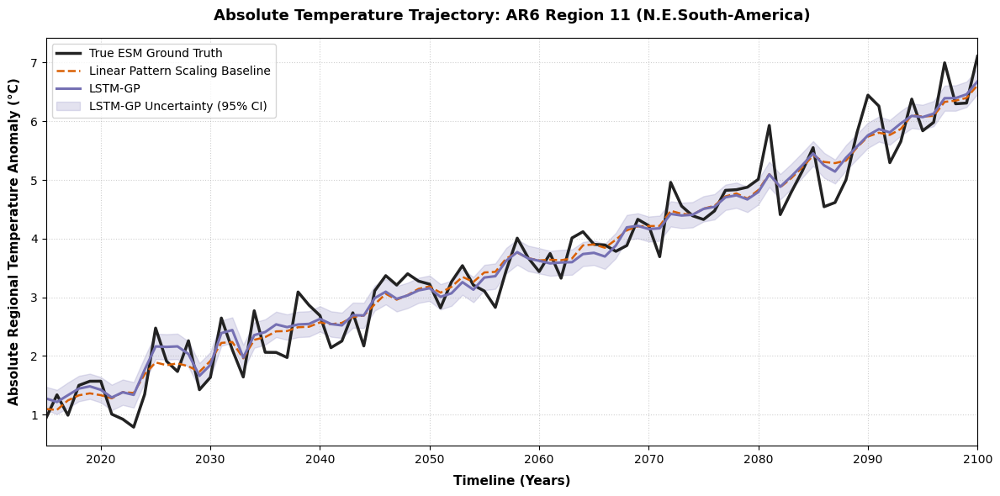

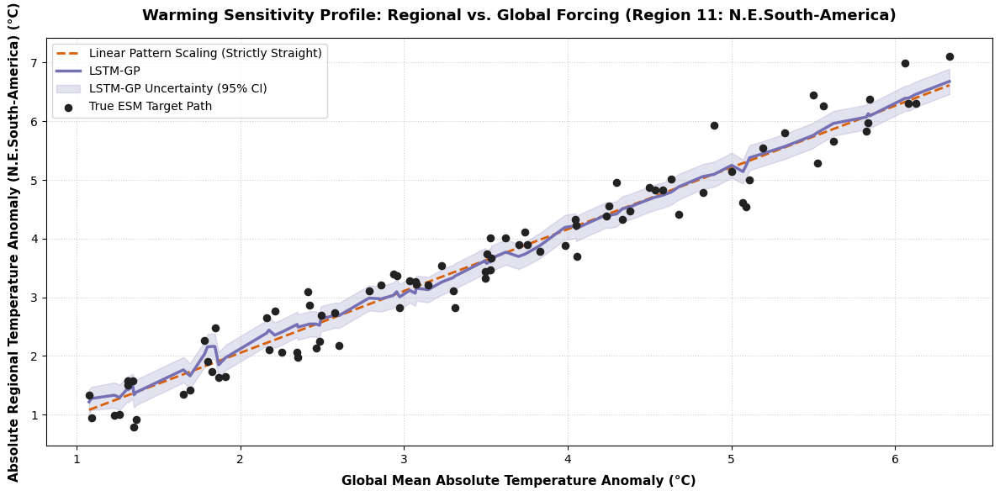

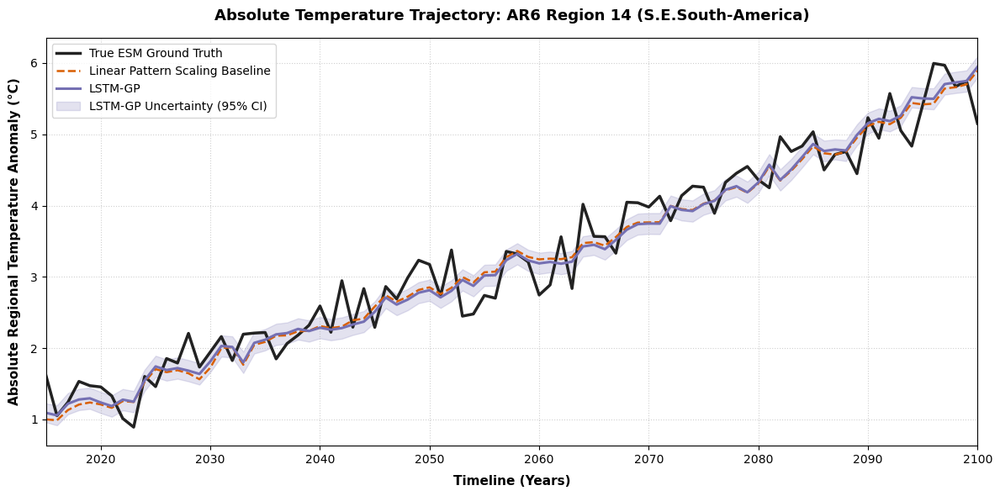

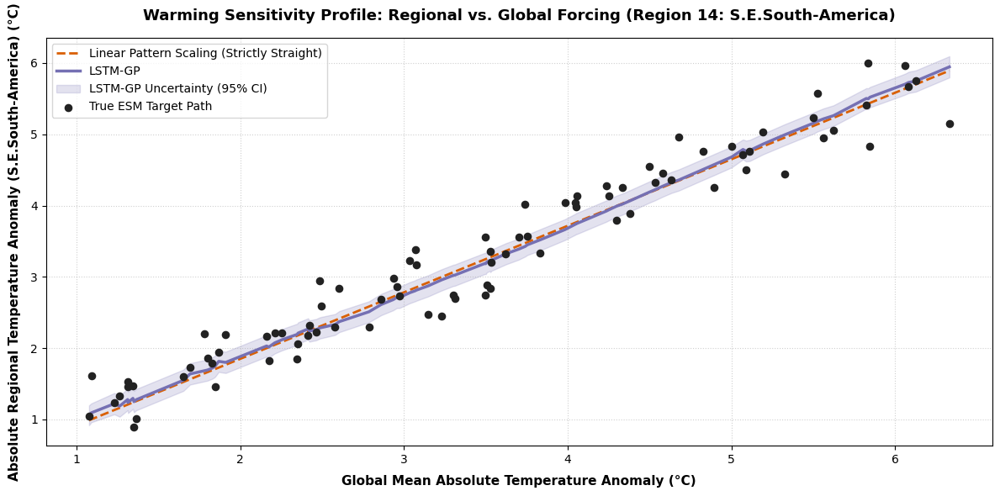

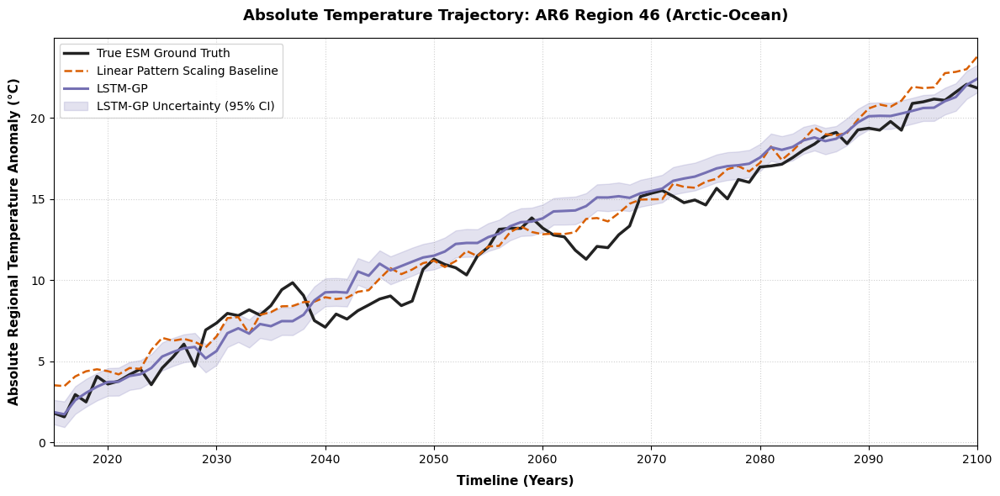

...

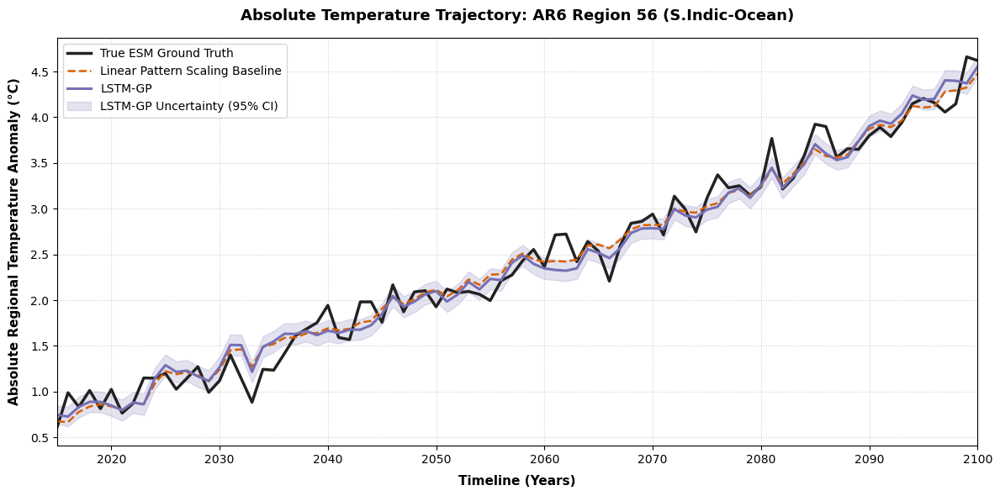

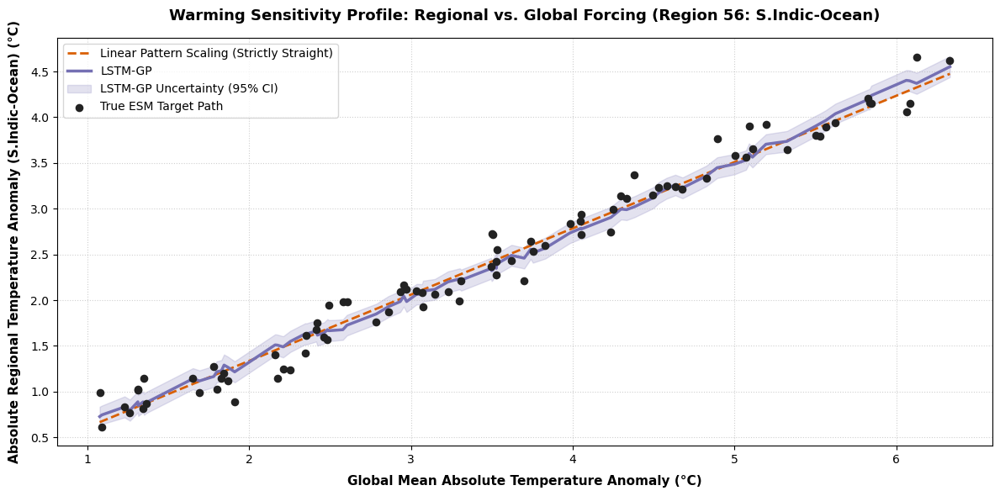

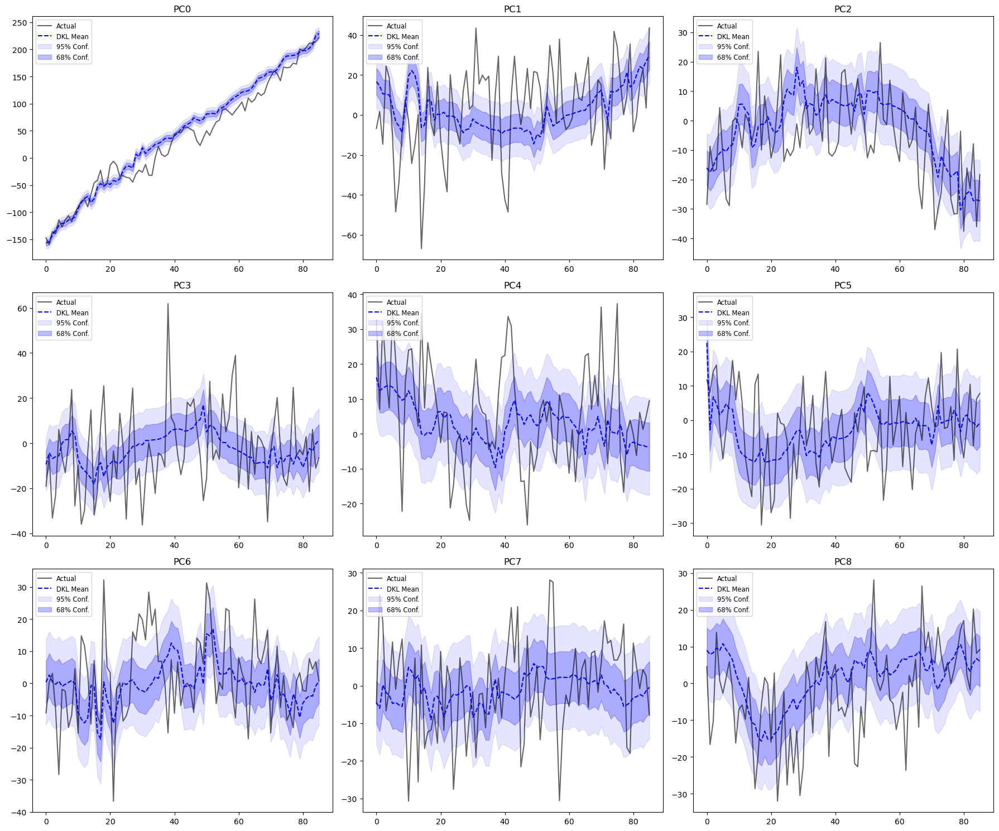

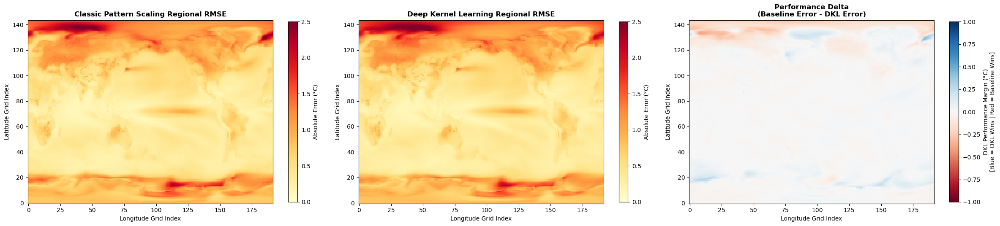

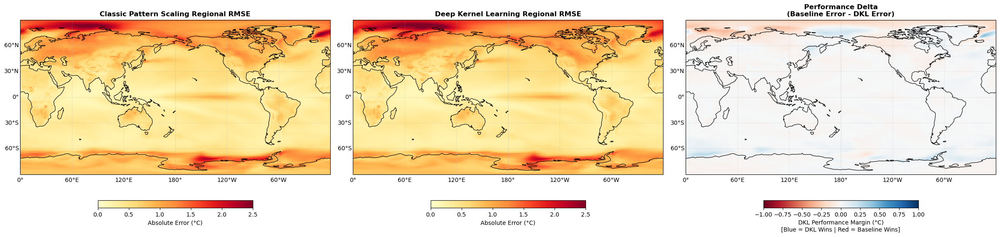

Calculated 90th percentile threshold for GP weakness: 0.0554°C


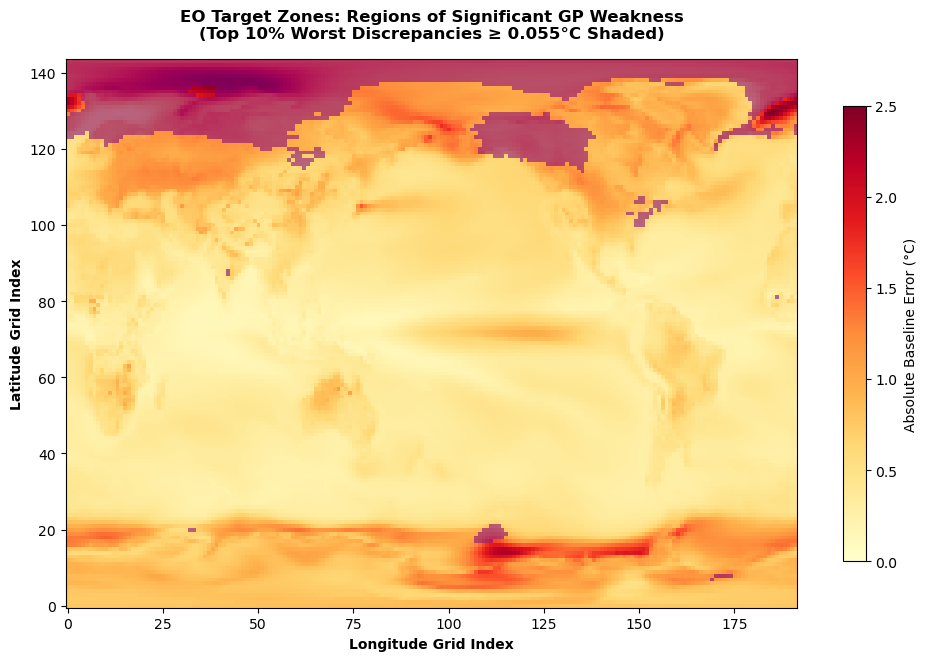

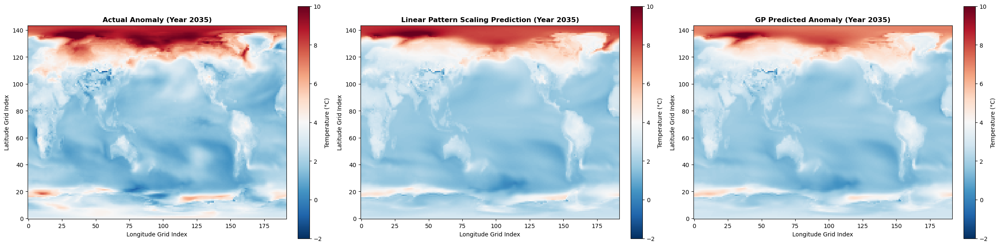

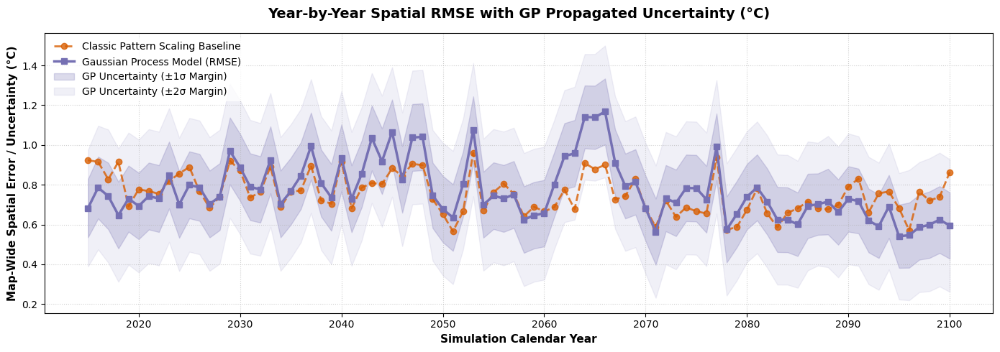

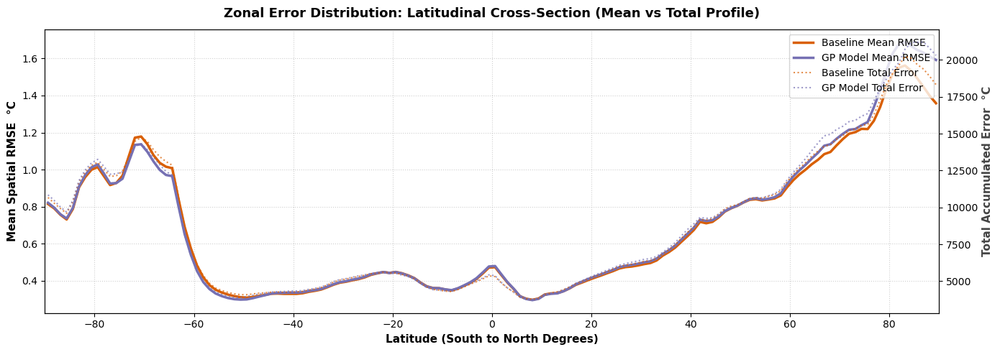

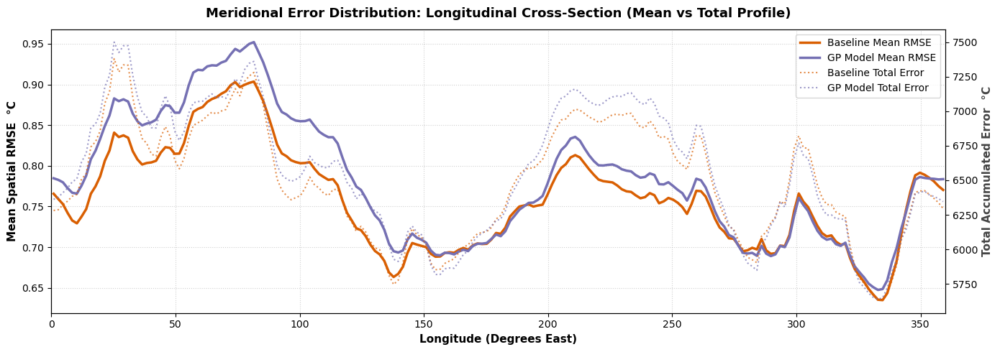

Test for dataset SSP534-os
Valid test years: 61
Prediction complete!
DEBUG - Flattened Squared Errors Shape: (1686528,)
DEBUG - Tiled Weights Shape:            (1686528,)
DEBUG - Final Scored Vector Length:     1686528
DEBUG - Total weights sum: 3.127102697968553e+16
📊 Number of chronological years actually evaluated: 61.00 years

--- Baseline Regional Evaluation Summary ---
📍 Area-weighted Baseline Arctic Spatio-Temporal RMSE: 1.9137°C
📍 Area-weighted Baseline West Antarctic Spatio-Temporal RMSE: 1.1949°C
📍 Area-weighted Baseline N.W. North America (LAND) Spatio-Temporal RMSE: 1.1596°C
📍 Area-weighted Baseline East Asia (LAND) Spatio-Temporal RMSE: 0.5900°C
📍 Area-weighted Baseline North South America (LAND) Spatio-Temporal RMSE: 0.5567°C

--- Machine Learning Regional Evaluation Summary ---
🚀 Area-weighted ML Arctic Spatio-Temporal RMSE: 1.4688°C
🚀 Area-weighted ML West Antarctic Spatio-Temporal RMSE: 1.1750°C
🚀 Area-weighted ML N.W. North America (LAND) Spatio-Temporal RMSE: 1.3210°

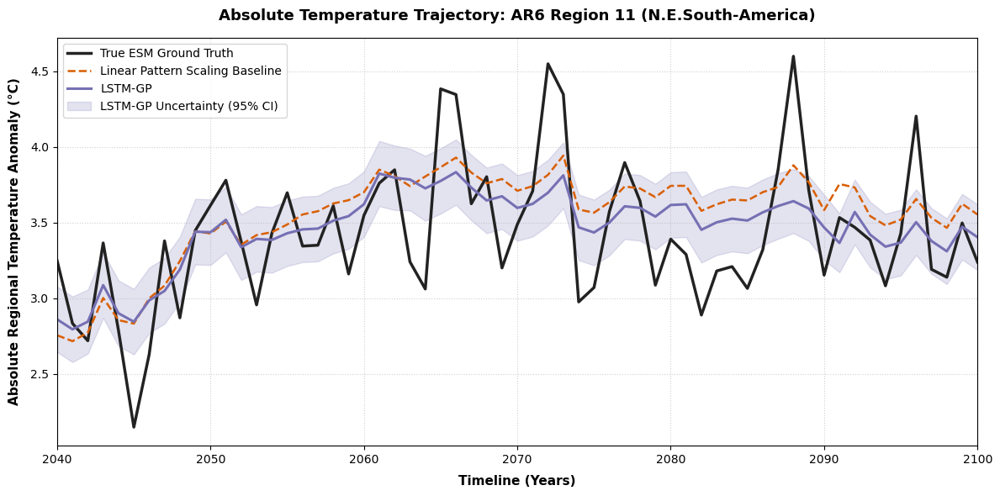

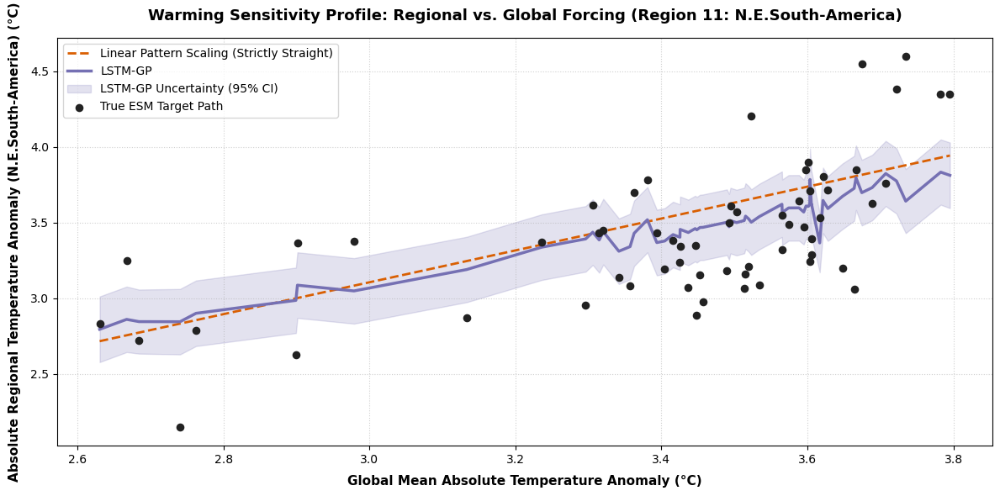

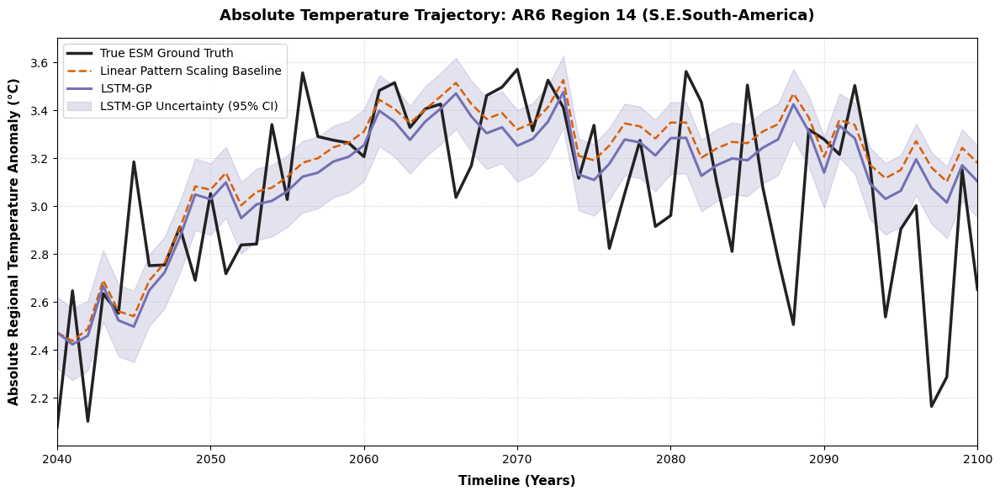

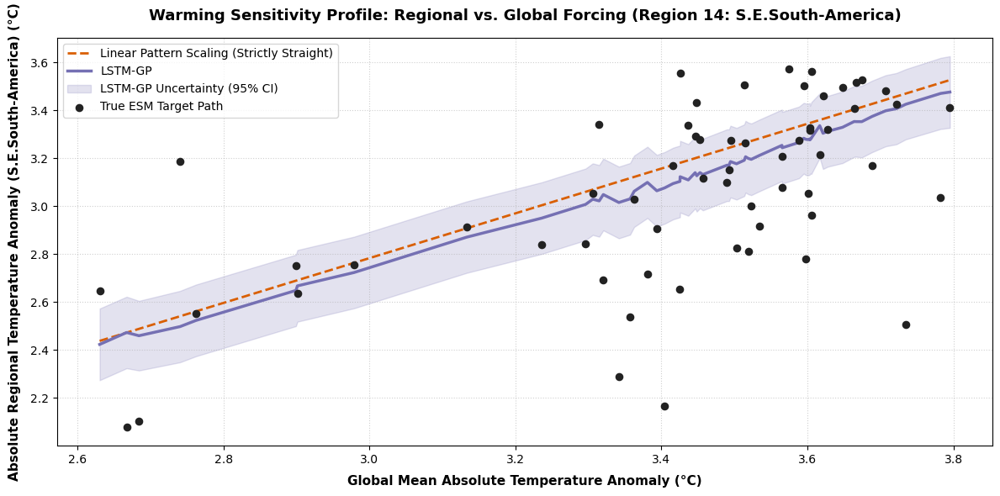

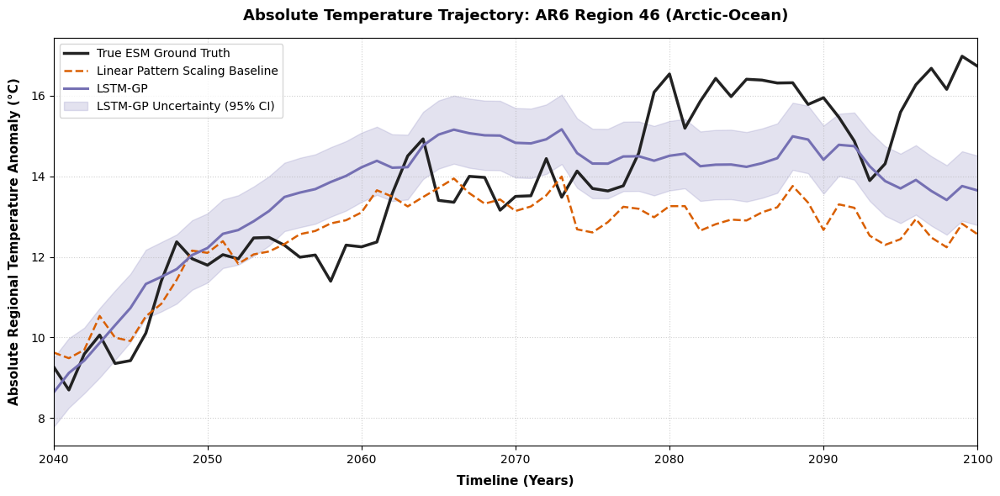

...

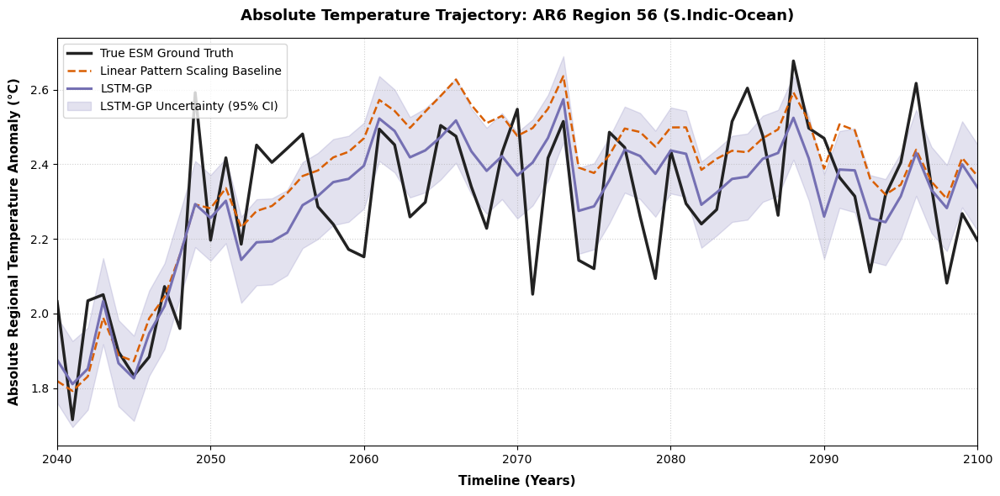

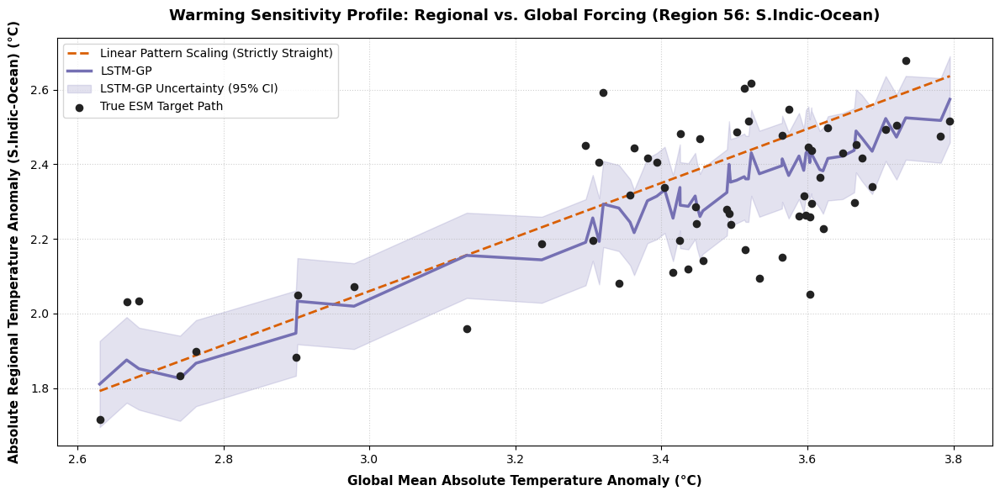

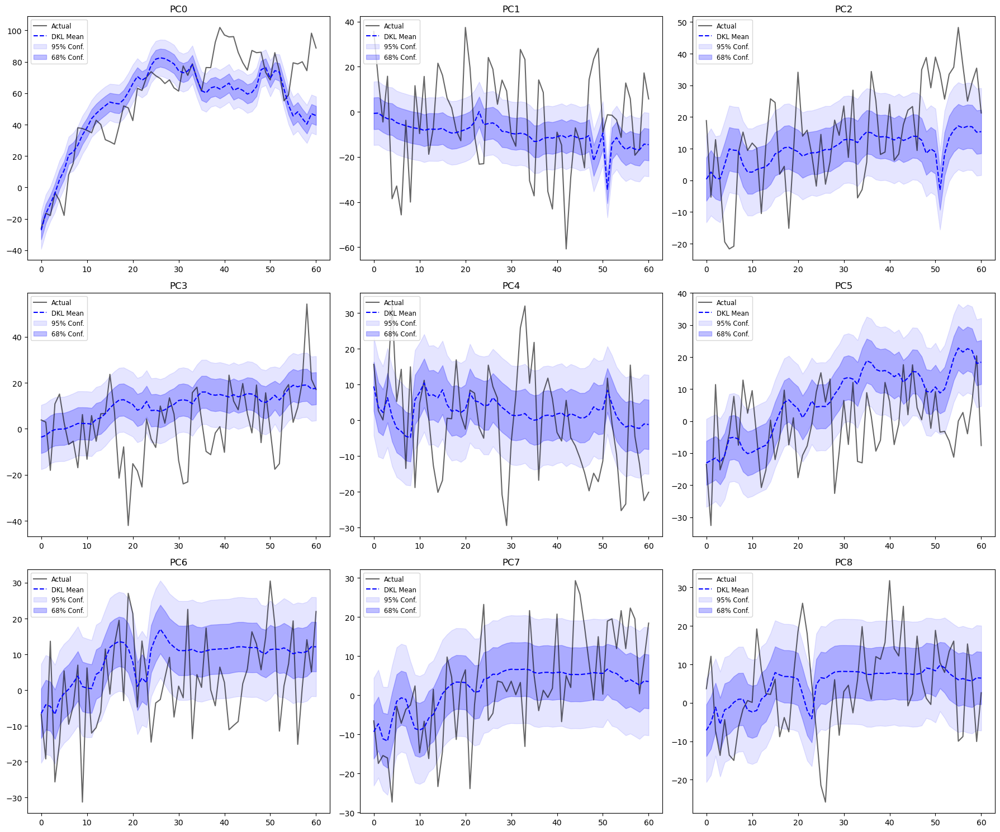

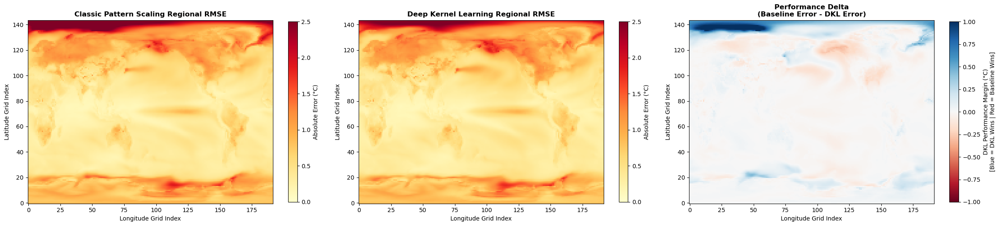

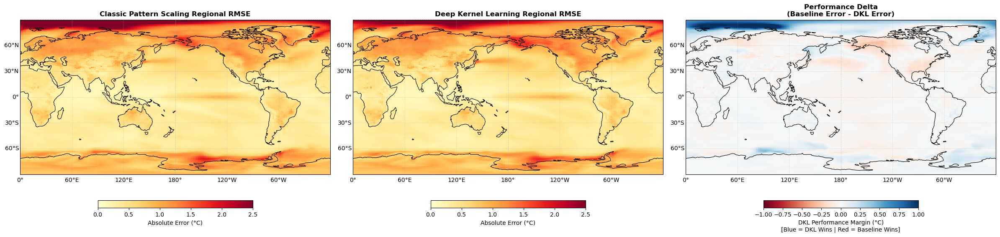

Calculated 90th percentile threshold for GP weakness: 0.0442°C


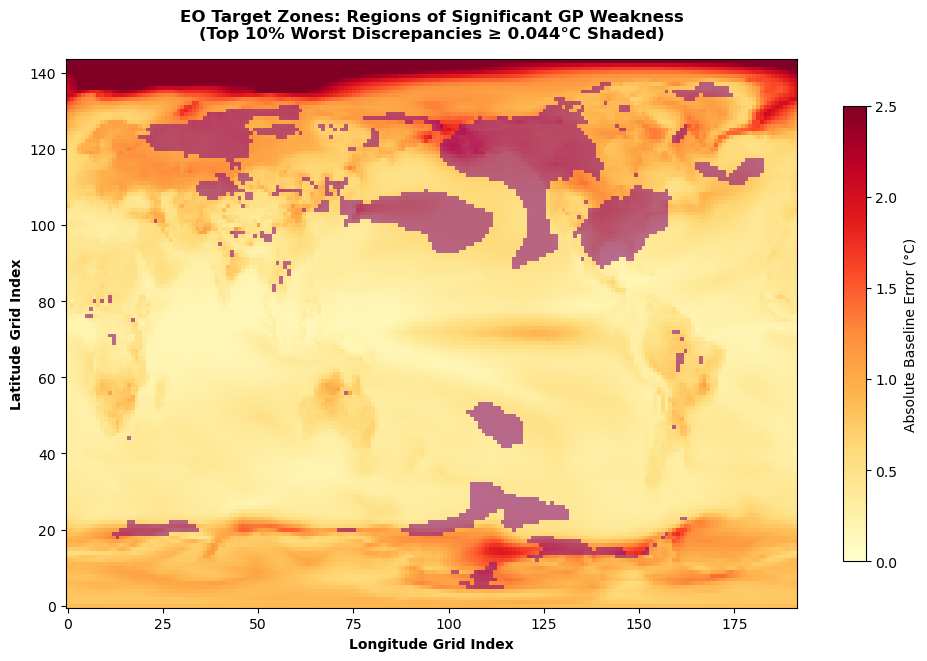

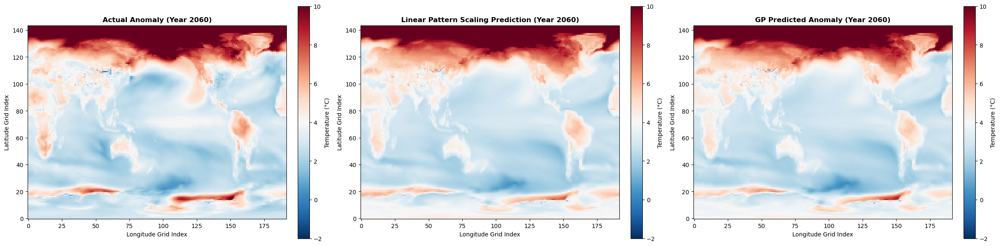

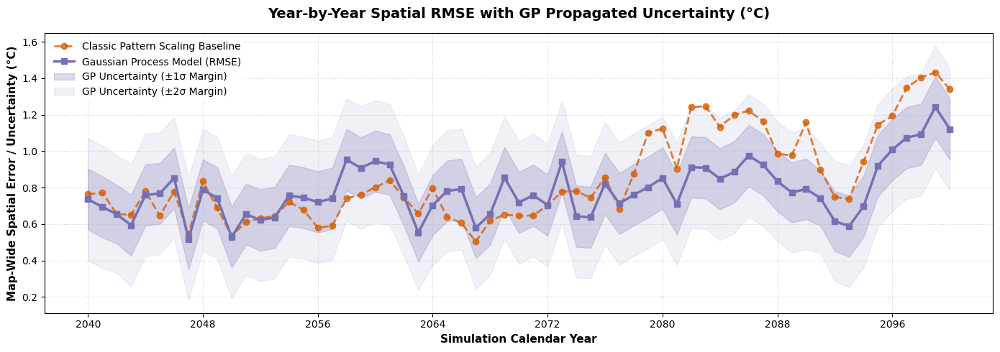

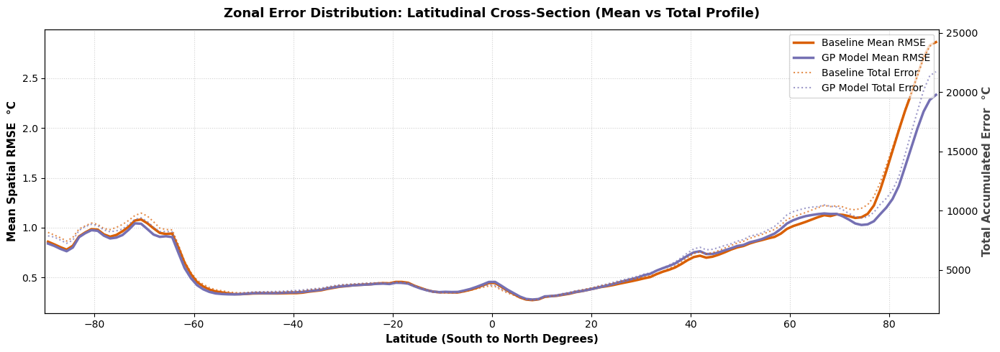

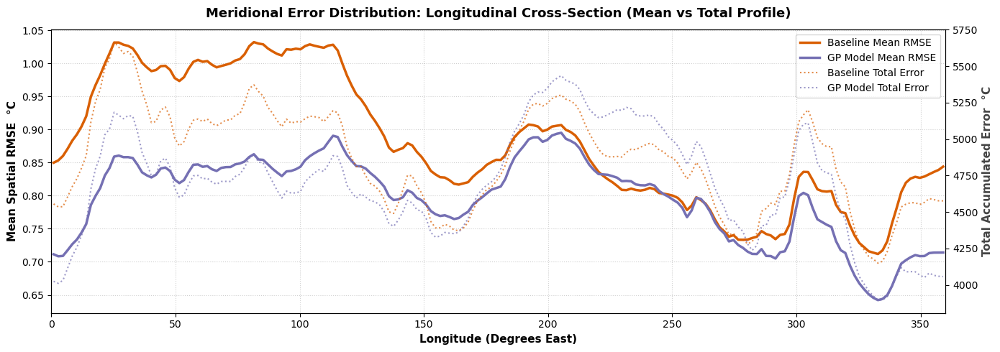

In [51]:
## TESTS ##
if '=' in metric:#'tas' in metric.split("=")[0] and "=" in metric:
    print("====================\nTest for dataset SSP37O\n============")
    tas_predicting_net_pr_test(temp_val, pr_val)
    print("Test for dataset SSP534-os\n================")
    tas_predicting_net_pr_test(temp_test, pr_test)
else:
    if train_error_correction_framework:
        print("################ Applying regional corrections ###########################################")
    
        print("====================\nTest for dataset SSP37O\n============")
        test(validation_set, use_regional_corrections=True)
        print("Test for dataset SSP534-os\n================")
        test(dataset_test, use_regional_corrections=True)
    else:
        print("############# No regional corrections #################################################")
        print("====================\nTest for dataset SSP37O\n============")
        test(validation_set)
        print("Test for dataset SSP534-os\n================")
        test(dataset_test)
    
    
    